<a href="https://colab.research.google.com/github/zyduan202/BASF_Project2/blob/main/Uncorrelated_inputs_set1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

`Uncorrelated inputs set1` and `Uncorrelated inputs set2`: These files contain code structured similarly to `Identify key descriptors`, but they work with uncorrelated input features.

**Project**: Catalyst Design with Decision Trees and Shapley Additive Explanations

**Member**: Zhaoyan Duan, Haotong Xie

**Task**: suppress or eliminate the influence of reaction conditions to highlight the effects of catalytic descriptors
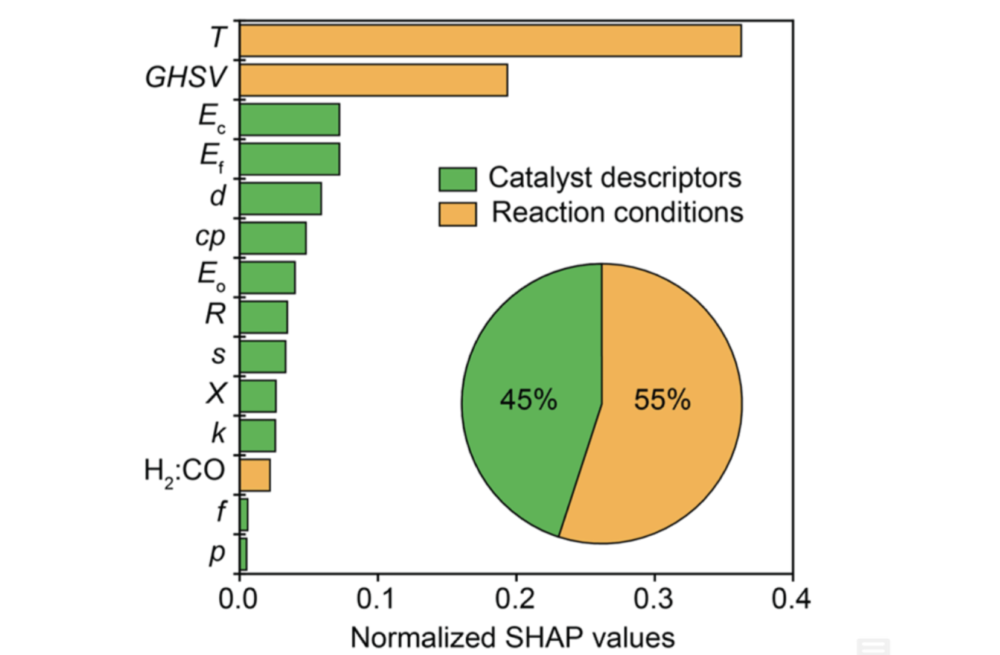

# A. Data preparation

In [ ]:
!pip install shap
!pip install scikit-optimize

import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import operator
import inspect
from operator import itemgetter
from math import sqrt
from joblib import dump, load
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, LeaveOneOut
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, ElasticNet, Lasso
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RationalQuadratic, ConstantKernel, WhiteKernel
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.decomposition import PCA
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from xgboost import XGBRegressor


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 2.3 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
# Import the dataset
data = pd.read_excel('/content/PNNL_data_FinalCurated.xlsx', sheet_name ='Initial set')

In [ ]:
# given the dataset structure:
# reference row = reaction conditions
# metal rows = reaction conditions + catalytic descriptors
# unreasonable to mix reference and metal rows then consider the correlation between catalytic descriptors

data_metal = data[17:]

X_metal_des = data_metal[["crystal radius",'Pauling Electronegativity','FE','OE',
          'valence s','valence p',"valence d",'valence f','specific heat',
          "thermal conductivity","Cohesive energy"]]

y_metal = data_metal['F_STY']

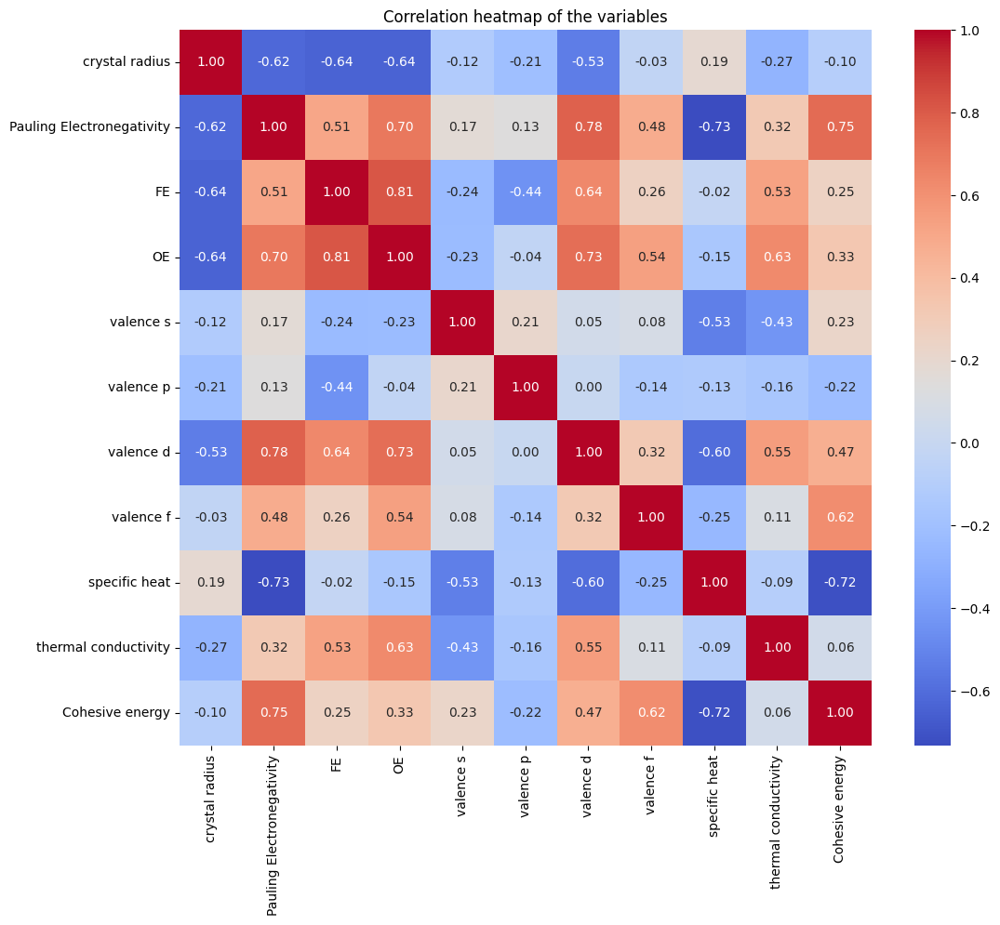

In [ ]:
# Calculate the correlation matrix
corr_matrix = X_metal_des.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation heatmap of the variables")
plt.show()

In [ ]:
# Find pairs of variables with absolute correlation greater than 0.7
# > 0.7 -> strong correlation

correlated_pairs = {}

for column in corr_matrix:
    curr_corr_values = corr_matrix[column]
    for index, value in curr_corr_values.items():
        if abs(value) > 0.70 and index != column:
            pair = tuple(sorted([index, column]))
            if pair not in correlated_pairs:
                correlated_pairs[pair] = value

correlated_pairs

{('Pauling Electronegativity', 'valence d'): 0.7797006785323707,
 ('Pauling Electronegativity', 'specific heat'): -0.7330913398221995,
 ('Cohesive energy', 'Pauling Electronegativity'): 0.7484555055427825,
 ('FE', 'OE'): 0.8106490808773396,
 ('OE', 'valence d'): 0.7295169645999955,
 ('Cohesive energy', 'specific heat'): -0.7157021878159755}

**two set of input features:**

set 1: without OE, Pauling Electronegativity, specific heat -> 11-3=8 input features
> X_des1 = data[["crystal radius",'FE',
          'valence s','valence p',"valence d",'valence f',"thermal conductivity","Cohesive energy"]]

set 2: without OE, Pauling Electronegativity, cohesive energy -> 11-3=8 input features
> X_des2 = data[["crystal radius",'FE',
          'valence s','valence p',"valence d",'valence f','specific heat',"thermal conductivity"]]
          



# B. Class and methods



### ModelEvaluatorBayes

In [ ]:
## Aug20: debugged and tested
## Aug19: new algorithm: combined approach, nonzero SHAP rank + nonzero frequency -> Integrated Imporantance Score

class ModelEvaluatorBayes:
    def __init__(self, X, y, random_seeds, model, param_space, kernel=None, results_dict={}, IIS_dict={}, model_dict={}):
        self.X = X
        self.y = y
        self.model = model
        self.param_space = param_space
        self.kernel = kernel
        self.performance_metrics = []
        self.parameters = {}  # Updated to dictionary
        self.seed_shap_dict = {} # Store mean absolute SHAP values across seeds
        self.stored_shap_values = {} # Store SHAP values across seeds for the plot_SHAP method
        self.results_dict = results_dict
        self.IIS_dict = IIS_dict
        self.model_dict = model_dict
        self.temp_shap_rank_dict = {feature: [] for feature in self.X.columns} # Store feature rank based on its SHAP value
        self.non_zero_shap_freq_dict = {feature: 0 for feature in self.X.columns}

        if isinstance(random_seeds, int):
            self.random_seeds = [random_seeds]
        elif isinstance(random_seeds, (list, np.ndarray)):
            self.random_seeds = random_seeds

    def _calculate_shap_values(self, model_fitted, seed):
        """Calculate SHAP values and SHAP value ranking for a given model and seed."""
        try:
            explainer = shap.Explainer(model_fitted, self.X_train)
        except:
            explainer = shap.Explainer(model_fitted.predict, self.X_train)

        shap_values = explainer(self.X_train)
        self.stored_shap_values[seed] = shap_values
        seed_shap_values = {feature_name: np.mean(np.abs(shap_values.values[:, i])) for i, feature_name in enumerate(self.X_train.columns)}
        self.seed_shap_dict[seed] = seed_shap_values

        # Calculate frequency of non-zero SHAP values for each feature.
        for feature_name, value in seed_shap_values.items():
            if value != 0:
                self.non_zero_shap_freq_dict[feature_name] += 1

        non_zero_shap_features = [k for k, v in seed_shap_values.items() if v != 0]
        seed_shap_ranks = {k: rank+1 for rank, k in enumerate(sorted(non_zero_shap_features, key=seed_shap_values.get, reverse=True))}

        for feature_name, shap_rank in seed_shap_ranks.items():
            self.temp_shap_rank_dict[feature_name].append(shap_rank)


    def _calculate_IIS(self):
        # mean_shap_ranks = {}

        # Compute average rank across seeds only for non-zero ranks
        mean_shap_ranks = {feature: np.mean(ranks) for feature, ranks in self.temp_shap_rank_dict.items() if ranks}

        # Compute frequency of non-zero SHAP values
        total_seeds = len(self.random_seeds)
        non_zero_frequency = {feature: freq / total_seeds for feature, freq in self.non_zero_shap_freq_dict.items()}

        # Combine average rank and frequency
        alpha, beta = 0.33, 0.67  # These weights can be adjusted based on needs

        # self.IIS_data = {}
        IIS_data = {}

        for feature in self.X.columns:
            if feature not in mean_shap_ranks and non_zero_frequency.get(feature, 0) == 0:
                # If SHAP value is zero across all seeds, set IIS to 0
                iis_value = 0
                mean_rank = None
                frequency = 0
            else:
                iis_value = alpha * (1 / mean_shap_ranks.get(feature, float('inf'))) + beta * non_zero_frequency.get(feature, 0) ### 这行仔细看下
                mean_rank = mean_shap_ranks.get(feature, None)
                frequency = non_zero_frequency.get(feature, 0) * 100  # Convert to percentage

            IIS_data[feature] = [mean_rank, frequency, iis_value]

        self.IIS_dict[self.model.__name__] = IIS_data

    def _calculate_evaluation_metrics(self, model_fitted):
        train_r2 = model_fitted.score(self.X_train, self.y_train)
        test_r2 = model_fitted.score(self.X_test, self.y_test)

        y_predicted_train = model_fitted.predict(self.X_train)
        y_predicted_test = model_fitted.predict(self.X_test)

        train_rmse = sqrt(mean_squared_error(self.y_train, y_predicted_train))
        test_rmse = sqrt(mean_squared_error(self.y_test, y_predicted_test))

        accuracies = cross_val_score(estimator=model_fitted, X=self.X_train, y=self.y_train, cv=5)
        cv_r2 = accuracies.mean()

        return {
            'train_r2': train_r2,
            'test_r2': test_r2,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'cv_r2': cv_r2
        }

    def evaluate_model(self):
        # self.temp_shap_rank_dict = {feature: [] for feature in self.X.columns}
        metrics_accumulator = []

        for seed in self.random_seeds:
            self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=0.2, random_state=seed)

            if issubclass(self.model, GaussianProcessRegressor) and self.kernel:
                estimator = self.model(kernel=self.kernel, random_state=seed)
            elif 'random_state' in self.model.get_params(self.model()):
                estimator = self.model(random_state=seed)
            else:
                estimator = self.model()

            tuning = BayesSearchCV(estimator=estimator,
                                  search_spaces=self.param_space,
                                  cv=10, #########
                                  n_jobs=-1,
                                  random_state=seed)
            tuning.fit(self.X_train, self.y_train)

            # Special handling for GaussianProcessRegressor
            if issubclass(self.model, GaussianProcessRegressor) and self.kernel:
                model_fitted = GaussianProcessRegressor(kernel=self.kernel,
                                                        alpha=tuning.best_estimator_.alpha,
                                                        n_restarts_optimizer=10,
                                                        random_state=seed)
                model_fitted.fit(self.X_train, self.y_train)
            else:
                model_fitted = tuning.best_estimator_
                model_fitted.fit(self.X_train, self.y_train)

            metrics = self._calculate_evaluation_metrics(model_fitted)
            metrics_accumulator.append(metrics)
            self.performance_metrics.append([seed] + list(metrics.values()))

            self.parameters[seed] = tuning.best_params_

            # Call the SHAP calculation method
            self._calculate_shap_values(model_fitted, seed)

            self.model_dict[self.model.__name__ + "_seed_" + str(seed)] = model_fitted

            print('Random seed ' + str(seed) + ' finished')
            print()

        mean_metrics = {metric: np.mean([result[metric] for result in metrics_accumulator]) for metric in metrics_accumulator[0]}
        self.results_dict[self.model.__name__] = mean_metrics

        self._calculate_IIS()

    def show_performance(self):
        return pd.DataFrame(self.performance_metrics, columns=['random_seed', 'training R2', 'test R2', 'training RMSE', 'test RMSE', 'cv_score'])

    def show_parameters(self):
        return self.parameters

    def show_shap_ranks(self):
        return self.temp_shap_rank_dict

    def show_IIS(self):
        """Return a sorted DataFrame of features with their Integrated Importance Score (IIS), mean rank, and frequency."""

        if not self.IIS_dict or self.model.__name__ not in self.IIS_dict:
            raise ValueError("Please first evaluate the model to compute the IIS values.")

        # Convert nested dictionary to list of lists for DataFrame creation
        data = [[feature] + values for feature, values in self.IIS_dict[self.model.__name__].items()]

        iis_df = pd.DataFrame(data, columns=["Feature", "Mean Rank", "Non-Zero Frequency (%)", "IIS"])

        return iis_df.sort_values(by="IIS", ascending=False)

    def plot_SHAP(self, seed=None):
        if seed == 'all':
            for seed in self.random_seeds:
                self.plot_SHAP(seed)
        else:
            if seed is None:
                seed = self.random_seeds[-1]

            if seed not in self.seed_shap_dict:
                raise ValueError(f"No SHAP values stored for seed {seed}")

            shap_values = self.stored_shap_values[seed]
            shap.plots.bar(shap_values, max_display=15)


## IISDataAnalysis

In [ ]:
class IISDataAnalysis:

    def __init__(self, results={}, IIS={}, models={}, results_csv_name='df_results.csv',
                 models_joblib_name='models.joblib', iis_full_csv_name='df_IIS_full.csv', iis_csv_name='df_IIS.csv'):

        # Check if provided filenames are strings
        for arg, value in {'results_csv_name': results_csv_name, 'models_joblib_name': models_joblib_name, 'iis_full_csv_name': iis_full_csv_name, 'iis_csv_name': iis_csv_name}.items():
            if not isinstance(value, str):
                raise ValueError(f"The argument {arg} should be a string. Received: {type(value)}")

        self.results = results
        self.IIS = IIS
        self.models = models
        self.results_csv_name = results_csv_name
        self.models_joblib_name = models_joblib_name
        self.iis_full_csv_name = iis_full_csv_name
        self.iis_csv_name = iis_csv_name
        self._process_data()

    def _process_data(self):
        self.df_results = pd.DataFrame(self.results).T
        self.df_results.to_csv(self.results_csv_name)

        dump(self.models, self.models_joblib_name)

        temp_data = {}
        for model, features in self.IIS.items():
            for feature, values in features.items():
                for i, value_name in enumerate(['Mean Rank', 'Non-Zero Frequency(%)', 'IIS']):
                    col_name = (model, value_name)
                    if col_name not in temp_data:
                        temp_data[col_name] = {}
                    temp_data[col_name][feature] = values[i]
        self.df_IIS_full = pd.DataFrame(temp_data).T
        self.df_IIS_full.to_csv(self.iis_full_csv_name)

        # Extracting IIS values into a new DataFrame with models as rows and features as columns
        self.df_IIS = self.df_IIS_full.loc(axis=0)[:, 'IIS']
        self.df_IIS = self.df_IIS.droplevel(1, axis=0) # drop the level of 'IIS'
        self.df_IIS.to_csv(self.iis_csv_name)

    def show_model_performance(self):
        return self.df_results

    def get_IIS_mean_rank(self):
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        iis_ranks = df_ranked.T
        mean_ranks = iis_ranks.mean(axis=1).round(3)
        std_ranks = iis_ranks.std(axis=1).round(3)
        results_df = pd.DataFrame({
            'Feature': mean_ranks.index,
            'Mean Rank': mean_ranks.values,
            'Standard Deviation': std_ranks.values
        })
        return results_df

    def plot_IIS_mean_rank(self):
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        mean_ranks = df_ranked.mean().sort_values()
        sorted_columns = mean_ranks.index.tolist()
        plt.figure(figsize=(14, 10))
        sns.boxplot(data=df_ranked[sorted_columns], orient="v")
        plt.title('Box Plot of IIS Ranks across Models')
        plt.ylabel('IIS Ranks')
        plt.xlabel('Features')
        plt.gca().invert_yaxis()
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    def show_IIS_values(self):
        return self.df_IIS

    def show_IIS_details(self):
        return self.df_IIS_full

    def show_IIS_ranks(self):
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        return df_ranked


## define_search_space

because of `X_train.shape[1]`, the search space is not the same for models using different approaches

In [ ]:
def define_search_space(X_train):
    param_space_DT = {
        'max_depth': Integer(1, 10),
        'min_samples_split': Real(0.01, 0.1, 'uniform'),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Integer(1, X_train.shape[1])
    }

    param_space_RF = {
        'max_depth': Integer(1, 10),
        'min_samples_split': Real(0.01, 0.1, 'uniform'),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Integer(1, X_train.shape[1])
    }

    param_space_GB = {
        'n_estimators': Integer(10, 200),
        'max_depth': Integer(1, 10),
        'learning_rate': Real(1e-3, 1, 'log-uniform'),
        'min_samples_split': Integer(2, 10),
        'min_samples_leaf': Integer(1, 10),
    }

    param_space_XGB = {
        'n_estimators': Integer(10, 200),
        'max_depth': Integer(1, 10),
        'learning_rate': Real(1e-3, 1, 'log-uniform'),
        'reg_alpha': Real(1e-6, 100.0, 'log-uniform'),
        'reg_lambda': Real(1e-6, 100.0, 'log-uniform'),
    }

    param_space_SVR = {'C': Real(1e-1, 1000, prior='log-uniform'),
                   'gamma': Categorical(['scale', 'auto']),
                   'epsilon': Real(0.1, 0.5, prior='uniform'),
                   'kernel': Categorical(['rbf', 'sigmoid'])
                  }

    param_space_GP = {
        'kernel__k1__k1__constant_value': Real(1e-1, 1e3, 'log-uniform'),
        'kernel__k1__k2__length_scale': Real(1e-6, 1e-1, 'log-uniform'),
        'kernel__k1__k2__alpha': Real(1e-1, 1e6, 'log-uniform'),
        'kernel__k2__noise_level': Real(1e-1, 1e3, 'log-uniform'),
        'alpha': Real(1e-2, 1e4, 'log-uniform'),
    }

    param_space_KNN = {
        'n_neighbors': Integer(3, 21),
        'weights': Categorical(['uniform', 'distance']),
        'p': Integer(1, 2)
    }

    return param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN


# C. Approach 1

Data normalisation w.r.t reference samples

Ideas:

input features = catalytic descriptors + reaction conditions

- input features in metal rows: catalytic descriptors + reaction conditions

- input features in reference rows: reaction conditions

- target variable: metal rows - reference rows = catalytic descriptors

Procedure:
1.   compare metal rows with reference rows:
			if ∣Temp_K(ref._i) - Temp_K(metal_j)∣ ≤ 10
               ∣GHSV(ref._i) - GHSV(metal_j)∣ ≤ 100     
			   ∣H2CO(ref._i) - H2CO(metal_j)∣ ≤ 0.5
			then y_(metal_i) - y_(ref._j) = y_normalised
2.   build a model with catalytic descriptors as input features and y_normalised as target




## 1. Subtraction

In [ ]:
# Change the unit of Temperature.
# Kelvin(K) used in the paper, Celsius degree in dataset

# Kelvin = Celsius + 273.15
data['Temp_K'] = data['Temp'] + 273

# Show min and max of the Temp_K of the reference rows
min_Temp_K = data[data['P1'] == 0]['Temp_K'].min()
max_Temp_K = data[data['P1'] == 0]['Temp_K'].max()
print("reference row min_Temp_K:", min_Temp_K)
print("reference row max_Temp_K:", max_Temp_K)

# Show min and max of the Temp_K of the metal rows
min_Temp_K = data[data['P1'] != 0]['Temp_K'].min()
max_Temp_K = data[data['P1'] != 0]['Temp_K'].max()
print("metal row min_Temp_K:", min_Temp_K)
print("metal row max_Temp_K:", max_Temp_K)

reference row min_Temp_K: 528
reference row max_Temp_K: 597
metal row min_Temp_K: 528
metal row max_Temp_K: 675


In [ ]:
# Delete outlier whose Temp_K > 597+10=607
# See below for reasons

data1 = data[data['Temp_K'] <= 607]

print('number of reference rows:', sum(data1['P1']==0))
print('number of metal rows:', sum(data1['P1']!=0))

data1
# 189 -> 175 observations

number of reference rows: 17
number of metal rows: 158


,Rh,Mn,P1,FE,OE,Covalent Radius,ionic radius,crystal radius,Pauling Electronegativity,MB electonegativity,...,SHC,Catalyst_Density,STY,C2OXY_STY,TOT_X2OXY,F_STY,F_C2OXY,F_TOT,Alcohol Ratio,Temp_K
0,NaN,NaN,0,0.000,0.000,0.00,0.00,0.00,0.00,0.00,...,24.31,3.25,30,90,120,9.230769,27.692308,36.923077,0.333333,528
1,NaN,NaN,0,0.000,0.000,0.00,0.00,0.00,0.00,0.00,...,34.03,3.25,40,110,150,12.307692,33.846154,46.153846,0.363636,553
2,NaN,NaN,0,0.000,0.000,0.00,0.00,0.00,0.00,0.00,...,24.59,3.25,60,70,130,18.461538,21.538462,40.000000,0.857143,578
3,NaN,NaN,0,0.000,0.000,0.00,0.00,0.00,0.00,0.00,...,24.31,3.25,27,86,113,8.307692,26.461538,34.769231,0.313953,528
4,NaN,NaN,0,0.000,0.000,0.00,0.00,0.00,0.00,0.00,...,34.03,3.25,43,111,154,13.230769,34.153846,47.384615,0.387387,553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,NaN,NaN,Sn,-0.463,-1.646,1.41,1.45,0.69,1.96,1.88,...,29.47,3.25,30,50,80,9.230769,15.384615,24.615385,0.600000,549
184,NaN,NaN,Sn,-0.463,-1.646,1.41,1.45,0.69,1.96,1.88,...,14.61,3.25,80,150,230,24.615385,46.153846,70.769231,0.533333,572
185,NaN,NaN,Sn,-0.463,-1.646,1.41,1.45,0.69,1.96,1.88,...,17.66,3.25,120,160,280,36.923077,49.230769,86.153846,0.750000,587
186,NaN,NaN,Sn,-0.463,-1.646,1.41,1.45,0.69,1.96,1.88,...,15.82,3.25,160,200,360,49.230769,61.538462,110.769231,0.800000,598


In [ ]:
# Show min and max of the H2CO of the reference rows
min_H2CO = data[data['P1'] == 0]['H2CO'].min()
max_H2CO = data[data['P1'] == 0]['H2CO'].max()
print("reference row min_H2CO:", min_H2CO) # 528
print("reference row max_H2CO:", max_H2CO) # 597

# Show min and max of the Temp_K of the metal rows
min_H2CO = data[data['P1'] != 0]['H2CO'].min()
max_H2CO = data[data['P1'] != 0]['H2CO'].max()
print("metal row min_H2CO:", min_H2CO) # 528
print("metal row max_H2CO:", max_H2CO) # 597

reference row min_H2CO: 1.8
reference row max_H2CO: 2.1
metal row min_H2CO: 1.8
metal row max_H2CO: 2.6


**H2CO**

When the absolute difference of H2CO is set to 0.8, all datapoints in metal rows can find a match in the reference row regarding H2CO.

However, if we allow a large difference, including H2CO in the matching condition has little meaning. Nevertheless, in the previous part, we observed that H2CO is one of the least important features for the prediction. Therefore, having a too restricted absolute difference, which leads to fewer successful matches, is not necessary.

Therefore, we temporarily chose 0.5 as the threshold, which gives us 140 matches.


**Temp_K**

In the descriptive analysis part of the paper, the k-means clustering is based on Temp_K±10K, so we follow this.

**GHSV**

Besides, in most metal rows, the GHSV takes the value 7500, 11000 and 15000. Only several datapoints has 7400 in GHSV. So we set the absolute difference ± 100 to include these datapoints.

---
The absolute difference can be modified based on domain knowledge.

In [ ]:
def compare_rows(data, show_comparison = False):
    """
    Compares rows in a given DataFrame based on conditions applied to specific columns.

    Parameters:
    - data (DataFrame): The input DataFrame which contains columns 'P1', 'Temp_K', 'GHSV', 'H2CO', and 'F_STY'.
    - show_comparison (bool): If set to True, the function will print comparisons for rows that satisfy conditions.

    Returns:
    - results_df (DataFrame): DataFrame containing rows from 'data' that satisfy the given conditions, along with an additional column 'F_STY_normalised' which represents the difference in 'F_STY' values between the metal and reference rows.

    How the function works:
    1. Filter rows where 'P1' is 0. These are considered 'reference rows'.
    2. Filter rows where 'P1' is not 0 (promoters). These are considered 'metal rows'.
    3. For each 'metal row':
        - Try to find a matching 'reference row' based on the following conditions:
            * Difference in 'Temp_K' values is less than or equal to 10.
            * Difference in 'GHSV' values is less than or equal to 100.
            * Difference in 'H2CO' values is less than or equal to 0.5.
        - If a matching 'reference row' is found:
            * Calculate 'F_STY_normalised' as the difference between 'F_STY' values of the 'metal row' and the 'reference row'.
            * If 'show_comparison' is True, print details of the 'metal row' and its matching 'reference row'.
        - If no matching 'reference row' is found, print a message indicating so.
    4. Return the results as a DataFrame.
    """

    reference_rows = data[data['P1'] == 0]
    metal_rows = data[data['P1'] != 0]

    results = []

    # Iterate over each metal row
    for i in range(len(metal_rows)):
        # Extract current metal row
        metal_row = metal_rows.iloc[i]

        # Create a flag to track if a matching reference row is found
        match_found = False

        # Iterate over each reference row
        for j in range(len(reference_rows)):
            # Extract current reference row
            reference_row = reference_rows.iloc[j]

            # Check conditions
            if (abs(metal_row['Temp_K'] - reference_row['Temp_K']) <= 10 and
                abs(metal_row['GHSV'] - reference_row['GHSV']) <= 100 and
                abs(metal_row['H2CO'] - reference_row['H2CO']) <= 0.5):
                # Calculate F_STY_normalised
                F_STY_normalised = metal_row['F_STY'] - reference_row['F_STY']

                # Combine current metal row with F_STY_normalised
                result_row = metal_row.copy()
                result_row['F_STY_normalised'] = F_STY_normalised

                # Append result_row to results list
                results.append(result_row)

                # If show_comparison is TRUE, print the comparison
                if (show_comparison):
                    print(f"Metal row {i} (GHSV={metal_row['GHSV']}, Temp_K={metal_row['Temp_K']}) is matched with reference row {j} (GHSV={reference_row['GHSV']}, Temp_K={reference_row['Temp_K']})")

                # Set the flag to True as we found a matching reference row
                match_found = True

                # Exit inner loop as we found a matching reference row
                break

        # If no match was found, print a message
        if not match_found:
            print(f"Metal row {i} has no match.")

    results_df = pd.DataFrame(results)

    return results_df


In [ ]:
data2 = compare_rows(data1, show_comparison=True)
len(data2)
# 140 metal rows are matched with a reference row -> new data set for step 2: fitting

Metal row 0 (GHSV=7500, Temp_K=530) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 1 (GHSV=7500, Temp_K=549) is matched with reference row 7 (GHSV=7500, Temp_K=550)
Metal row 2 (GHSV=11000, Temp_K=574) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 3 (GHSV=11000, Temp_K=588) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 4 (GHSV=11000, Temp_K=600) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 5 (GHSV=7500, Temp_K=529) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 6 (GHSV=7500, Temp_K=529) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 7 (GHSV=11000, Temp_K=572) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 8 (GHSV=11000, Temp_K=596) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 9 (GHSV=11000, Temp_K=580) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 10 (GHSV=7500, Temp_K=529) is matched with reference row 6

140

## Fitting with y_normalized and catalytic descriptors

### Prepare input features and target variable

In [ ]:
# the residuals of the subtraction as new target variable
y_nor = data2['F_STY_normalised']
y_nor

17     -3.076923
18    -12.307692
19    -21.538462
20    -27.692308
21    -21.538462
         ...    
183    -3.076923
184    -3.076923
185    -3.076923
186     9.230769
187     6.153846
Name: F_STY_normalised, Length: 140, dtype: float64

In [ ]:
print(np.mean(data2['F_STY']))
print(np.mean(data2['F_STY_normalised']))

27.610989010989012
2.9956043956043956


In [ ]:
# set 1: without OE, Pauling Electronegativity, specific heat -> 11-3=8 input features
X_des = data2[["crystal radius", 'FE',
               'valence s', 'valence p', "valence d", 'valence f',
               "thermal conductivity", "Cohesive energy"]]

X_train, X_test, y_train, y_test = train_test_split(X_des, y_nor, test_size = 0.2, random_state = 0)

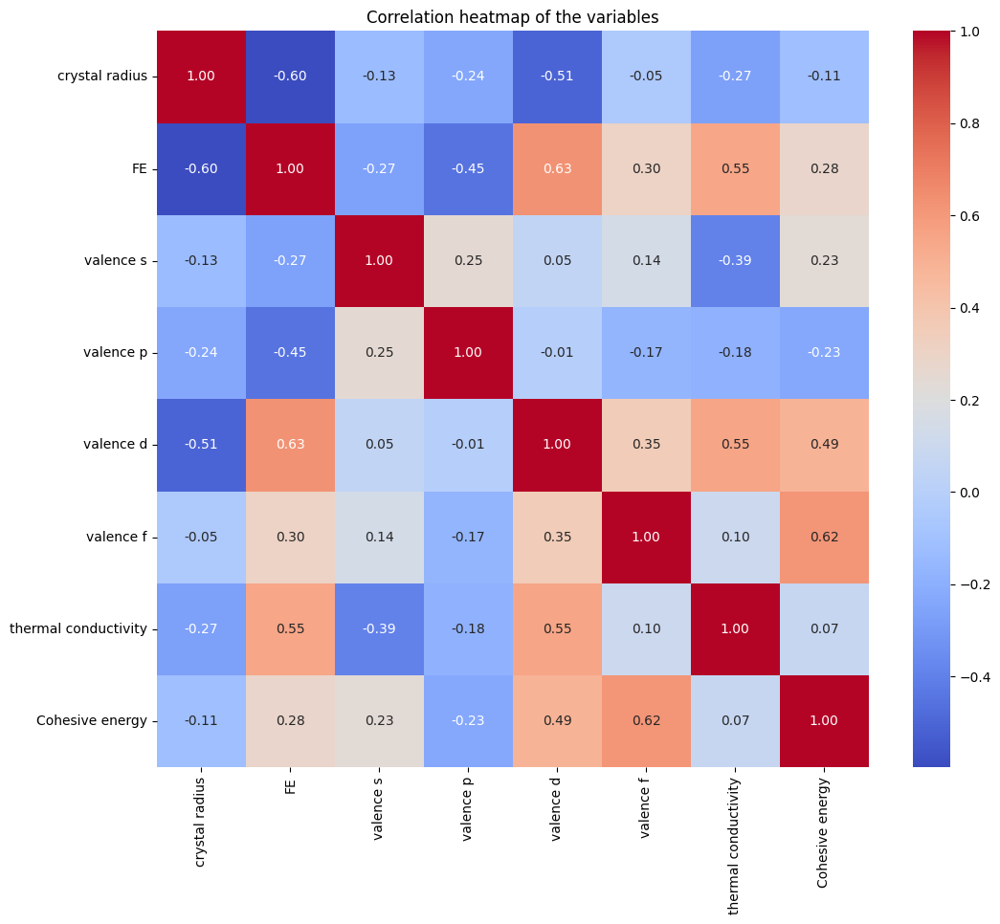

In [ ]:
# Calculate the correlation matrix
corr_matrix = X_des.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation heatmap of the variables")
plt.show()

In [ ]:
# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
print(len(X_train))
print(len(X_test))

112
28


In [ ]:
# Initial an empty dictionary to store the evaluation metrics
results_sub = {}

# Initial an empty dictionary to store the integrated importance score(IIS)
IIS_sub = {}

# initialize an empty dictionary to store models
models_sub = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)

model_DT = ModelEvaluatorBayes(X_des, y_nor, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_DT.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished

Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_DT.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.222222,90.0,0.873000
0,crystal radius,2.666667,90.0,0.726750
6,thermal conductivity,3.888889,90.0,0.687857
1,FE,3.833333,60.0,0.488087
4,valence d,1.500000,40.0,0.488000
3,valence p,5.000000,30.0,0.267000
5,valence f,4.000000,20.0,0.216500
2,valence s,5.000000,20.0,0.200000


In [ ]:
model_DT.show_shap_ranks()

{'crystal radius': [2, 5, 3, 2, 3, 3, 2, 2, 2],
 'FE': [4, 4, 7, 3, 2, 3],
 'valence s': [6, 4],
 'valence p': [5, 4, 6],
 'valence d': [1, 3, 1, 1],
 'valence f': [4, 4],
 'thermal conductivity': [3, 3, 2, 4, 8, 2, 5, 3, 5],
 'Cohesive energy': [1, 2, 1, 1, 2, 1, 1, 1, 1]}

In [ ]:
model_DT.show_parameters()

{0: OrderedDict([('max_depth', 5),
              ('max_features', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 1: OrderedDict([('max_depth', 7),
              ('max_features', 2),
              ('min_samples_leaf', 6),
              ('min_samples_split', 0.04411357481510421)]),
 2: OrderedDict([('max_depth', 9),
              ('max_features', 7),
              ('min_samples_leaf', 2),
              ('min_samples_split', 0.05376866265355667)]),
 3: OrderedDict([('max_depth', 5),
              ('max_features', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 4: OrderedDict([('max_depth', 8),
              ('max_features', 6),
              ('min_samples_leaf', 3),
              ('min_samples_split', 0.06560101818142133)]),
 5: OrderedDict([('max_depth', 4),
              ('max_features', 2),
              ('min_samples_leaf', 7),
              ('min_samples_split', 0.054432846422119444)]),
 6: OrderedDict(

In [ ]:
model_DT.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.747294,0.349248,7.418938,13.149106,0.647880
1,1,0.593280,0.513425,9.036612,11.677089,0.351300
2,2,0.786764,0.161104,6.701462,15.292680,0.666470
3,3,0.667896,0.663071,8.916373,7.601695,0.588499
4,4,0.665367,0.689685,8.580602,8.893171,0.478899
5,5,0.580711,0.551847,9.708661,10.173225,0.421013
6,6,0.677624,0.429812,8.722923,10.028505,0.597763
7,7,0.680050,0.578130,8.293947,10.724520,0.403917
8,8,0.645547,0.677257,8.799769,9.042545,0.521658
9,9,0.635125,0.659408,8.396515,11.159269,0.540603


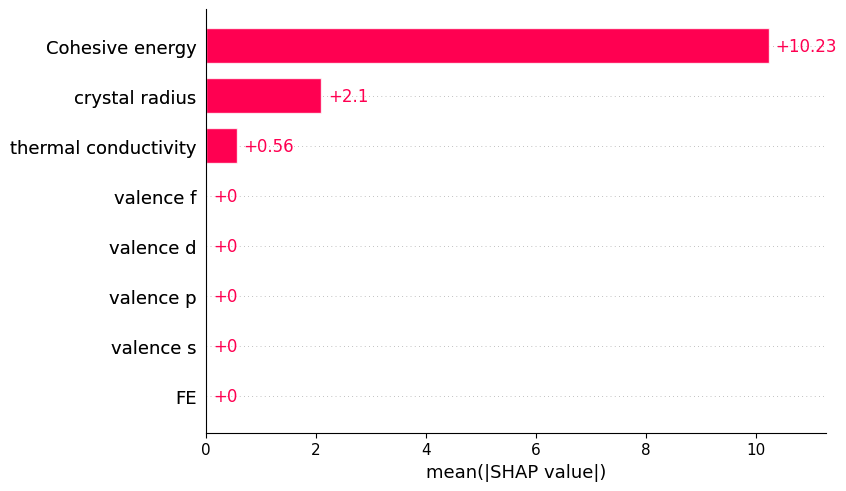

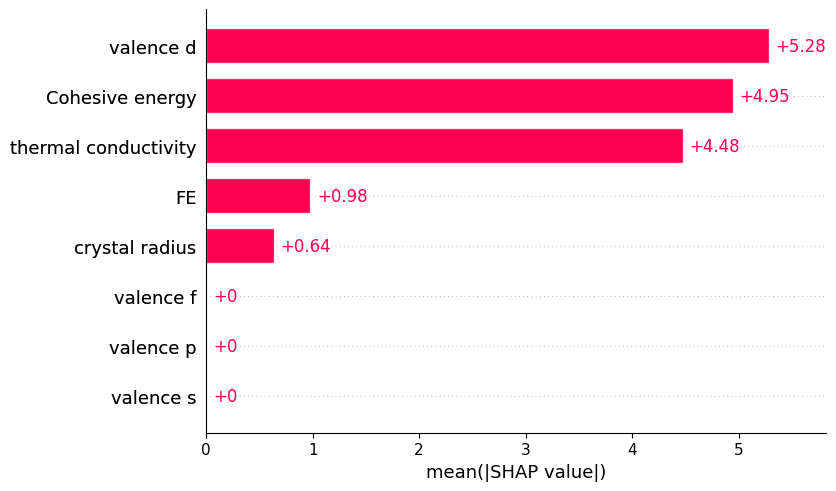

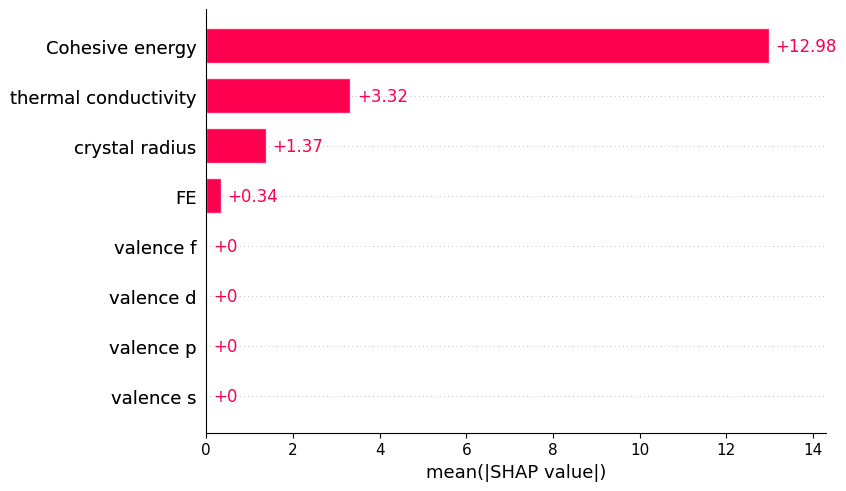

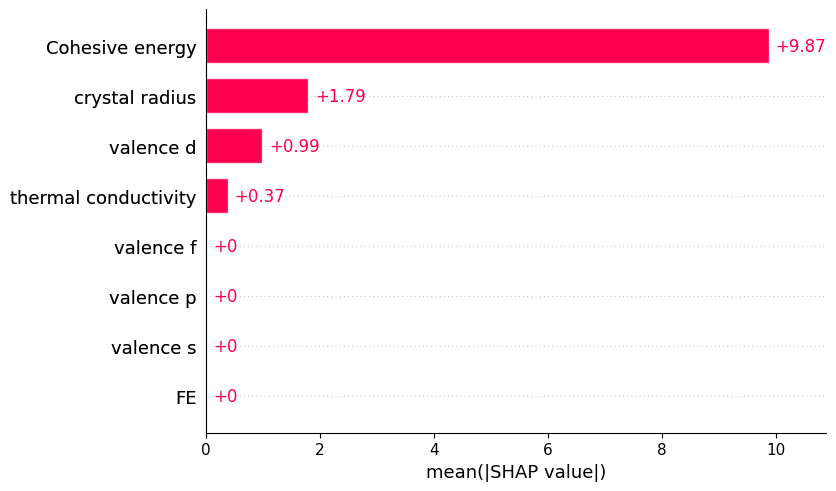

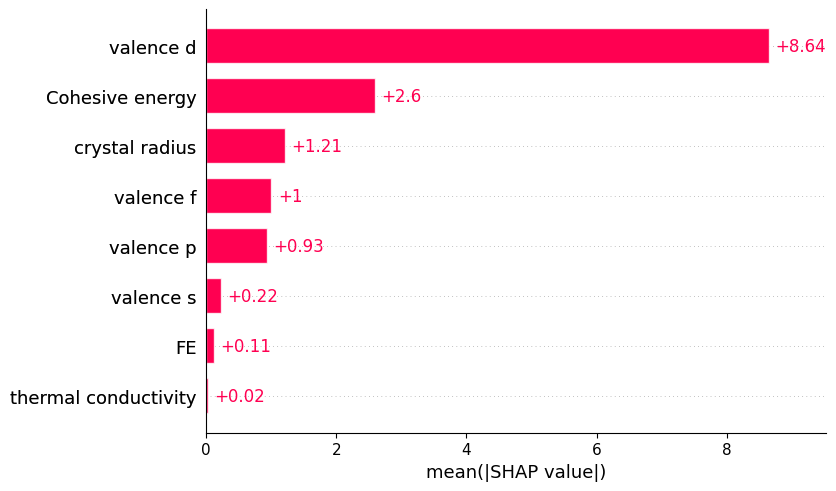

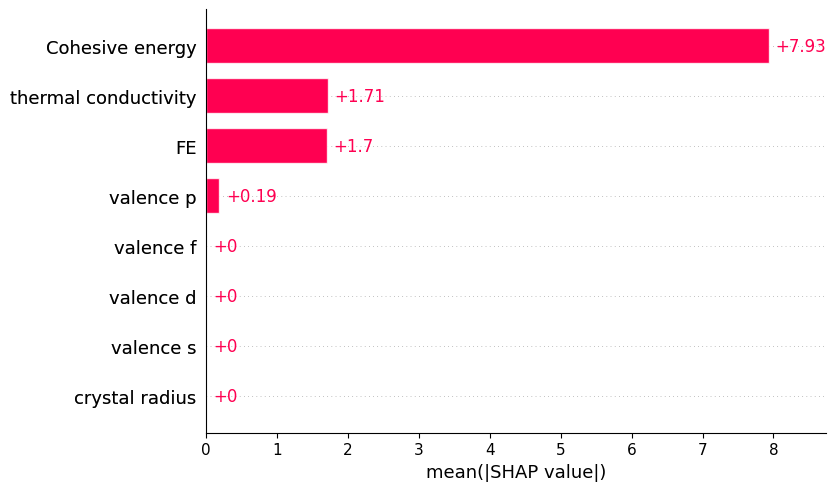

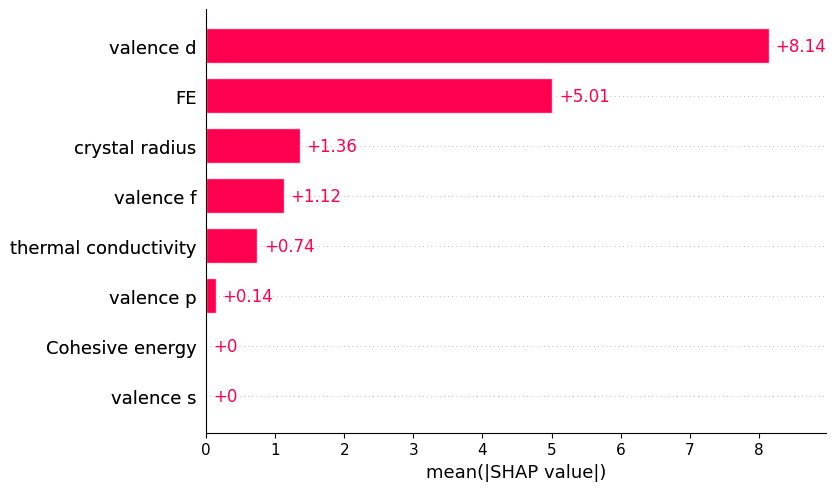

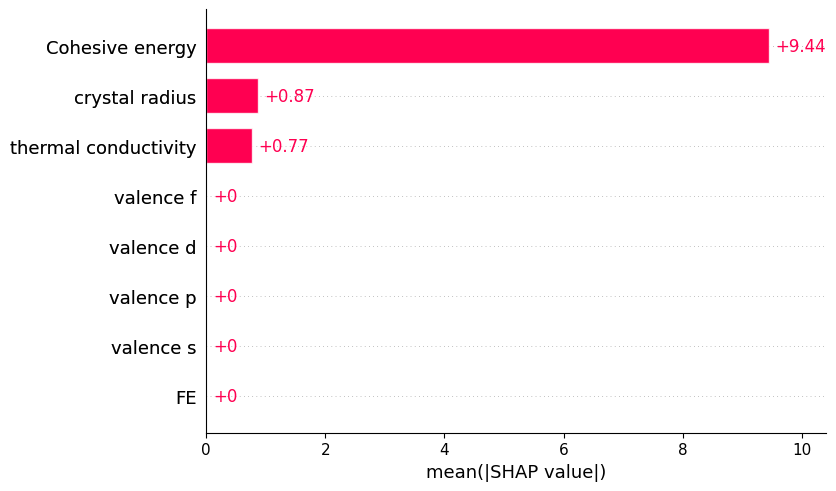

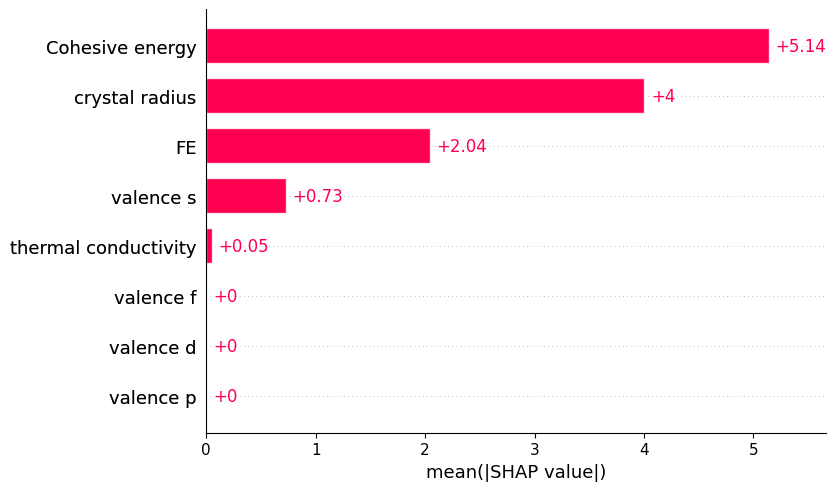

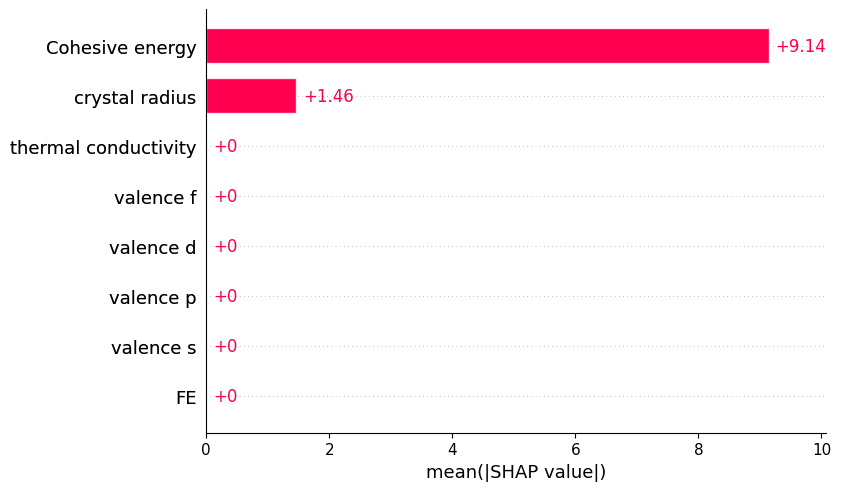

In [ ]:
model_DT.plot_SHAP('all')

### Random Forest


In [ ]:
random_seeds = np.arange(0,10)

model_RF = ModelEvaluatorBayes(X_des, y_nor, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_RF.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished



The objective has been evaluated at this point before.


Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished

Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
4,valence d,2.5,100.0,0.802000
1,FE,2.7,100.0,0.792222
7,Cohesive energy,3.2,100.0,0.773125
0,crystal radius,3.4,100.0,0.767059
2,valence s,3.7,100.0,0.759189
6,thermal conductivity,5.5,100.0,0.730000
3,valence p,7.3,100.0,0.715205
5,valence f,7.7,100.0,0.712857


In [ ]:
model_RF.show_shap_ranks()

{'crystal radius': [3, 4, 4, 5, 1, 4, 4, 1, 5, 3],
 'FE': [4, 2, 2, 3, 5, 5, 2, 2, 1, 1],
 'valence s': [6, 1, 5, 4, 2, 1, 6, 6, 2, 4],
 'valence p': [8, 7, 7, 7, 7, 7, 8, 7, 8, 7],
 'valence d': [1, 3, 1, 1, 6, 2, 1, 4, 4, 2],
 'valence f': [7, 8, 8, 8, 8, 8, 7, 8, 7, 8],
 'thermal conductivity': [5, 6, 6, 6, 4, 6, 5, 5, 6, 6],
 'Cohesive energy': [2, 5, 3, 2, 3, 3, 3, 3, 3, 5]}

In [ ]:
model_RF.show_parameters()

{0: OrderedDict([('max_depth', 10),
              ('max_features', 7),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.09909293315746764)]),
 1: OrderedDict([('max_depth', 10),
              ('max_features', 1),
              ('min_samples_leaf', 4),
              ('min_samples_split', 0.0975246018159601)]),
 2: OrderedDict([('max_depth', 7),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 2),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 4: OrderedDict([('max_depth', 10),
              ('max_features', 1),
              ('min_samples_leaf', 2),
              ('min_samples_split', 0.01)]),
 5: OrderedDict([('max_depth', 4),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 6: OrderedDict([('max_depth', 4),
          

In [ ]:
model_RF.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.747905,0.384761,7.409977,12.785278,0.635843
1,1,0.608434,0.495613,8.866668,11.888896,0.414699
2,2,0.786031,0.165073,6.712961,15.256464,0.679901
3,3,0.662688,0.669326,8.986010,7.530800,0.609525
4,4,0.658633,0.673118,8.666508,9.127478,0.481262
5,5,0.652456,0.333158,8.839085,12.409579,0.480995
6,6,0.677245,0.543749,8.728048,8.970760,0.599368
7,7,0.661763,0.548449,8.527674,11.095374,0.451366
8,8,0.652169,0.701438,8.717184,8.697213,0.511557
9,9,0.649329,0.691909,8.231464,10.613484,0.580432


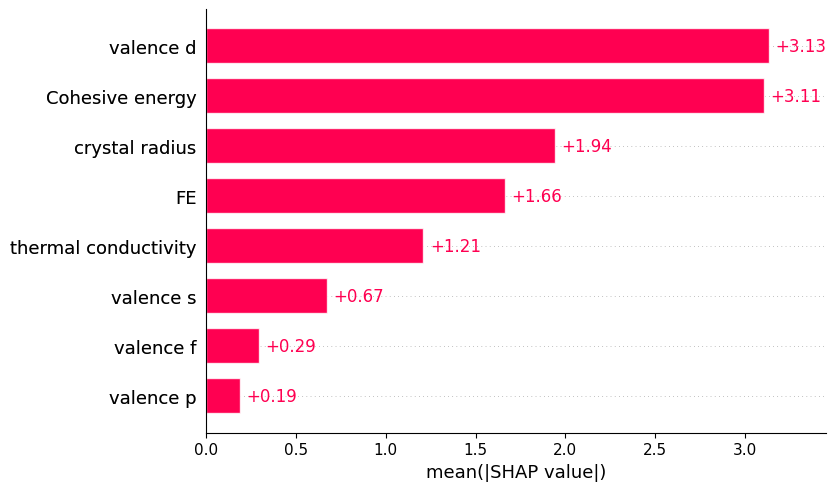

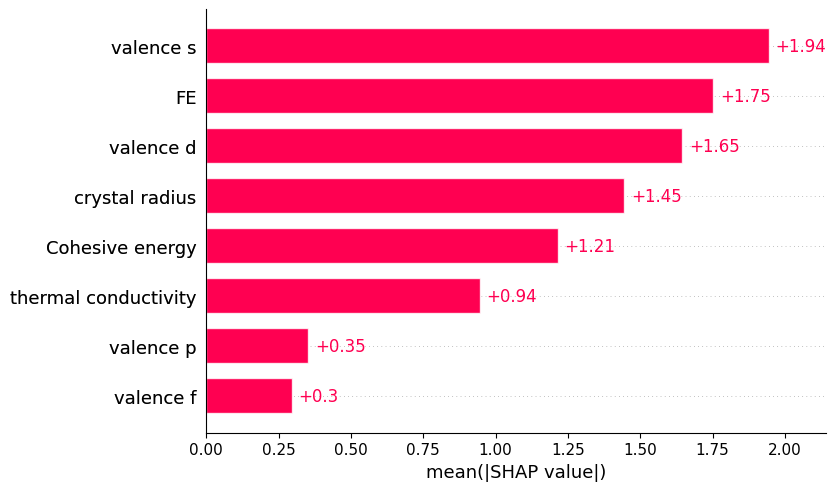

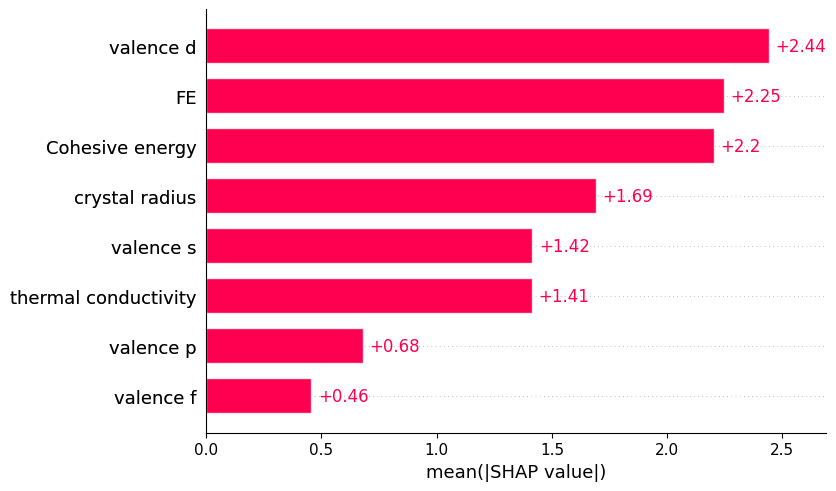

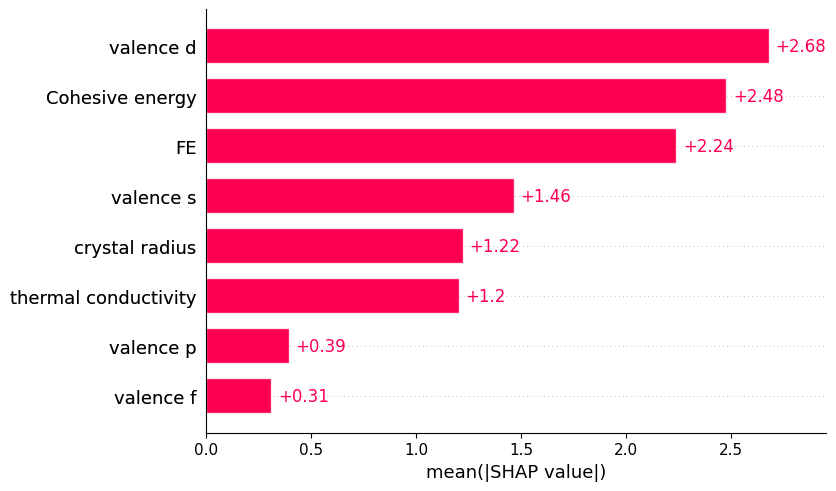

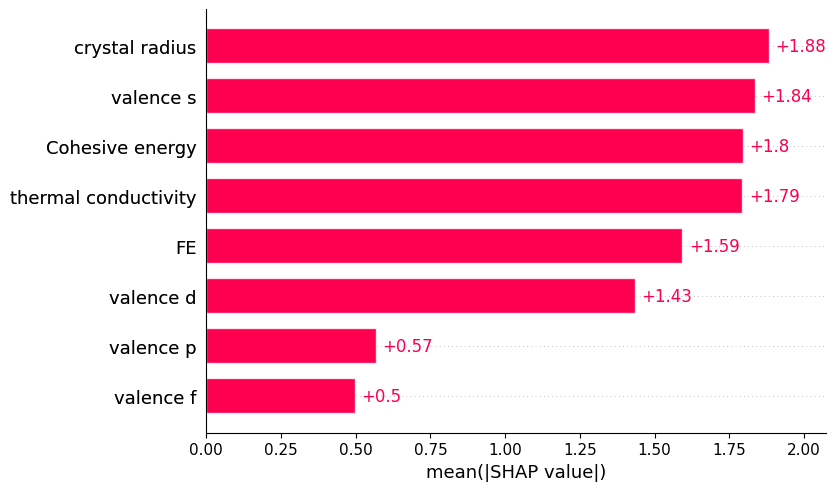

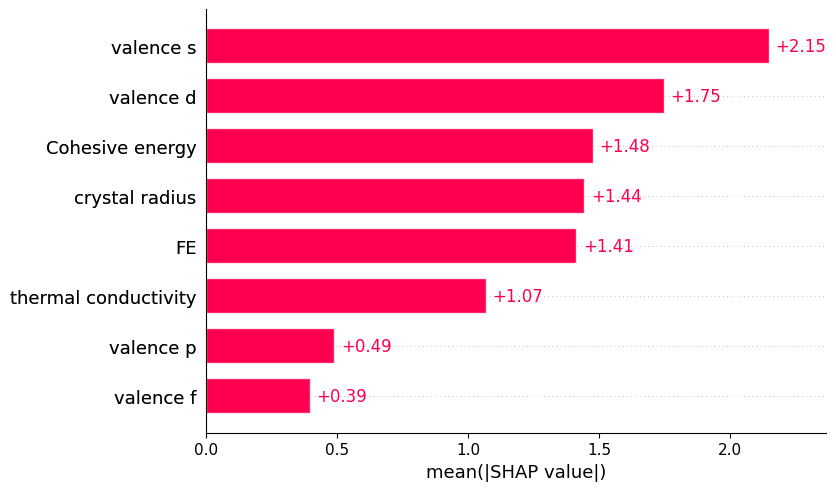

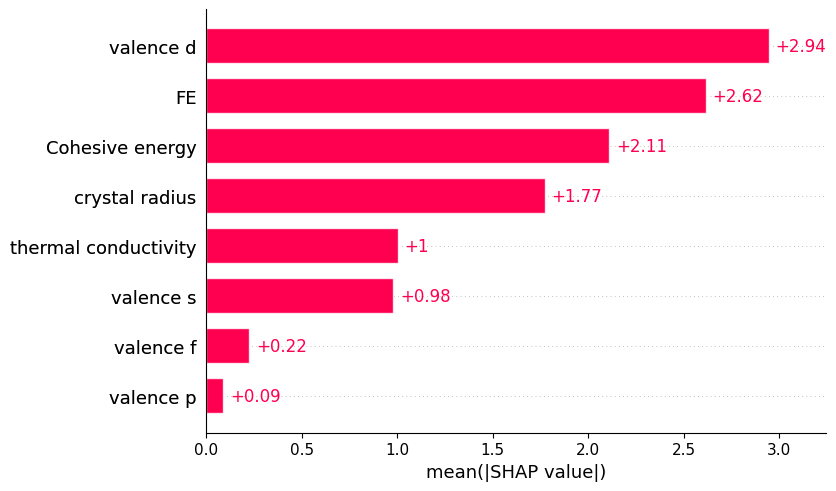

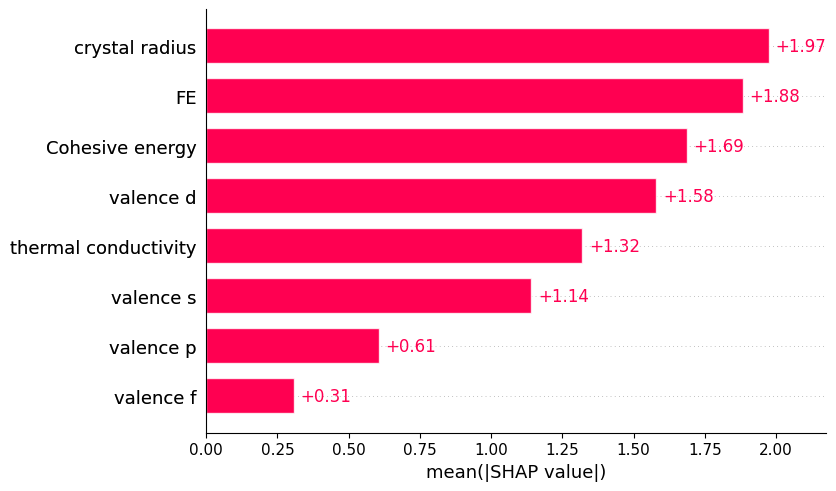

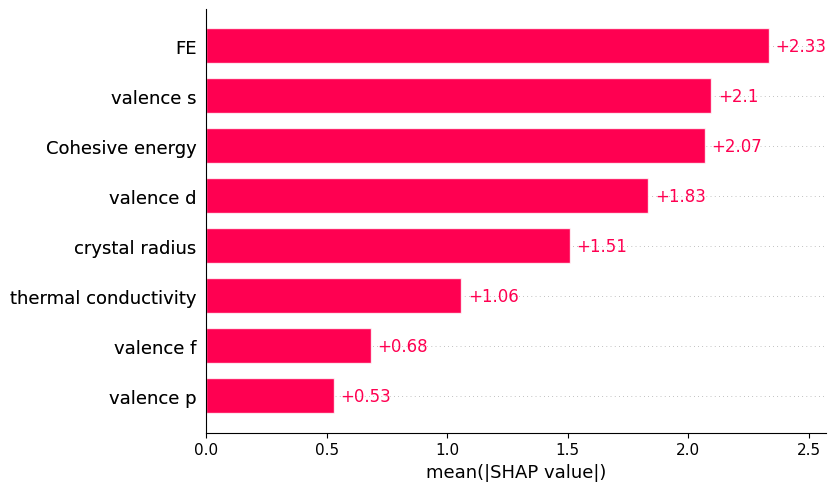

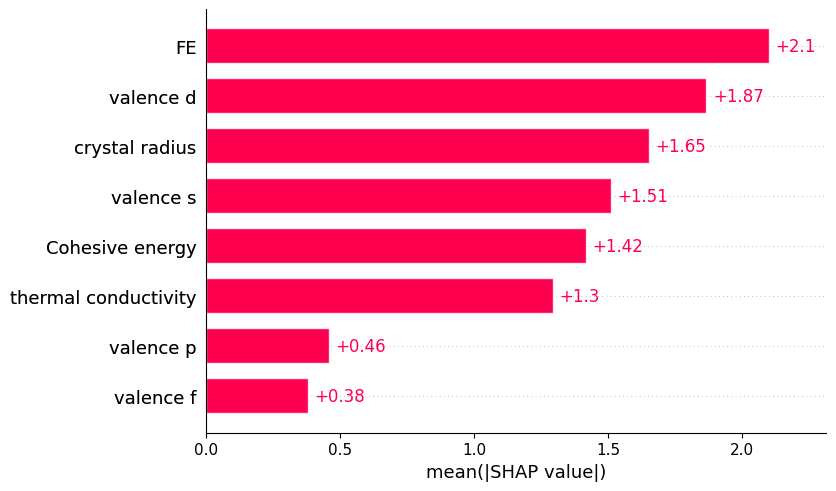

In [ ]:
model_RF.plot_SHAP('all')

### Gradient boost trees

In [ ]:
random_seeds = np.arange(0,10)
model_GB = ModelEvaluatorBayes(X_des, y_nor, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_GB.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,2.4,100.0,0.807500
0,crystal radius,3.0,100.0,0.780000
4,valence d,3.5,100.0,0.764286
6,thermal conductivity,3.8,100.0,0.756842
1,FE,4.0,100.0,0.752500
2,valence s,6.0,100.0,0.725000
3,valence p,6.5,100.0,0.720769
5,valence f,6.8,100.0,0.718529


In [ ]:
model_GB.show_shap_ranks()

{'crystal radius': [4, 1, 3, 3, 4, 1, 4, 3, 3, 4],
 'FE': [6, 3, 6, 4, 6, 2, 2, 4, 4, 3],
 'valence s': [5, 8, 7, 5, 3, 5, 8, 5, 7, 7],
 'valence p': [8, 5, 8, 8, 7, 4, 6, 7, 6, 6],
 'valence d': [2, 4, 2, 6, 1, 3, 1, 6, 8, 2],
 'valence f': [7, 7, 5, 7, 8, 8, 5, 8, 5, 8],
 'thermal conductivity': [3, 6, 4, 2, 5, 6, 3, 2, 2, 5],
 'Cohesive energy': [1, 2, 1, 1, 2, 7, 7, 1, 1, 1]}

In [ ]:
model_GB.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.727068,0.382569,7.710127,12.808036,0.642997
1,1,0.567897,0.436798,9.314337,12.562950,0.372401
2,2,0.786336,0.169830,6.708184,15.212942,0.680214
3,3,0.656700,0.661750,9.065423,7.616586,0.599507
4,4,0.662882,0.680253,8.612403,9.027313,0.493459
5,5,0.697598,0.314856,8.245082,12.578719,0.468840
6,6,0.672004,0.531966,8.798634,9.085855,0.603582
7,7,0.656776,0.519714,8.590321,11.442970,0.441429
8,8,0.639143,0.681353,8.878907,8.984980,0.525793
9,9,0.641846,0.650494,8.318819,11.304360,0.600985


In [ ]:
model_GB.show_parameters()

{0: OrderedDict([('learning_rate', 0.008578386151205711),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 200)]),
 1: OrderedDict([('learning_rate', 0.11406593422932919),
              ('max_depth', 3),
              ('min_samples_leaf', 5),
              ('min_samples_split', 10),
              ('n_estimators', 10)]),
 2: OrderedDict([('learning_rate', 0.08929292749797244),
              ('max_depth', 5),
              ('min_samples_leaf', 10),
              ('min_samples_split', 2),
              ('n_estimators', 200)]),
 3: OrderedDict([('learning_rate', 0.013499911985158288),
              ('max_depth', 9),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 146)]),
 4: OrderedDict([('learning_rate', 0.02810834512859842),
              ('max_depth', 6),
              ('min_samples_leaf', 9),
              ('min_samples_split', 4),

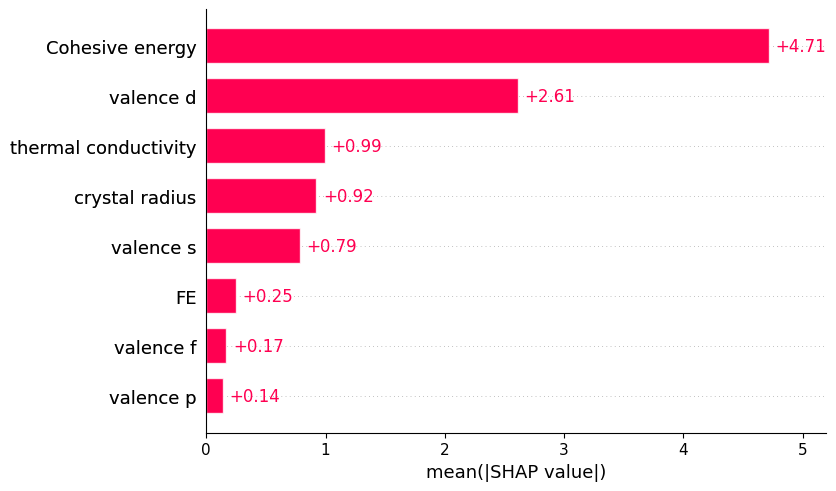

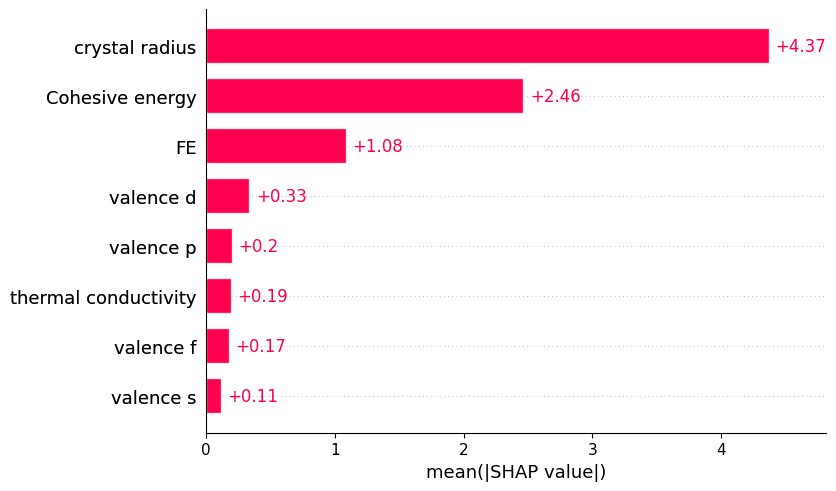

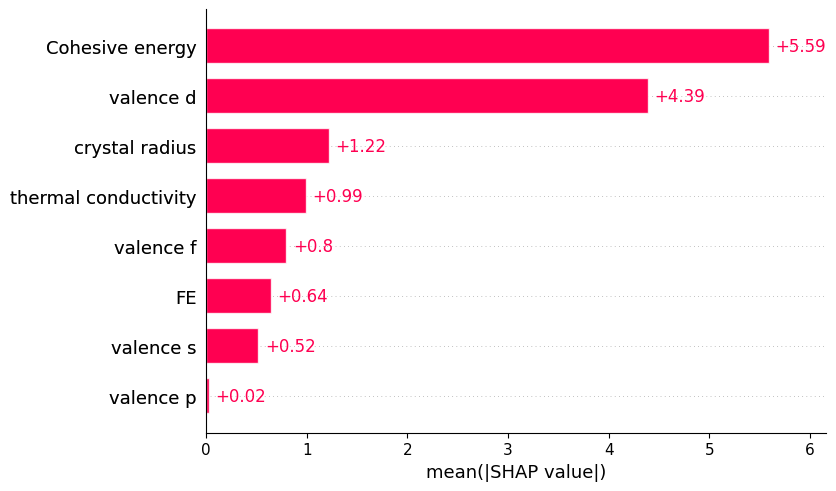

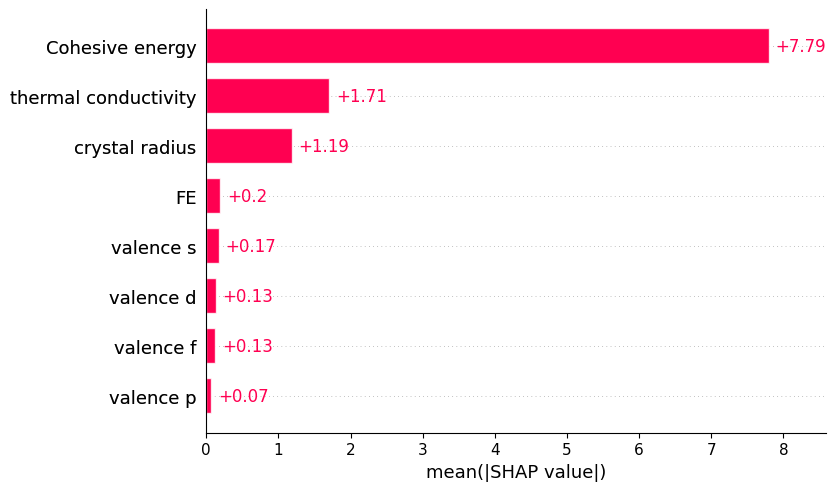

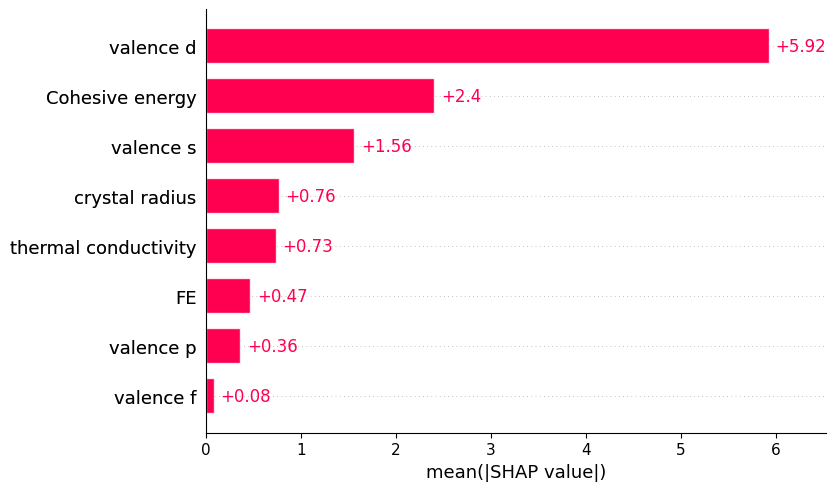

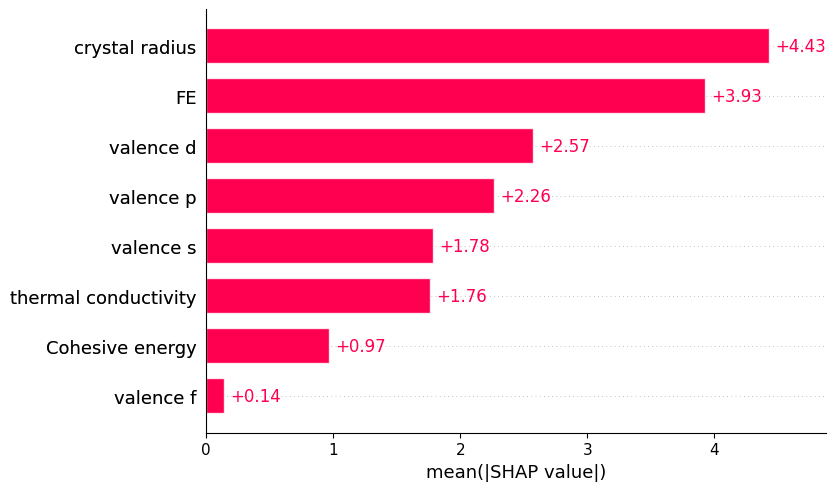

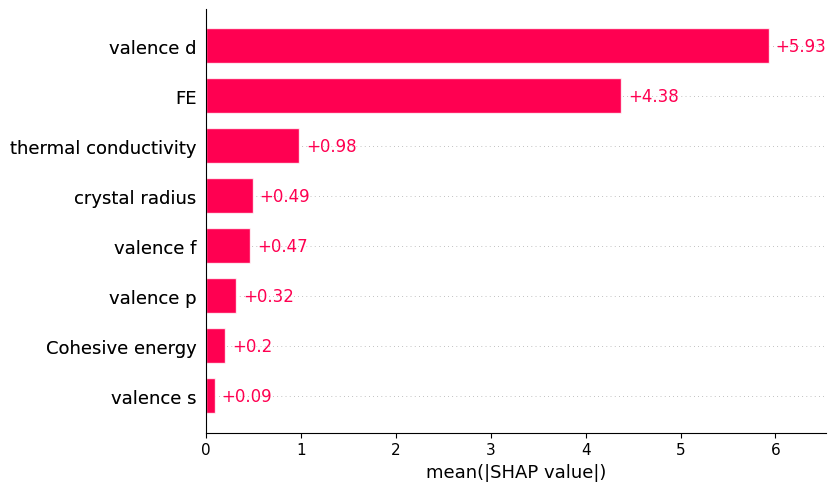

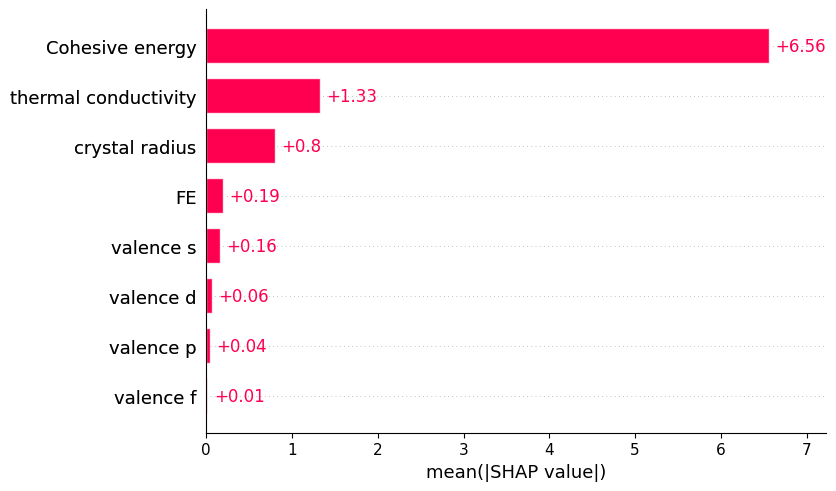

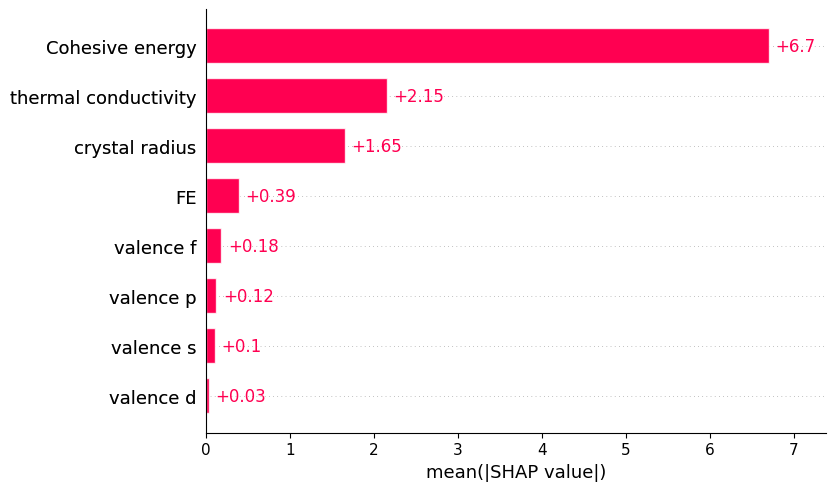

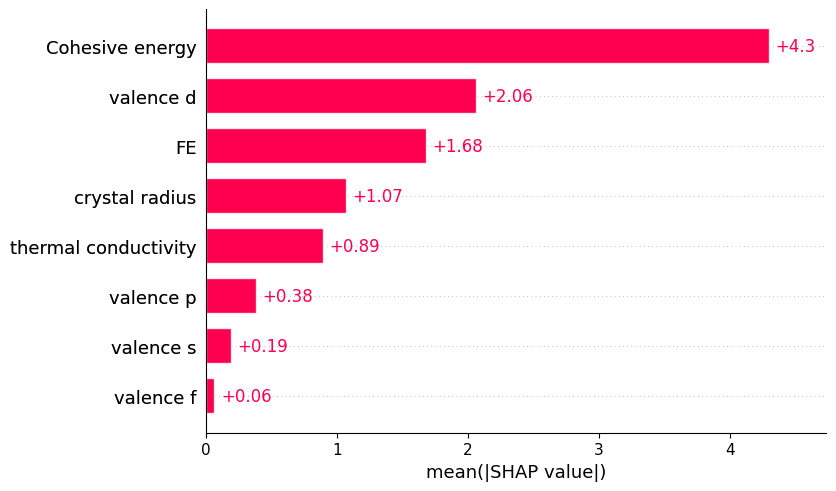

In [ ]:
model_GB.plot_SHAP('all')

### XGboost

In [ ]:
random_seeds = np.arange(0,10)

model_XGB = ModelEvaluatorBayes(X_des, y_nor, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_XGB.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,2.400000,100.0,0.807500
0,crystal radius,2.600000,100.0,0.796923
1,FE,2.700000,100.0,0.792222
4,valence d,2.750000,80.0,0.656000
6,thermal conductivity,4.428571,70.0,0.543516
2,valence s,5.200000,50.0,0.398462
5,valence f,7.000000,20.0,0.181143
3,valence p,7.000000,10.0,0.114143


In [ ]:
model_XGB.show_shap_ranks()

{'crystal radius': [3, 1, 2, 3, 5, 1, 3, 3, 2, 3],
 'FE': [2, 2, 1, 4, 2, 3, 1, 5, 3, 4],
 'valence s': [6, 4, 6, 4, 6],
 'valence p': [7],
 'valence d': [1, 4, 4, 1, 4, 2, 1, 5],
 'valence f': [6, 8],
 'thermal conductivity': [5, 2, 7, 5, 6, 4, 2],
 'Cohesive energy': [4, 3, 3, 1, 3, 2, 4, 2, 1, 1]}

In [ ]:
model_XGB.show_parameters()

{0: OrderedDict([('learning_rate', 0.049388161340855025),
              ('max_depth', 6),
              ('n_estimators', 84),
              ('reg_alpha', 0.07732789743320585),
              ('reg_lambda', 10.81481008142629)]),
 1: OrderedDict([('learning_rate', 0.009898127964280395),
              ('max_depth', 10),
              ('n_estimators', 162),
              ('reg_alpha', 1.67594227387246),
              ('reg_lambda', 2.420905025479304)]),
 2: OrderedDict([('learning_rate', 0.15645480396011927),
              ('max_depth', 10),
              ('n_estimators', 145),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 100.0)]),
 3: OrderedDict([('learning_rate', 0.0289905956442024),
              ('max_depth', 10),
              ('n_estimators', 79),
              ('reg_alpha', 5.019612265223586e-06),
              ('reg_lambda', 0.32685426963491054)]),
 4: OrderedDict([('learning_rate', 0.19143584971976277),
              ('max_depth', 3),
              ('n_estimato

In [ ]:
model_XGB.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.742534,0.396116,7.488489,12.666751,0.656889
1,1,0.605418,0.524260,8.900754,11.546341,0.393297
2,2,0.772930,0.228311,6.915431,14.667323,0.686176
3,3,0.661540,0.663009,9.001290,7.602392,0.601171
4,4,0.664294,0.685391,8.594351,8.954497,0.490652
5,5,0.650288,0.343890,8.866621,12.309315,0.434133
6,6,0.676659,0.469515,8.735966,9.673060,0.600615
7,7,0.658856,0.531573,8.564242,11.300816,0.465515
8,8,0.653503,0.717195,8.700450,8.464593,0.526407
9,9,0.641736,0.650243,8.320106,11.308420,0.585364


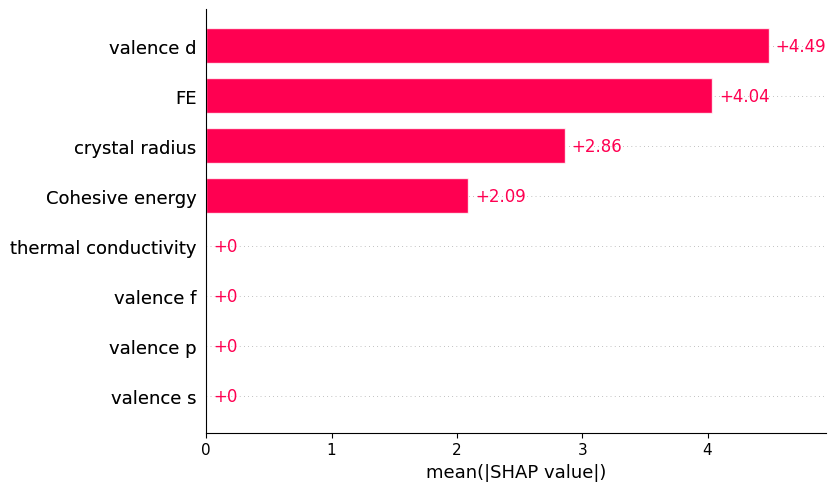

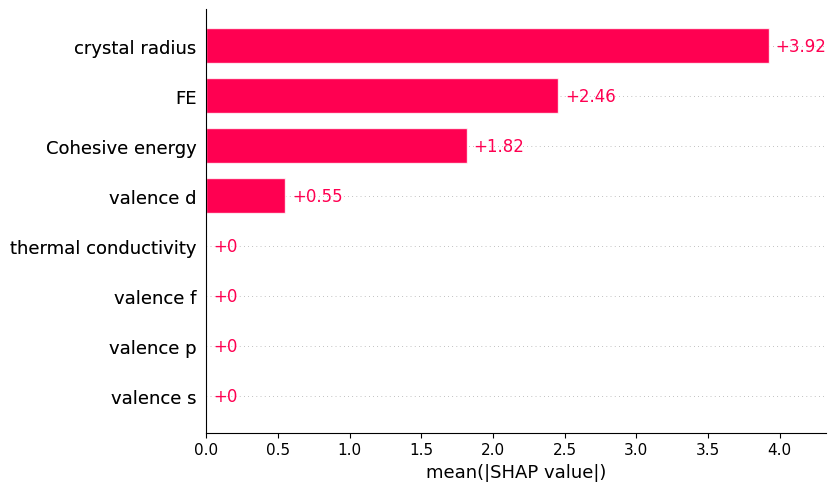

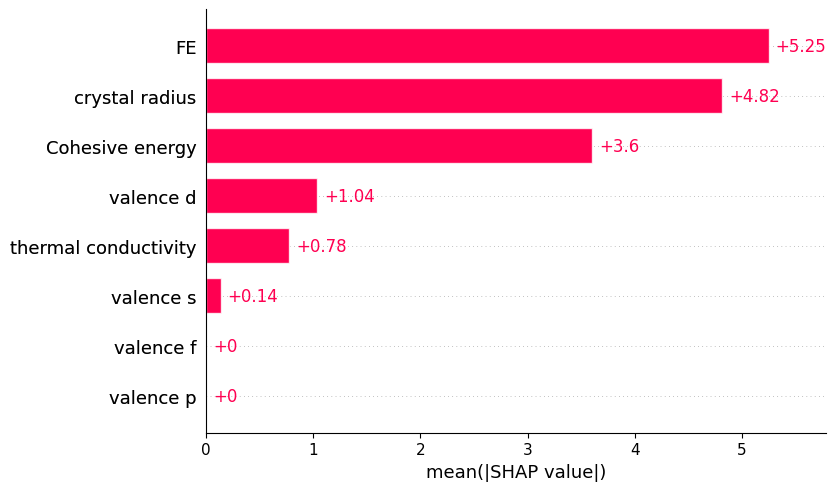

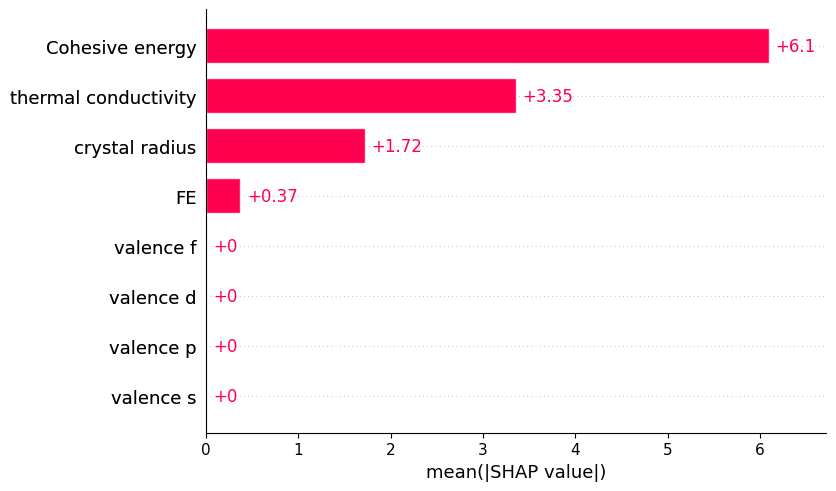

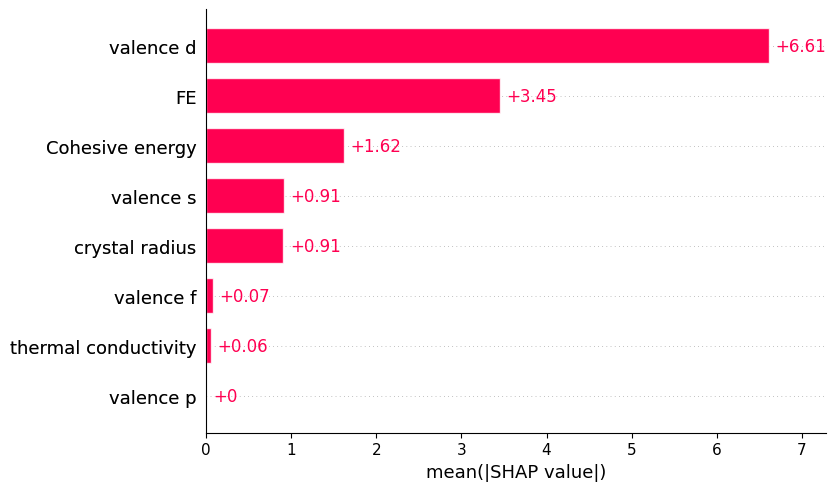

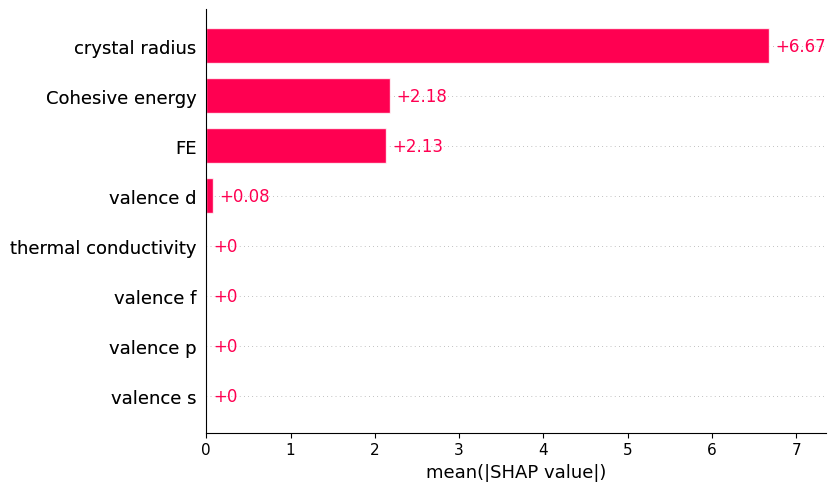

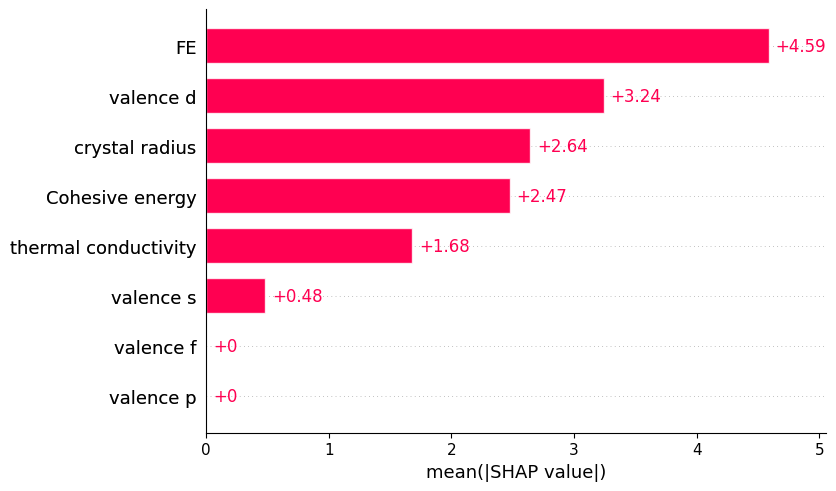

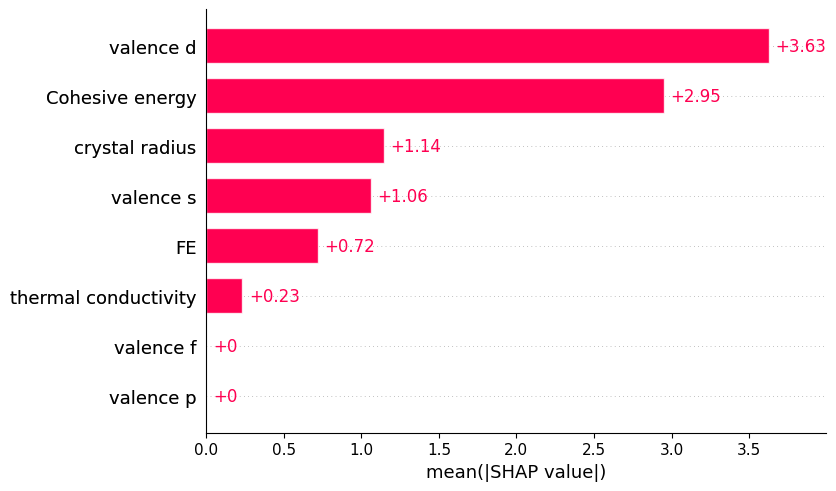

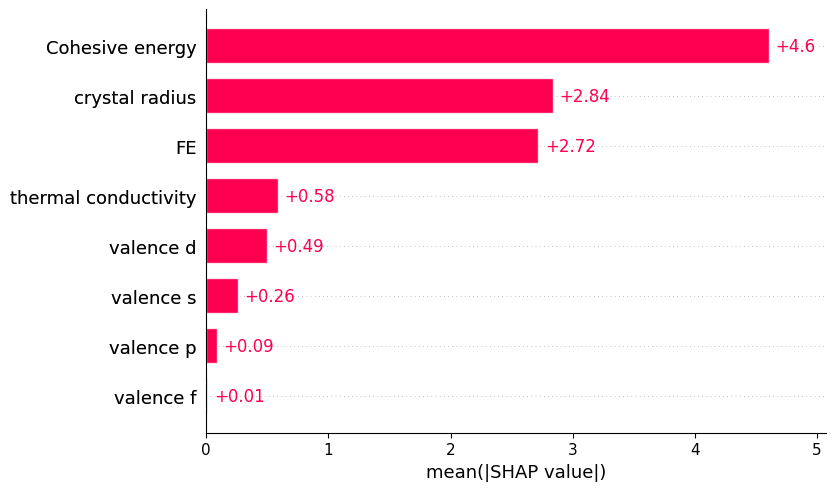

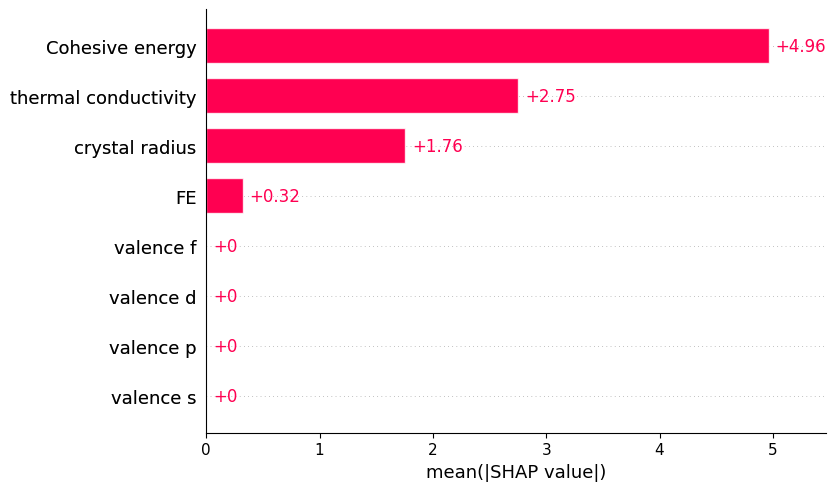

In [ ]:
model_XGB.plot_SHAP('all')

### Supprt Vector Regression

In [ ]:
random_seeds = np.arange(0,10)

model_SVR = ModelEvaluatorBayes(X_des, y_nor, random_seeds, SVR, param_space_SVR, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_SVR.evaluate_model()

Exact explainer: 113it [00:24,  3.28it/s]


Random seed 0 finished



Exact explainer: 113it [00:20,  2.75it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 113it [00:19,  2.95it/s]


Random seed 2 finished



Exact explainer: 113it [00:20,  2.74it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 113it [00:19,  2.49it/s]


Random seed 5 finished



Exact explainer: 113it [00:18,  2.90it/s]


Random seed 6 finished



Exact explainer: 113it [00:19,  2.72it/s]


Random seed 7 finished



Exact explainer: 113it [00:20,  2.76it/s]


Random seed 8 finished



Exact explainer: 113it [00:22,  2.64it/s]

Random seed 9 finished



In [ ]:
model_SVR.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
7,Cohesive energy,3.0,100.0,0.780000
5,valence f,4.0,100.0,0.752500
2,valence s,5.3,100.0,0.732264
3,valence p,5.7,100.0,0.727895
1,FE,7.0,100.0,0.717143
0,crystal radius,8.0,100.0,0.711250


In [ ]:
model_SVR.show_shap_ranks()

{'crystal radius': [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
 'FE': [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 'valence s': [5, 5, 5, 6, 6, 5, 5, 6, 5, 5],
 'valence p': [6, 6, 6, 5, 5, 6, 6, 5, 6, 6],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 3, 3, 3, 3, 3, 3, 3]}

In [ ]:
model_SVR.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.727882,0.351105,7.698629,13.130333,0.650352
1,1,0.612379,0.521851,8.821889,11.575540,0.425257
2,2,0.739366,0.240571,7.408911,14.550341,0.658067
3,3,0.631647,0.598270,9.390383,8.300576,0.569894
4,4,0.627693,0.621958,9.050749,9.815797,0.457382
5,5,0.627830,0.443284,9.146887,11.338674,0.470060
6,6,0.648839,0.524444,9.104039,9.158575,0.615798
7,7,0.652721,0.578485,8.640908,10.720010,0.433094
8,8,0.613379,0.695407,9.190400,8.784608,0.519551
9,9,0.614595,0.645149,8.629495,11.390473,0.585767


In [ ]:
model_SVR.show_parameters()

{0: OrderedDict([('C', 13.89951912558818),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 5.104821880933051),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 15.16555133685208),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 751.9214481430998),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 620.4844034176216),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 5.324130559140719),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 1000.0),
              ('epsilon', 0.3496897723490817),
              ('gamma', 'auto'),
              ('kernel', 'rbf'

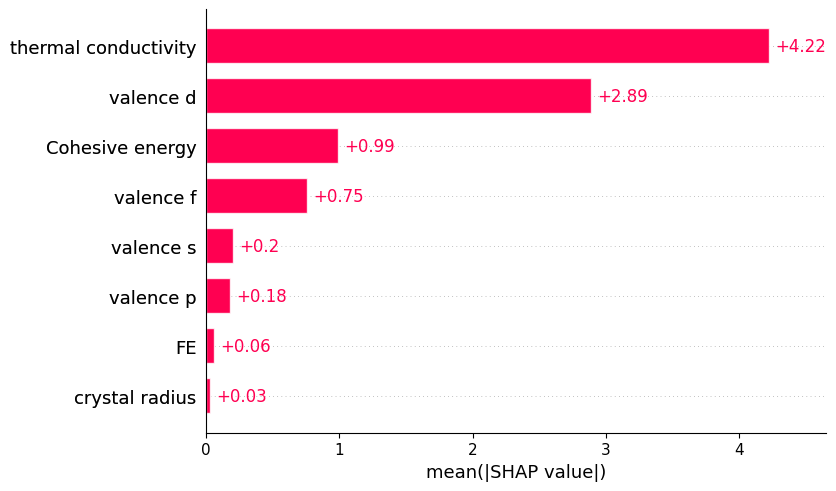

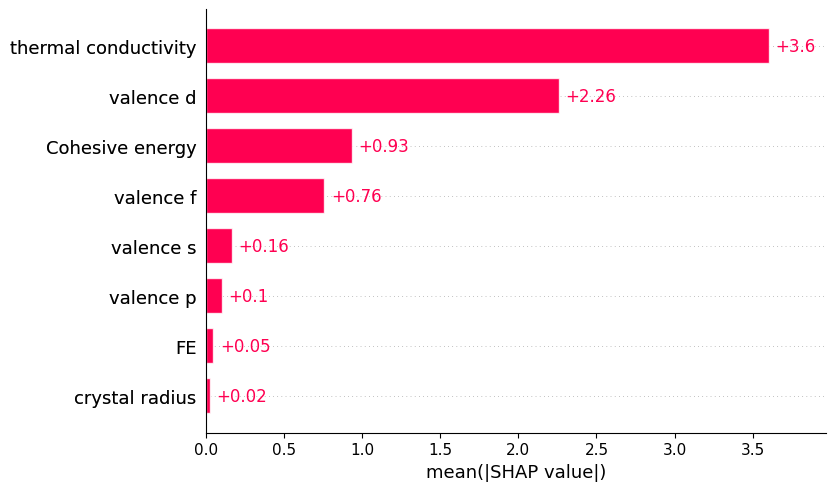

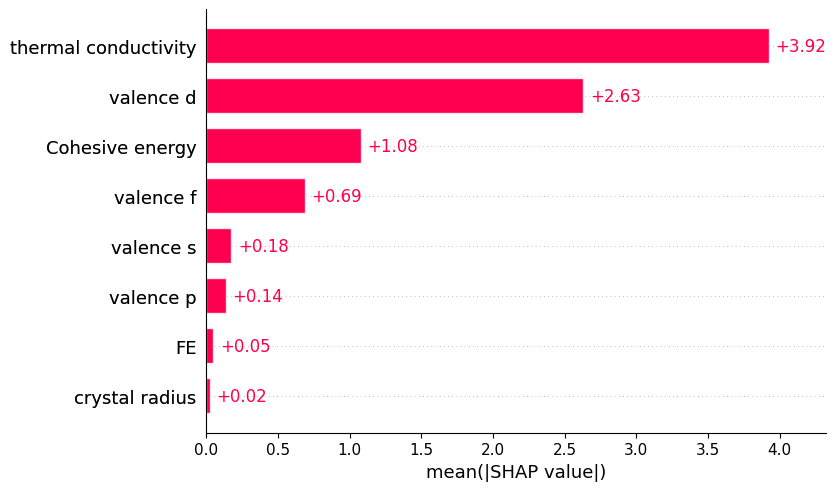

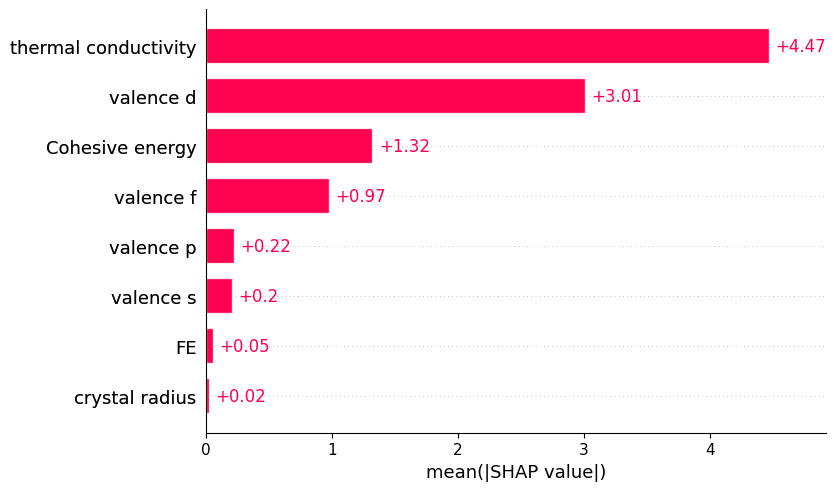

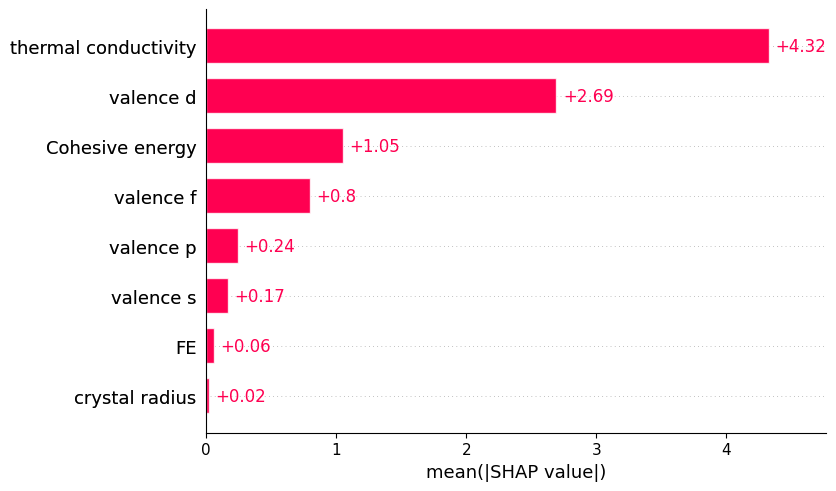

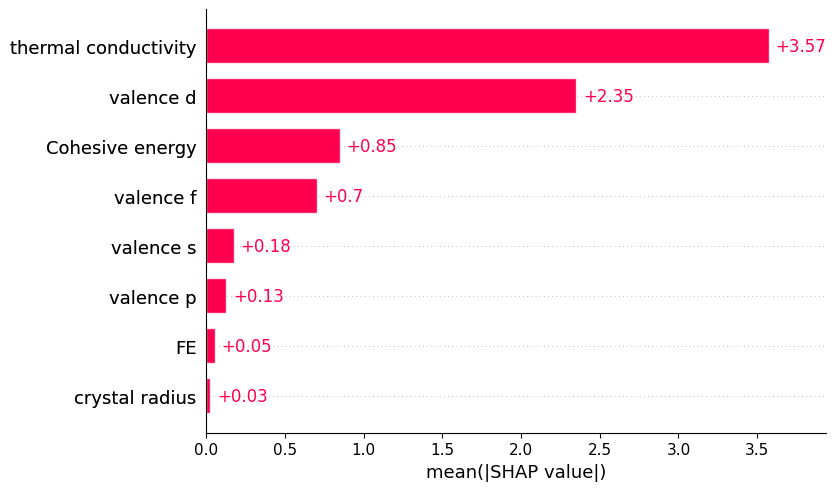

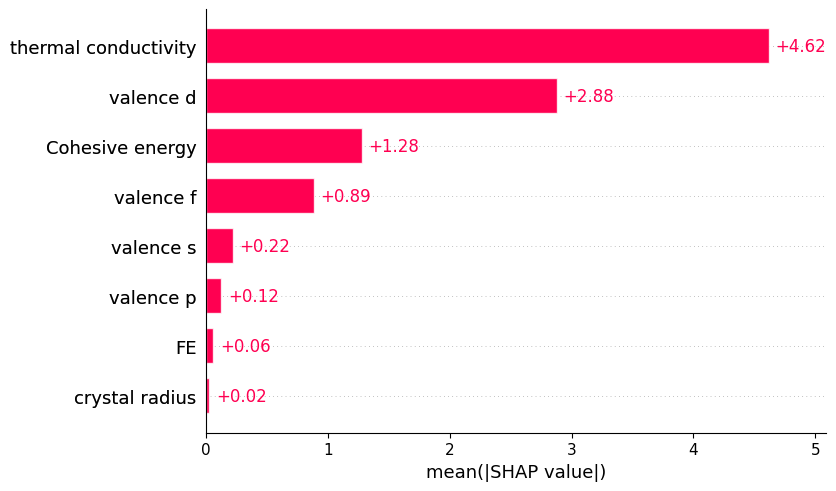

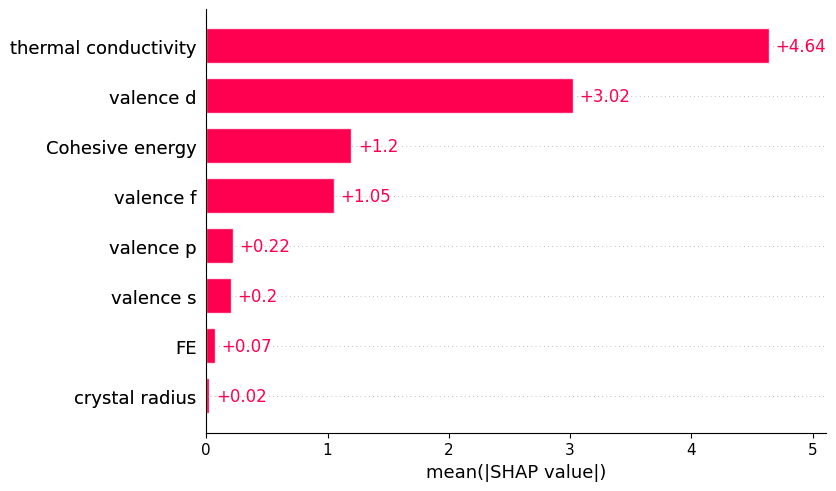

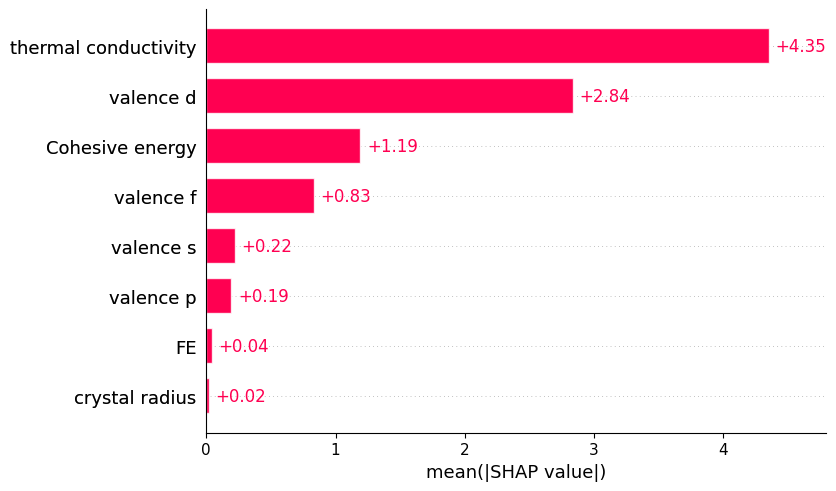

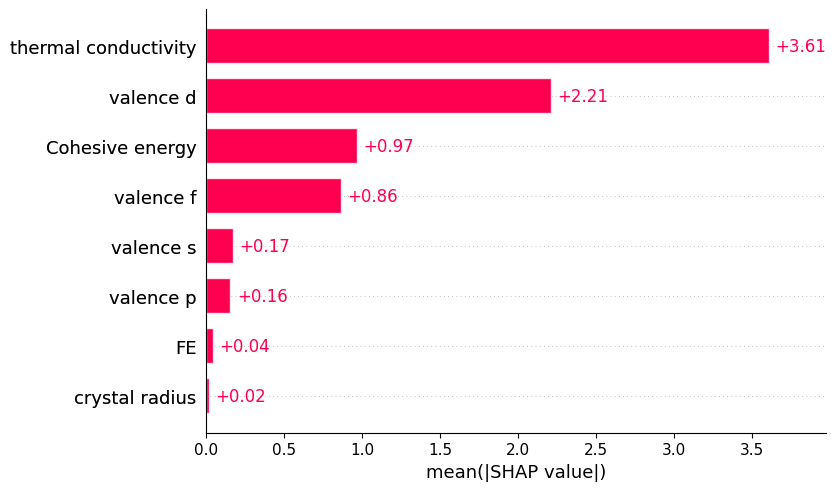

In [ ]:
model_SVR.plot_SHAP('all') # plot the shap values of the model with last seed by default

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN = ModelEvaluatorBayes(X_des, y_nor, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_KNN.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 9 finished



In [ ]:
model_KNN.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.2,100.0,0.820000
5,valence f,2.8,100.0,0.787857
7,Cohesive energy,4.1,100.0,0.750488
1,FE,5.8,100.0,0.726897
3,valence p,6.2,100.0,0.723226
2,valence s,6.6,100.0,0.720000
0,crystal radius,7.3,100.0,0.715205


In [ ]:
model_KNN.show_shap_ranks()

{'crystal radius': [8, 6, 8, 8, 8, 6, 8, 6, 7, 8],
 'FE': [6, 4, 7, 7, 7, 5, 5, 5, 5, 7],
 'valence s': [7, 7, 6, 6, 6, 8, 7, 7, 6, 6],
 'valence p': [5, 8, 5, 5, 5, 7, 6, 8, 8, 5],
 'valence d': [3, 2, 2, 2, 2, 2, 2, 2, 3, 2],
 'valence f': [2, 3, 3, 3, 3, 3, 3, 3, 2, 3],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [4, 5, 4, 4, 4, 4, 4, 4, 4, 4]}

In [ ]:
model_KNN.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.749873,0.362287,7.380997,13.016704,0.636298
1,1,0.614147,0.538840,8.801747,11.368037,0.370866
2,2,0.786748,0.160474,6.701711,15.298422,0.674776
3,3,0.666371,0.648813,8.936824,7.760874,0.582243
4,4,0.665367,0.689761,8.580606,8.892087,0.449286
5,5,0.605797,0.578966,9.413755,9.860620,0.502916
6,6,0.676263,0.477195,8.741316,9.602785,0.599052
7,7,0.629014,0.513173,8.930979,11.520618,0.417831
8,8,0.631024,0.653168,8.978230,9.373937,0.472544
9,9,0.649715,0.686203,8.226935,10.711324,0.577558


In [ ]:
model_KNN.show_parameters()

{0: OrderedDict([('n_neighbors', 12), ('p', 2), ('weights', 'distance')]),
 1: OrderedDict([('n_neighbors', 6), ('p', 2), ('weights', 'uniform')]),
 2: OrderedDict([('n_neighbors', 18), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 13), ('p', 1), ('weights', 'distance')]),
 4: OrderedDict([('n_neighbors', 18), ('p', 2), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'uniform')]),
 6: OrderedDict([('n_neighbors', 6), ('p', 2), ('weights', 'distance')]),
 7: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'uniform')]),
 8: OrderedDict([('n_neighbors', 5), ('p', 1), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 19), ('p', 2), ('weights', 'distance')])}

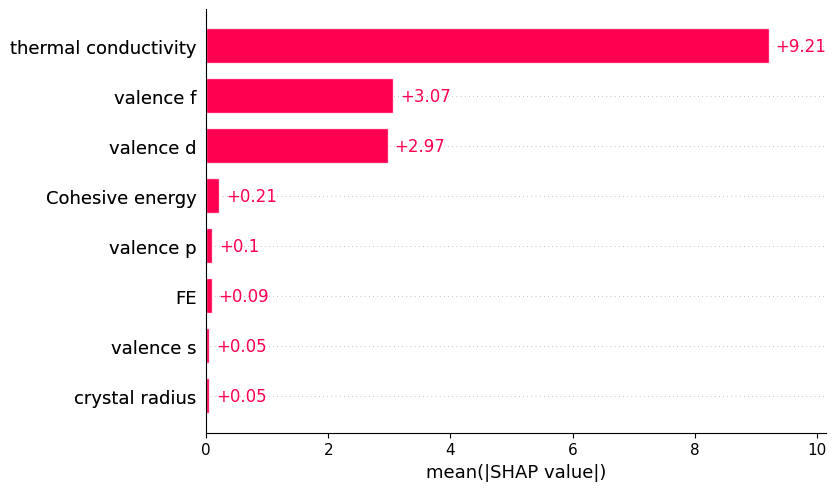

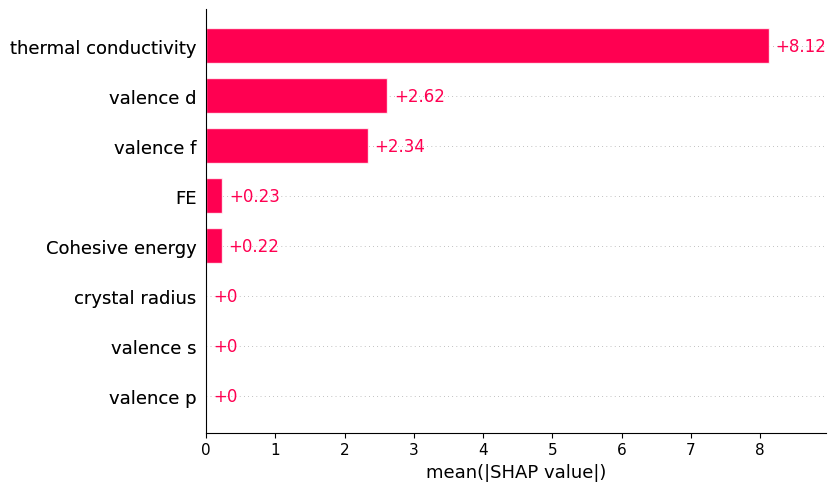

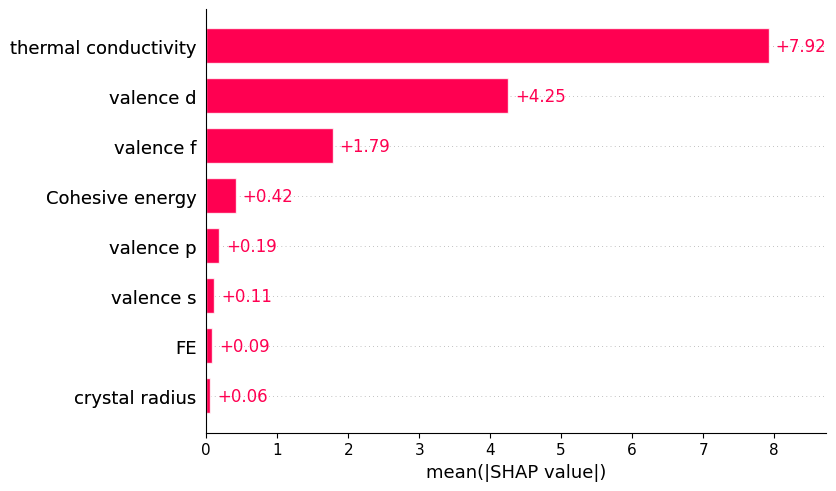

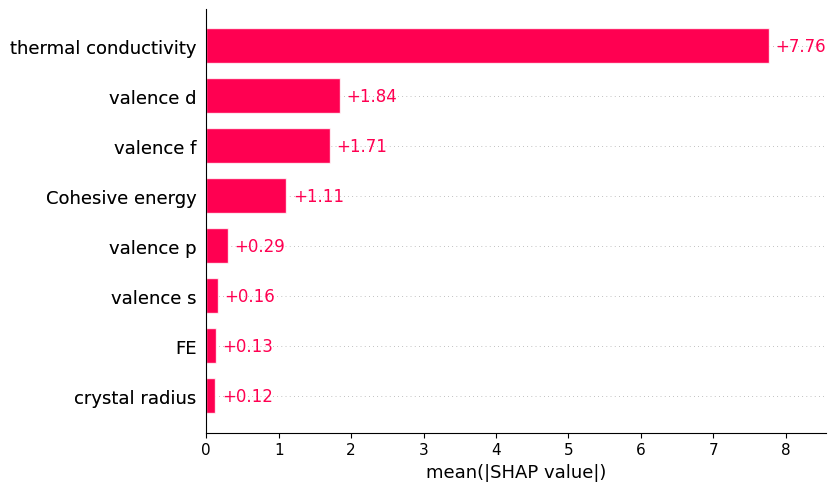

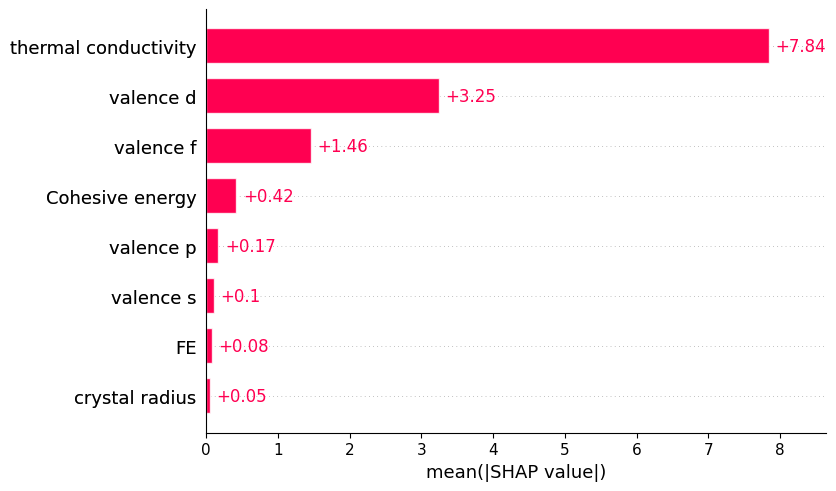

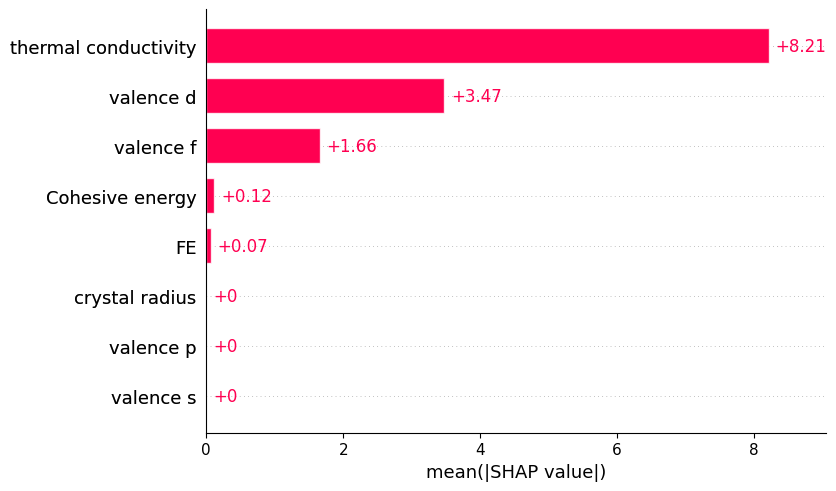

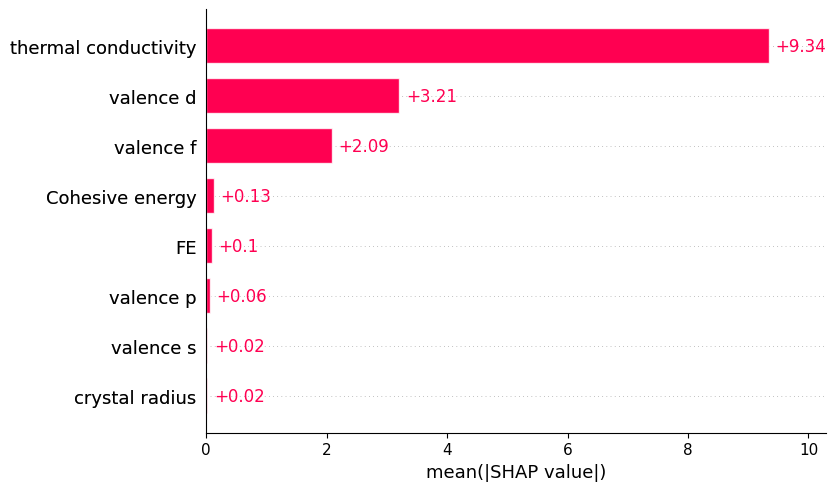

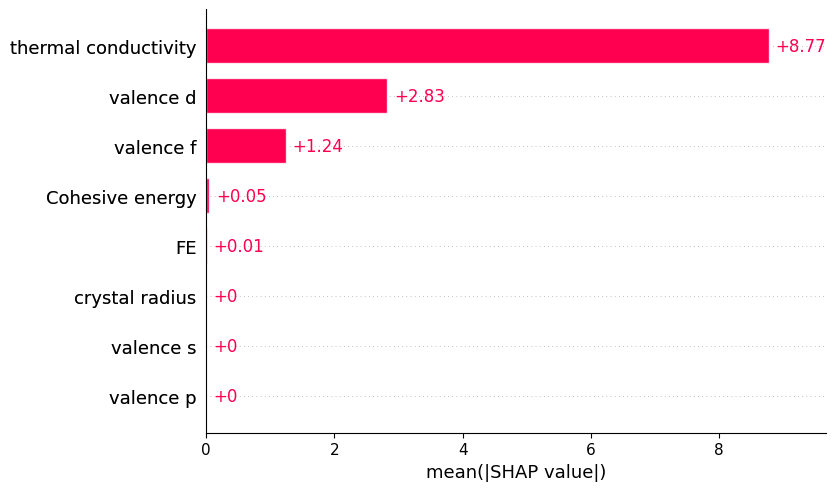

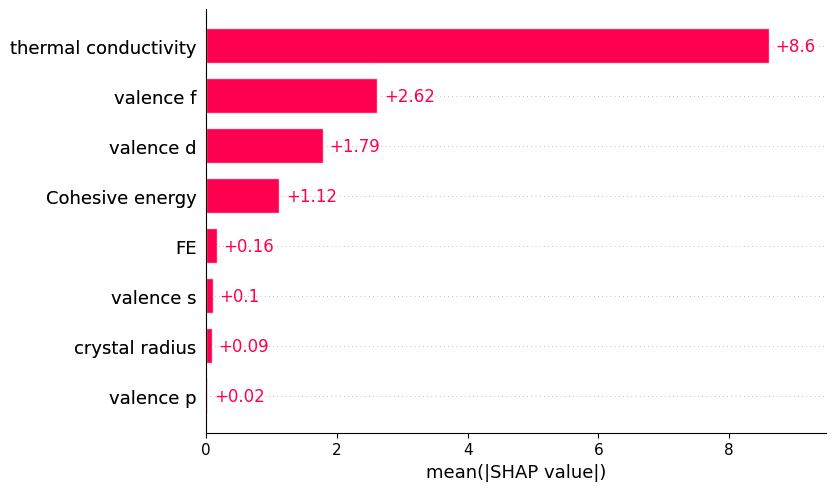

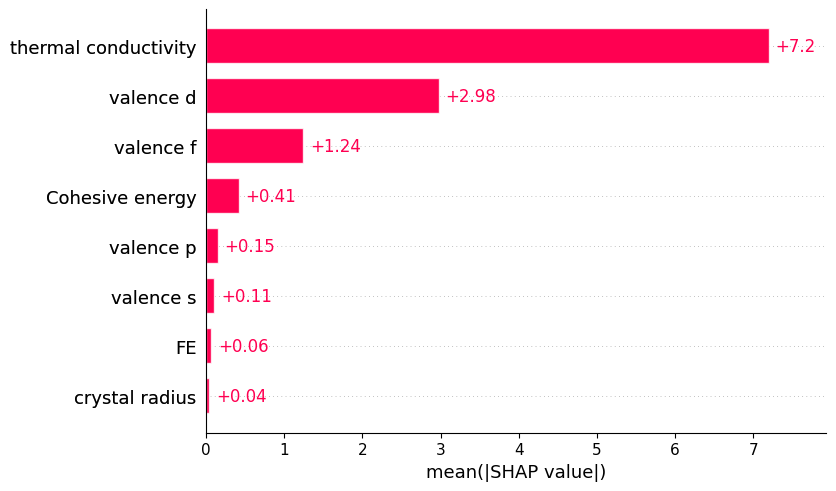

In [ ]:
model_KNN.plot_SHAP('all')

### Gaussian Process

In [ ]:
random_seeds = np.arange(0,10)

kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP = ModelEvaluatorBayes(X_des, y_nor, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_GP.evaluate_model()

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:33,  2.38it/s]


Random seed 0 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:32,  2.36it/s]


Random seed 1 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:31,  2.44it/s]


Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:34,  2.30it/s]


Random seed 4 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:32,  2.34it/s]


Random seed 5 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 113it [00:33,  2.37it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the sp

Random seed 9 finished



In [ ]:
model_GP.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
5,valence f,3.5,100.0,0.764286
7,Cohesive energy,3.5,100.0,0.764286
2,valence s,5.2,100.0,0.733462
3,valence p,5.8,100.0,0.726897
1,FE,7.0,100.0,0.717143
0,crystal radius,8.0,100.0,0.711250


In [ ]:
model_GP.show_shap_ranks()

{'crystal radius': [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
 'FE': [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 'valence s': [6, 5, 5, 5, 6, 5, 5, 5, 5, 5],
 'valence p': [5, 6, 6, 6, 5, 6, 6, 6, 6, 6],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 3, 3, 4, 3, 4, 4, 3, 4, 3],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 4, 4, 3, 4, 3, 3, 4, 3, 4]}

In [ ]:
model_GP.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.747795,0.390450,7.411588,12.726033,0.650260
1,1,0.594634,0.477402,9.021557,12.101613,0.408649
2,2,0.779047,0.238424,6.821636,14.570893,0.675351
3,3,0.663707,0.681087,8.972426,7.395661,0.598355
4,4,0.658993,0.660468,8.661941,9.302411,0.470857
5,5,0.662180,0.406224,8.714564,11.710004,0.489150
6,6,0.680226,0.539356,8.687643,9.013842,0.584367
7,7,0.654036,0.517174,8.624532,11.473190,0.463138
8,8,0.651018,0.705165,8.731594,8.642751,0.522241
9,9,0.643682,0.645820,8.297471,11.379696,0.592597


In [ ]:
model_GP.show_parameters()

{0: OrderedDict([('alpha', 72.63420318457045),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 1000.0)]),
 1: OrderedDict([('alpha', 319.90730486323554),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 0.1)]),
 2: OrderedDict([('alpha', 99.51650662731484),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 3: OrderedDict([('alpha', 93.69709080993862),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2

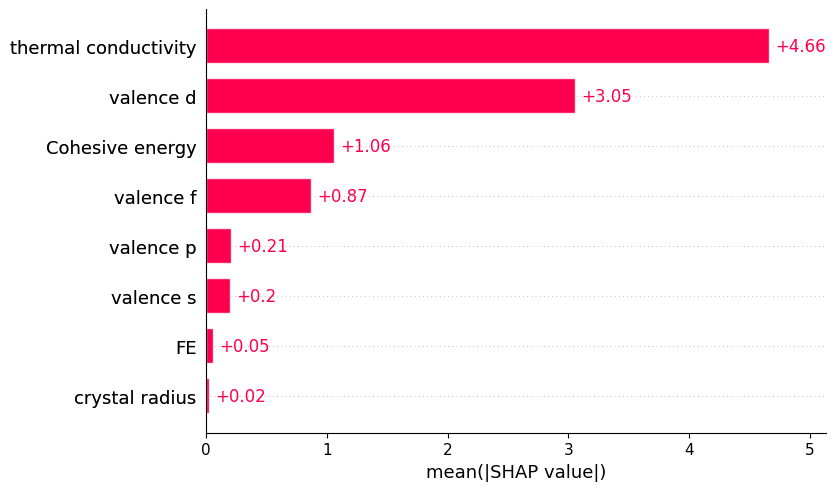

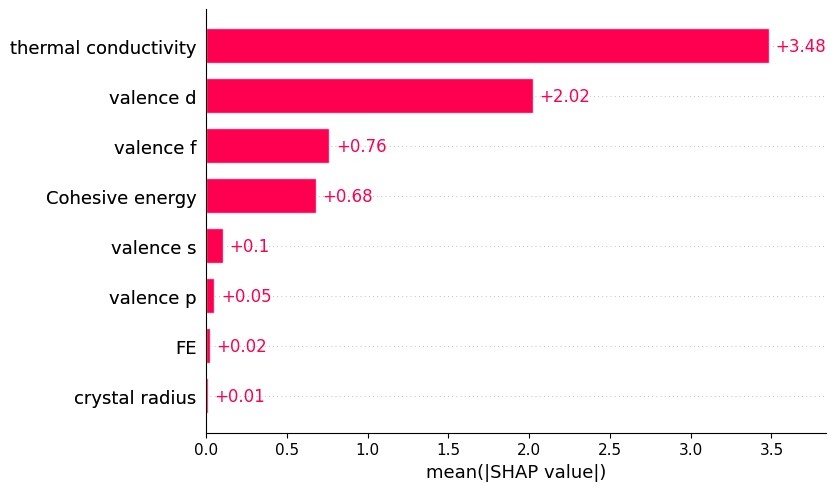

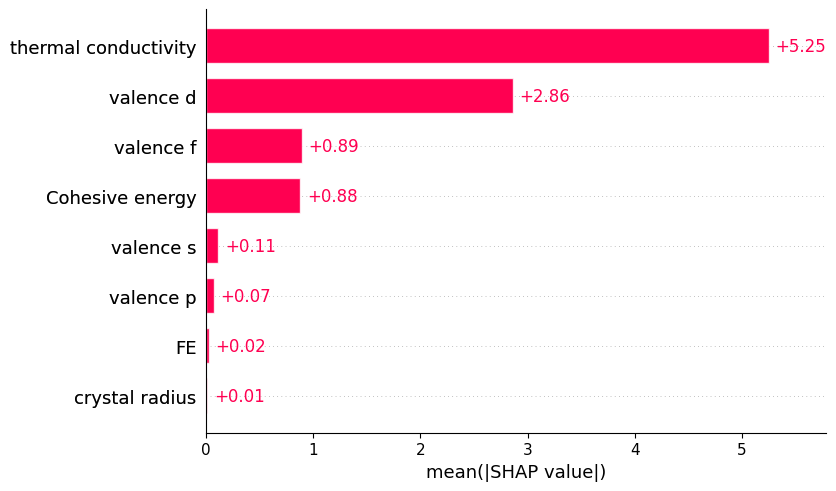

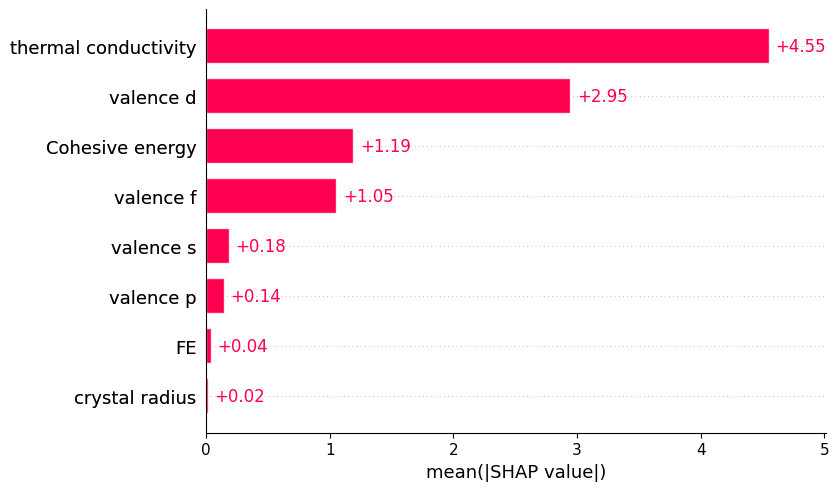

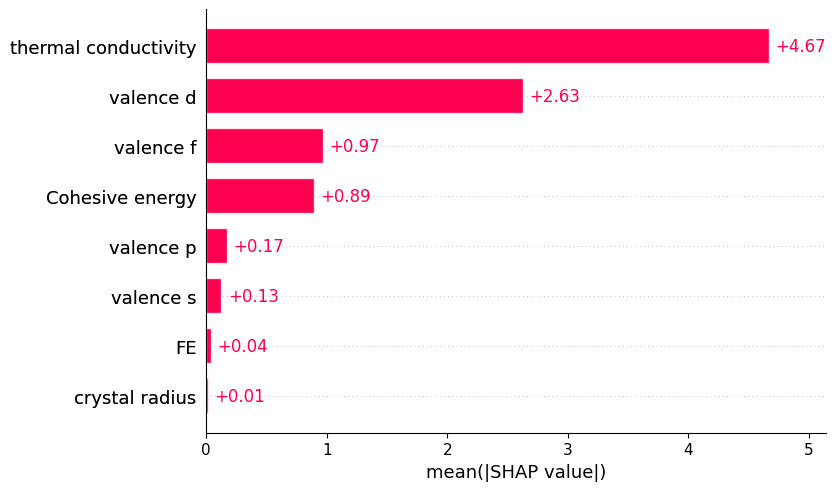

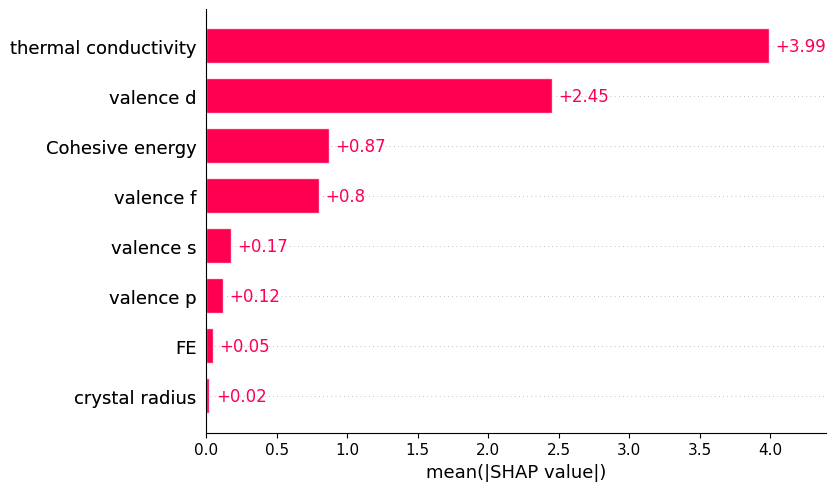

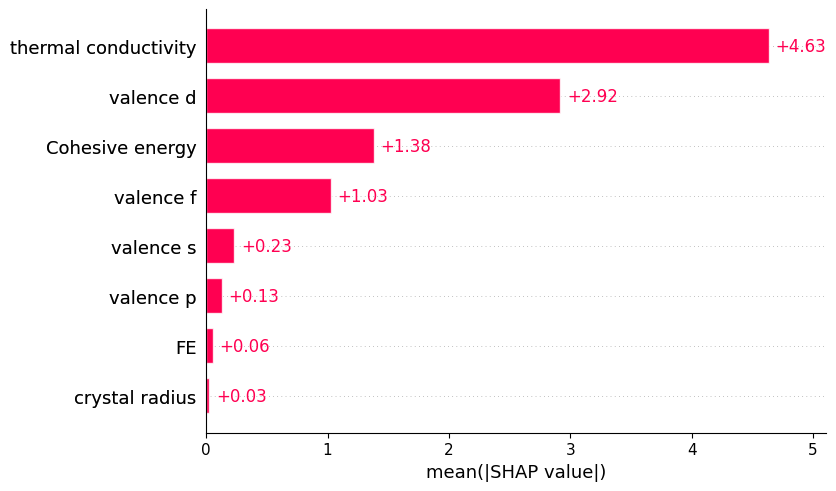

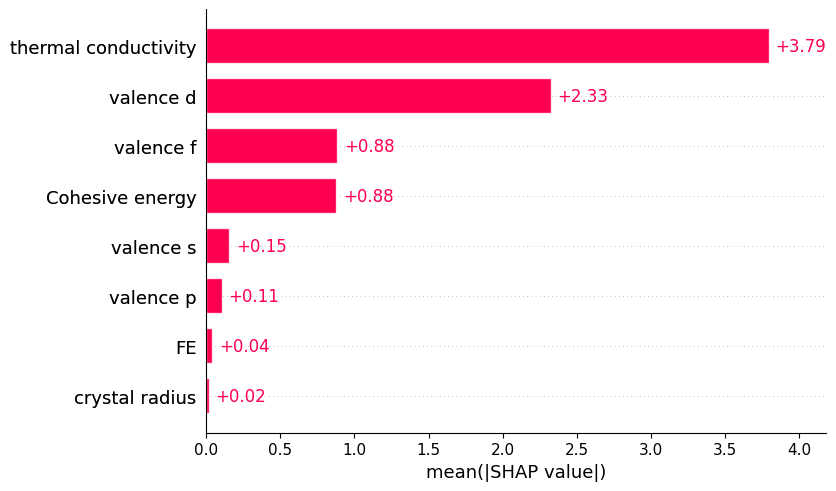

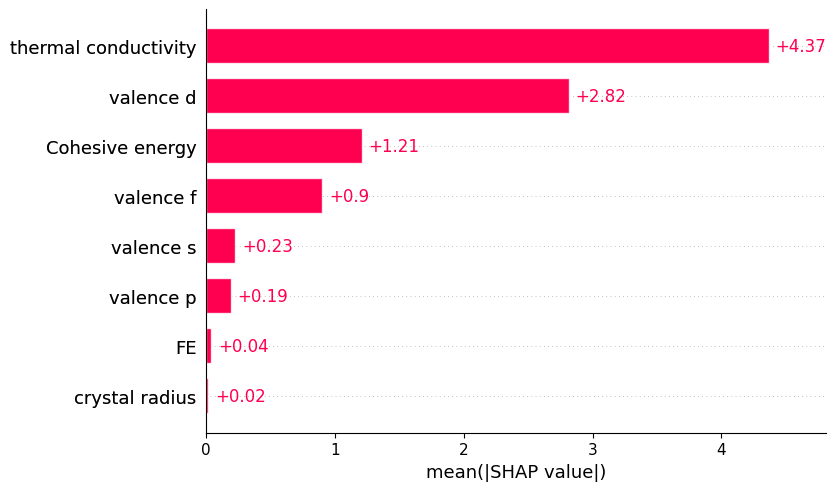

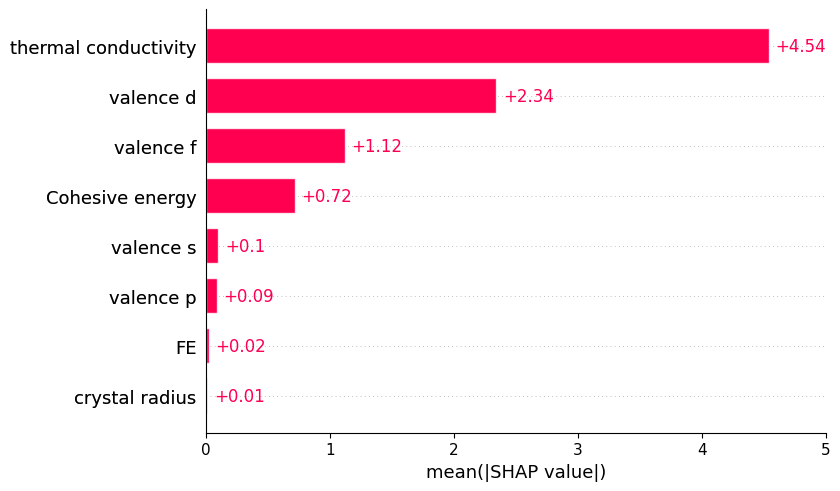

In [ ]:
model_GP.plot_SHAP('all')

In [ ]:
IIS_sub

{'DecisionTreeRegressor': {'crystal radius': [2.6666666666666665,
   90.0,
   0.7267500000000001],
  'FE': [3.8333333333333335, 60.0, 0.48808695652173917],
  'valence s': [5.0, 20.0, 0.2],
  'valence p': [5.0, 30.0, 0.267],
  'valence d': [1.5, 40.0, 0.488],
  'valence f': [4.0, 20.0, 0.21650000000000003],
  'thermal conductivity': [3.888888888888889, 90.0, 0.687857142857143],
  'Cohesive energy': [1.2222222222222223, 90.0, 0.8730000000000001]},
 'RandomForestRegressor': {'crystal radius': [3.4, 100.0, 0.7670588235294118],
  'FE': [2.7, 100.0, 0.7922222222222223],
  'valence s': [3.7, 100.0, 0.7591891891891892],
  'valence p': [7.3, 100.0, 0.7152054794520548],
  'valence d': [2.5, 100.0, 0.802],
  'valence f': [7.7, 100.0, 0.7128571428571429],
  'thermal conductivity': [5.5, 100.0, 0.7300000000000001],
  'Cohesive energy': [3.2, 100.0, 0.7731250000000001]},
 'GradientBoostingRegressor': {'crystal radius': [3.0, 100.0, 0.78],
  'FE': [4.0, 100.0, 0.7525000000000001],
  'valence s': [6.0

## IIS ranking

In [ ]:
IIS_data_sub = IISDataAnalysis(results=results_sub,
                           IIS=IIS_sub,
                           models=models_sub,
                           results_csv_name='df_results_sub_set1.csv',
                           models_joblib_name='models_sub_set1.joblib',
                           iis_full_csv_name='df_IIS_full_sub_set1.csv',
                           iis_csv_name='df_IIS_sub_set1.csv')

In [ ]:
IIS_data_sub.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.667966,0.527299,8.457580,10.774181,0.521800
RandomForestRegressor,0.675665,0.520659,8.368558,10.837533,0.544495
GradientBoostingRegressor,0.670825,0.502958,8.424224,11.062471,0.542921
XGBRegressor,0.672776,0.520950,8.408770,10.849351,0.544022
SVR,0.649633,0.522052,8.708229,10.876493,0.538522
KNeighborsRegressor,0.667432,0.530888,8.469310,10.740541,0.528337
GaussianProcessRegressor,0.673532,0.526157,8.394495,10.831609,0.545497


In [ ]:
IIS_data_sub.show_IIS_values()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.726750,0.488087,0.200000,0.267000,0.488000,0.216500,0.687857,0.873000
RandomForestRegressor,0.767059,0.792222,0.759189,0.715205,0.802000,0.712857,0.730000,0.773125
GradientBoostingRegressor,0.780000,0.752500,0.725000,0.720769,0.764286,0.718529,0.756842,0.807500
XGBRegressor,0.796923,0.792222,0.398462,0.114143,0.656000,0.181143,0.543516,0.807500
SVR,0.711250,0.717143,0.732264,0.727895,0.835000,0.752500,1.000000,0.780000
KNeighborsRegressor,0.715205,0.726897,0.720000,0.723226,0.820000,0.787857,1.000000,0.750488
GaussianProcessRegressor,0.711250,0.717143,0.733462,0.726897,0.835000,0.764286,1.000000,0.764286


In [ ]:
IIS_data_sub.show_IIS_details()

crystal radius          FE  \
DecisionTreeRegressor     Mean Rank                    2.666667    3.833333   
                          Non-Zero Frequency(%)       90.000000   60.000000   
                          IIS                          0.726750    0.488087   
RandomForestRegressor     Mean Rank                    3.400000    2.700000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.767059    0.792222   
GradientBoostingRegressor Mean Rank                    3.000000    4.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.780000    0.752500   
XGBRegressor              Mean Rank                    2.600000    2.700000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.796923    0.792222   
SVR                       Mean Rank                    8.000000    7.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.711250    0.717143   
KNeighborsRegressor       Mean Rank                    7.300000    5.800000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.715205    0.726897   
GaussianProcessRegressor  Mean Rank                    8.000000    7.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.711250    0.717143   

                                                  valence s   valence p  \
DecisionTreeRegressor     Mean Rank                5.000000    5.000000   
                          Non-Zero Frequency(%)   20.000000   30.000000   
                          IIS                      0.200000    0.267000   
RandomForestRegressor     Mean Rank                3.700000    7.300000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.759189    0.715205   
GradientBoostingRegressor Mean Rank                6.000000    6.500000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.725000    0.720769   
XGBRegressor              Mean Rank                5.200000    7.000000   
                          Non-Zero Frequency(%)   50.000000   10.000000   
                          IIS                      0.398462    0.114143   
SVR                       Mean Rank                5.300000    5.700000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.732264    0.727895   
KNeighborsRegressor       Mean Rank                6.600000    6.200000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.720000    0.723226   
GaussianProcessRegressor  Mean Rank                5.200000    5.800000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.733462    0.726897   

                                                  valence d   valence f  \
DecisionTreeRegressor     Mean Rank                1.500000    4.000000   
                          Non-Zero Frequency(%)   40.000000   20.000000   
                          IIS                      0.488000    0.216500   
RandomForestRegressor     Mean Rank                2.500000    7.700000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.802000    0.712857   
GradientBoostingRegressor Mean Rank                3.500000    6.800000   
                          Non-Zero Frequency(%)  100.000000

In [ ]:
IIS_data_sub.show_IIS_ranks()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,2,4,8,6,5,7,3,1
RandomForestRegressor,4,2,5,7,1,8,6,3
GradientBoostingRegressor,2,5,6,7,3,8,4,1
XGBRegressor,2,3,6,8,4,7,5,1
SVR,8,7,5,6,2,4,1,3
KNeighborsRegressor,8,5,7,6,2,3,1,4
GaussianProcessRegressor,8,7,5,6,2,3,1,3


In [ ]:
IIS_data_sub.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.286,1.254
1,valence d,2.714,1.380
2,thermal conductivity,3.000,2.082
3,FE,4.714,1.890
4,crystal radius,4.857,3.024
5,valence f,5.714,2.289
6,valence s,6.000,1.155
7,valence p,6.571,0.787


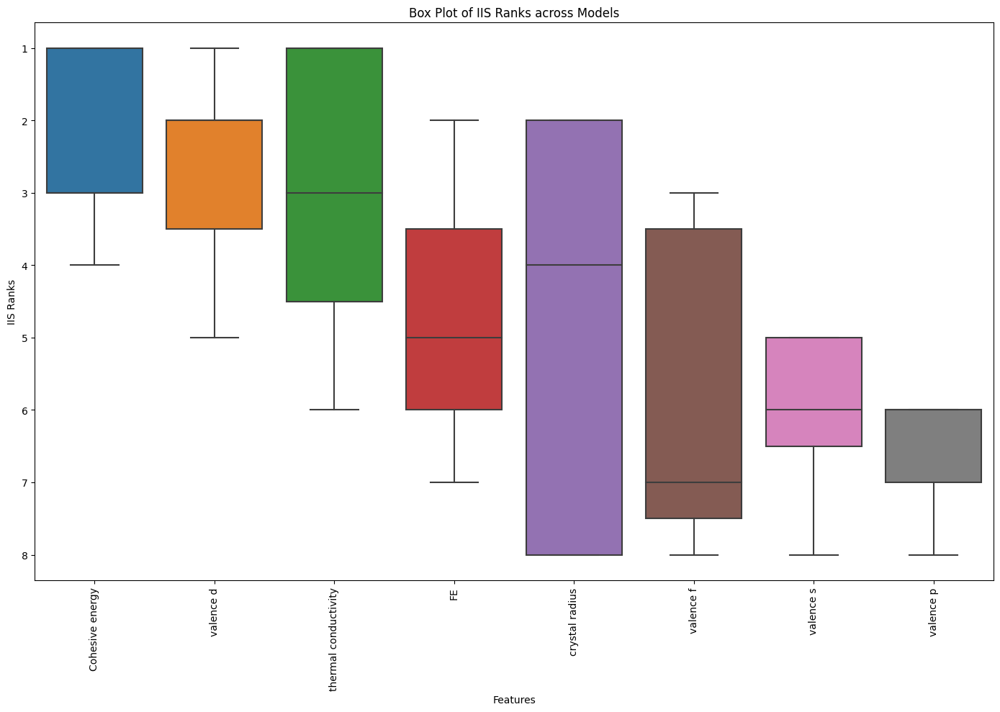

In [ ]:
IIS_data_sub.plot_IIS_mean_rank()

# D. Approach 2

In [ ]:
# Extract reference rows
data_ref = data[0:17]

In [ ]:
X_ref = data_ref[['Temp', 'GHSV', 'H2CO']]
y_ref = data_ref['F_STY']
X_ref

,Temp,GHSV,H2CO
0,255,3300,2.0
1,280,3300,2.0
2,305,3300,2.0
3,255,3300,2.1
4,280,3300,1.8
5,305,3300,2.0
6,256,7500,1.8
7,277,7500,1.8
8,300,11000,1.8
9,317,11000,1.8


In [ ]:
# Check variable correlation
corr_matrix = X_ref.corr()
print(corr_matrix)

          Temp      GHSV      H2CO
Temp  1.000000  0.622954 -0.373430
GHSV  0.622954  1.000000 -0.733952
H2CO -0.373430 -0.733952  1.000000


Since the input features are highly correlated which indicates the problem of multicollinearity. To deal with this, there are two ways:
1. PCA
2. Regularization techniques: lasso and ridge

### Option 1: PCA

## 1.fit target variable with reation conditions on reference rows


In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=2)

X_train = pca.fit_transform(X_train_std)
X_test = pca.transform(X_test_std)

explained_variance_ratio = pca.explained_variance_ratio_
print(explained_variance_ratio)

[0.68609629 0.22792537]


In [ ]:
print(len(X_train))
print(len(X_test))
# extremely small dataset -> simple model would be better

13
4


In [ ]:
X_train

array([[-1.12892639,  0.49587018],
       [-1.26159933, -0.05386147],
       [-0.60308738, -0.14137483],
       [-1.54642879,  0.2913129 ],
       [ 1.62166582,  1.53117617],
       [-0.97555668,  0.31000705],
       [ 0.89880633, -1.33976574],
       [ 1.01839394, -0.73865082],
       [ 0.43869719, -0.78217636],
       [-0.90982681,  0.23035143],
       [-1.74361842,  0.53027978],
       [ 3.29267418,  1.00659746],
       [ 0.89880633, -1.33976574]])

### Simple linear regression

In [ ]:
model_linear1 = LinearRegression()
model_linear1.fit(X_train, y_train)

# R2
train_r2 = model_linear1.score(X_train, y_train)
test_r2 = model_linear1.score(X_test, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_linear1.predict(X_train)
y_predicted_test = model_linear1.predict(X_test)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_linear1, X=X_train, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)

training R2:0.866
test R2:0.464
training RMSE 4.677
test RMSE: 3.639
mean CV R2: 0.397


## 2.fit the target variable with reaction condition on metal rows, based on models trained in part 1

### Prepare input features

In [ ]:
data_metal = data[17:]
len(data_metal)

172

In [ ]:
X_metal = data_metal[['Temp', 'GHSV', 'H2CO']]
y_metal = data_metal['F_STY']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal, y_metal, test_size=0.2, random_state=42)

In [ ]:
print(len(X_train))
print(len(X_test))

X_train

137
35


,Temp,GHSV,H2CO
118,323,11000,1.8
73,325,11000,1.9
59,326,11000,2.0
99,326,11000,1.8
82,354,15000,2.4
...,...,...,...
88,275,7500,2.4
123,276,7500,1.8
31,323,11000,1.8
109,303,11000,1.9


In [ ]:
# Standardize the features
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=2)

X_train = pca.fit_transform(X_train_std)
X_test = pca.transform(X_test_std)

In [ ]:
print(len(X_train))
X_train[0:10]

137


array([[ 0.69714938, -0.63405271],
       [ 0.79488497, -0.15294164],
       [ 0.87060528,  0.32932681],
       [ 0.76319526, -0.63752486],
       [ 2.87125982,  2.03228454],
       [ 3.92799388,  1.97673015],
       [ 0.21281294, -0.60859029],
       [ 0.80722584, -0.63983963],
       [ 0.19079764, -0.6074329 ],
       [ 0.28853324, -0.12632183]])

### Prepare target variable



**ensemble of linear/lasso/ridge regression**

increase the robustness of predictions

All three models have decent performances

linear models less likely to overfit compared to Decision Tree and Gradient Boosting models.


In [ ]:
# Concatenate X_train and X_test
X_full = np.concatenate((X_train, X_test), axis=0)
len(X_full)

172

In [ ]:
y_pred_linear = model_linear1.predict(X_full)
print(np.mean(y_metal)) # <- reaction conditions + catalytic descriptors
print(np.mean(y_pred_linear)) # <- reaction conditions

28.928443649373875
21.202141148122884


In [ ]:
# target variable
res = y_metal - y_pred_linear # <- catalytic descriptors
np.mean(res)

7.726302501250998

## 3.Use the residuals as target variable and fit with catalytic descriptors

In [ ]:
# uncorrelated set1!!! without OE, Pauling Electronegativity, specific heat -> 11-3=8 input features

X_metal_des = data_metal[["crystal radius",'FE',
          'valence s','valence p',"valence d",'valence f',
          "thermal conductivity","Cohesive energy"]]

X_metal_des

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
17,1.15,-0.771,2,0,1,1,11.4,4.32
18,1.15,-0.771,2,0,1,1,11.4,4.32
19,1.15,-0.771,2,0,1,1,11.4,4.32
20,1.15,-0.771,2,0,1,1,11.4,4.32
21,1.15,-0.771,2,0,1,1,11.4,4.32
...,...,...,...,...,...,...,...,...
184,0.69,-0.463,2,2,10,0,66.6,3.14
185,0.69,-0.463,2,2,10,0,66.6,3.14
186,0.69,-0.463,2,2,10,0,66.6,3.14
187,0.69,-0.463,2,2,10,0,66.6,3.14


In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal_des, res, test_size=0.2, random_state=0)

# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
# initialize an empty dictionary to store the evaluation results
results_fit = {}

# Initialize an empty dictionary to store the IIS
IIS_fit = {}

# initialize an empty dictionary to store models
models_fit = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)

model_DT2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_DT2.evaluate_model()

Random seed 0 finished



The objective has been evaluated at this point before.


Random seed 1 finished

Random seed 2 finished

Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_DT2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.777778,90.0,0.788625
4,valence d,2.333333,60.0,0.543429
1,FE,2.666667,60.0,0.525750
2,valence s,2.500000,40.0,0.400000
6,thermal conductivity,3.666667,30.0,0.291000
0,crystal radius,4.000000,30.0,0.283500
5,valence f,5.000000,30.0,0.267000
3,valence p,NaN,0.0,0.000000


In [ ]:
model_DT2.show_shap_ranks()

{'crystal radius': [5, 2, 5],
 'FE': [5, 2, 2, 3, 2, 2],
 'valence s': [6, 1, 2, 1],
 'valence p': [],
 'valence d': [2, 1, 1, 4, 3, 3],
 'valence f': [4, 5, 6],
 'thermal conductivity': [3, 4, 4],
 'Cohesive energy': [1, 1, 3, 3, 1, 1, 1, 1, 4]}

In [ ]:
model_DT2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.073191,0.045074,23.625307,21.516463,-0.124827
1,1,0.193090,0.140847,20.619874,26.469857,-0.025606
2,2,0.141544,0.202976,22.340834,21.925524,0.001437
3,3,0.085231,-0.119889,23.307883,24.535043,0.047158
4,4,0.176950,0.094518,22.184525,21.736266,0.061975
5,5,0.157422,0.106607,21.341130,26.126624,-0.057442
6,6,0.081536,0.030242,23.697385,21.091075,-0.160306
7,7,0.220301,-0.109452,21.477943,24.966841,0.112736
8,8,0.125749,0.108250,22.888389,21.799152,0.003430
9,9,0.162652,0.000965,22.524979,21.999805,-0.052146


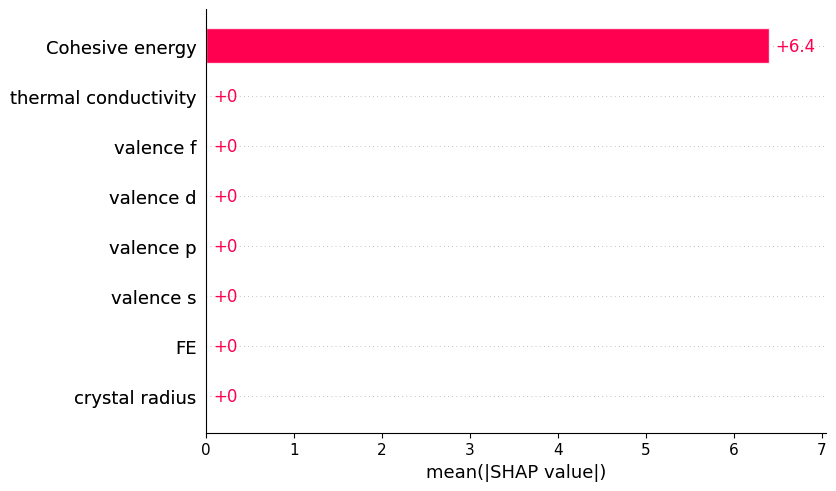

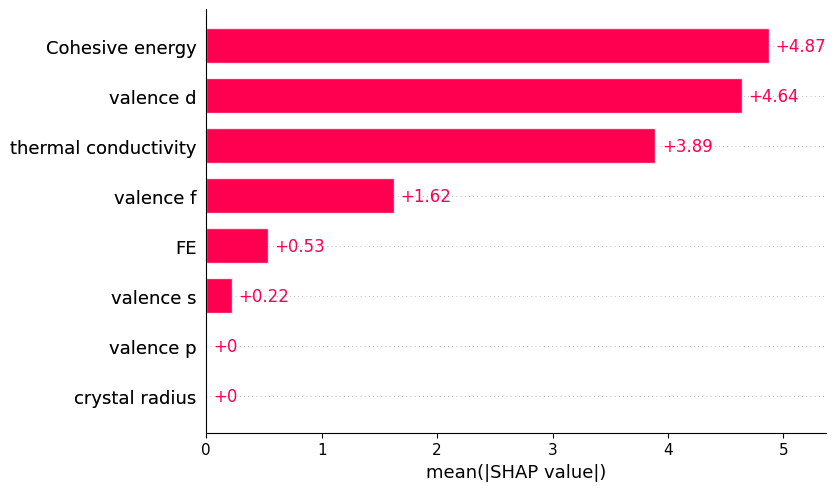

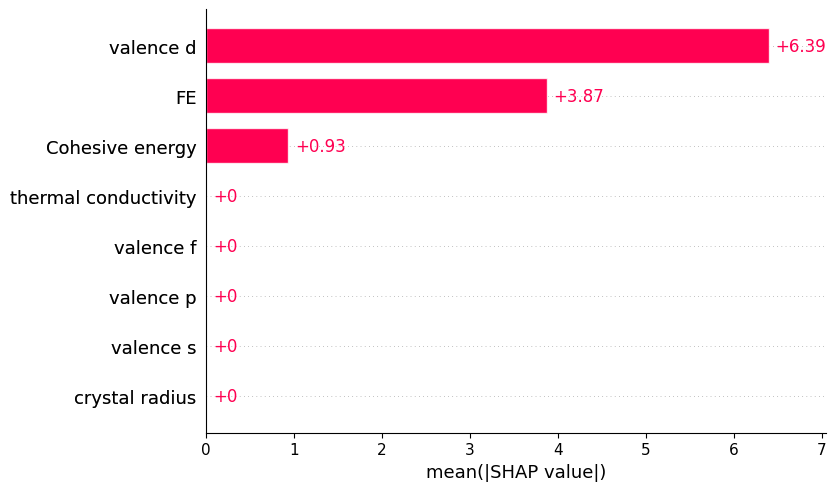

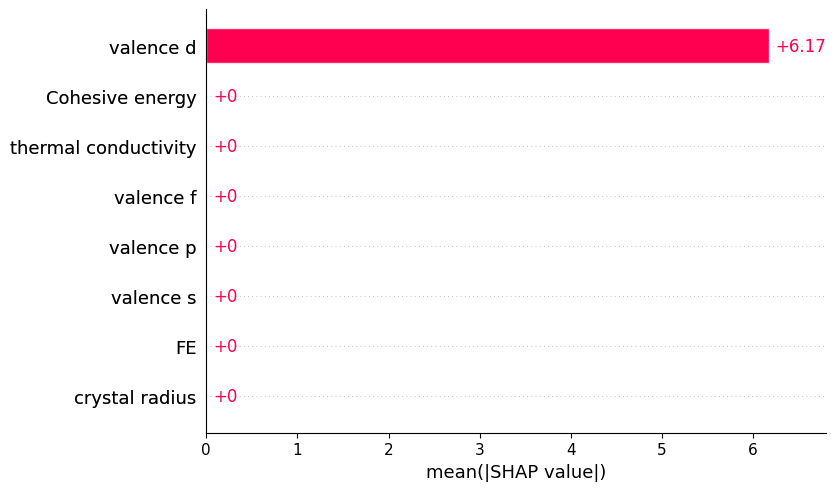

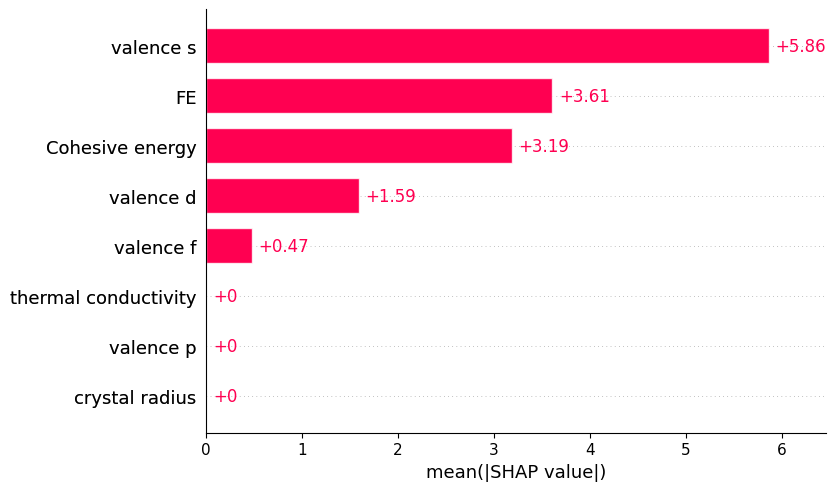

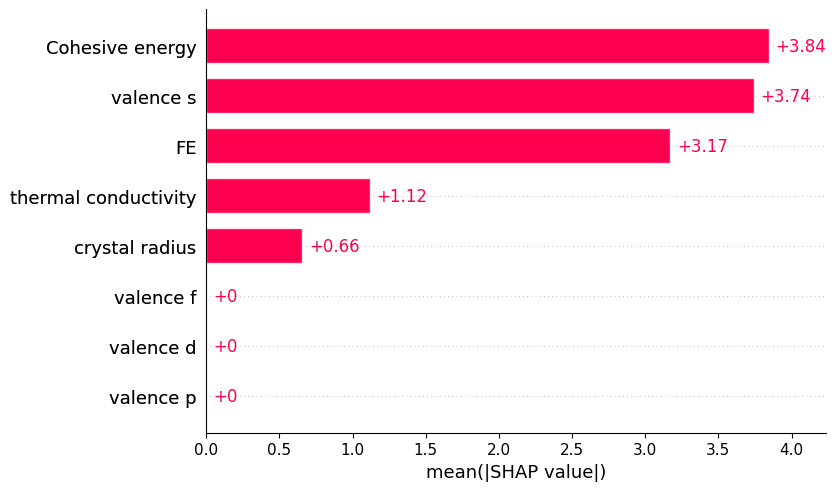

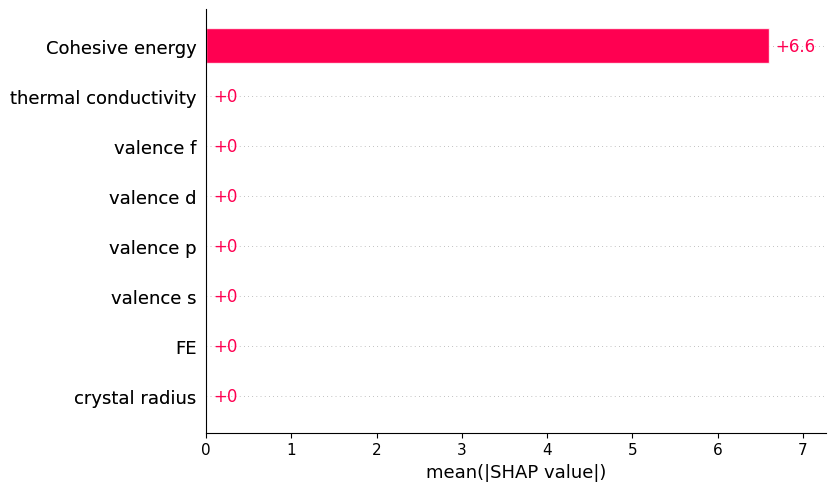

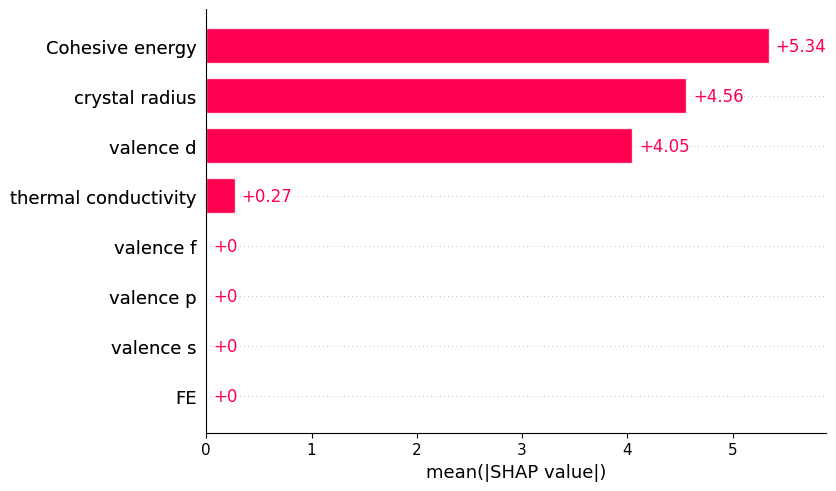

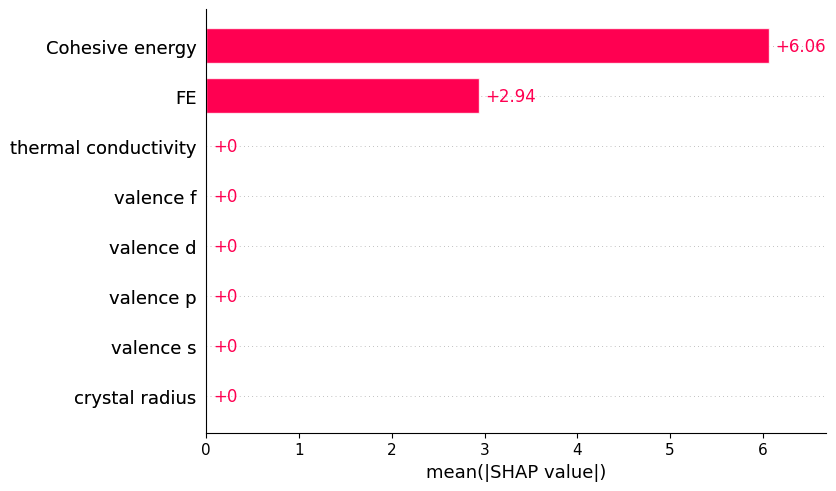

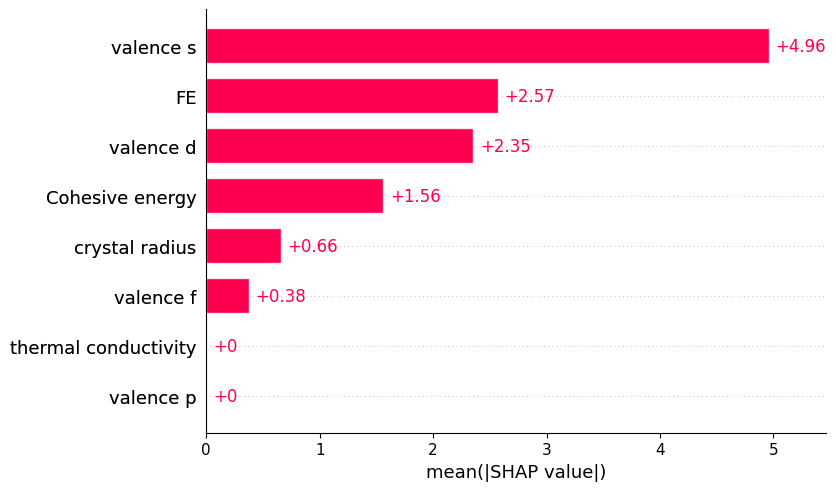

In [ ]:
model_DT2.plot_SHAP("all")

### Random Forest

In [ ]:
random_seeds = np.arange(0,10)
model_RF2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_RF2.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished



The objective has been evaluated at this point before.


Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.400,100.0,0.905714
4,valence d,2.600,100.0,0.796923
1,FE,3.300,100.0,0.770000
0,crystal radius,3.600,100.0,0.761667
2,valence s,4.200,100.0,0.748571
6,thermal conductivity,5.900,100.0,0.725932
5,valence f,7.100,100.0,0.716479
3,valence p,7.875,80.0,0.577905


In [ ]:
model_RF2.show_shap_ranks()

{'crystal radius': [5, 4, 4, 4, 4, 4, 1, 2, 5, 3],
 'FE': [4, 3, 3, 3, 3, 2, 6, 3, 2, 4],
 'valence s': [1, 5, 5, 5, 5, 5, 3, 4, 4, 5],
 'valence p': [7, 8, 8, 8, 8, 8, 8, 8],
 'valence d': [3, 2, 1, 1, 2, 3, 4, 5, 3, 2],
 'valence f': [8, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 'thermal conductivity': [6, 6, 6, 6, 6, 6, 5, 6, 6, 6],
 'Cohesive energy': [2, 1, 2, 2, 1, 1, 2, 1, 1, 1]}

In [ ]:
model_RF2.show_parameters()

{0: OrderedDict([('max_depth', 10),
              ('max_features', 1),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.08948574332824573)]),
 1: OrderedDict([('max_depth', 3),
              ('max_features', 5),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.1)]),
 2: OrderedDict([('max_depth', 3),
              ('max_features', 6),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.012993235659035401)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 2),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.06867424551960112)]),
 4: OrderedDict([('max_depth', 2),
              ('max_features', 8),
              ('min_samples_leaf', 8),
              ('min_samples_split', 0.07969233641787896)]),
 5: OrderedDict([('max_depth', 8),
              ('max_features', 4),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.01023920336927033

In [ ]:
model_RF2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.135476,0.032242,22.817654,21.660540,0.018193
1,1,0.172096,0.124875,20.886393,26.714770,0.003814
2,2,0.149604,0.188850,22.235719,22.118968,0.013828
3,3,0.179076,0.006570,22.079967,23.108306,0.064434
4,4,0.167973,0.054908,22.305185,22.206589,0.062315
5,5,0.146712,0.132633,21.476338,25.743257,-0.039400
6,6,0.115642,-0.009754,23.253241,21.521613,-0.099103
7,7,0.174771,-0.032559,22.096150,24.086115,0.092252
8,8,0.127855,0.260719,22.860797,19.848283,0.047021
9,9,0.158871,0.078338,22.575786,21.130721,-0.012525


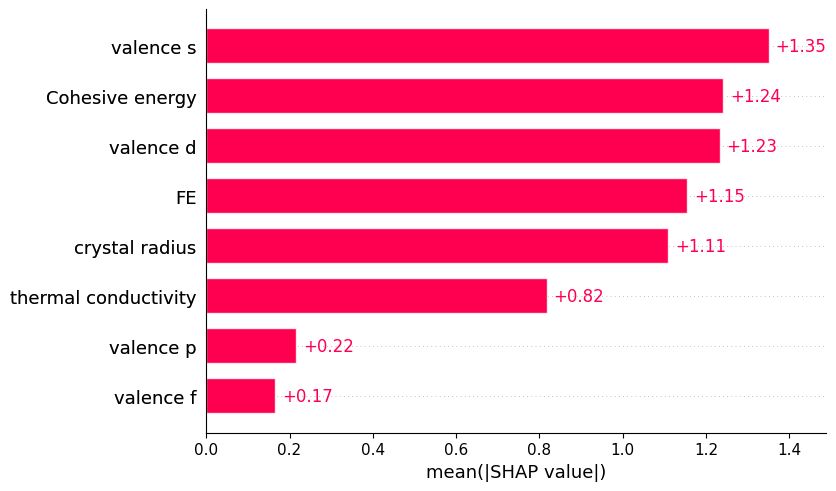

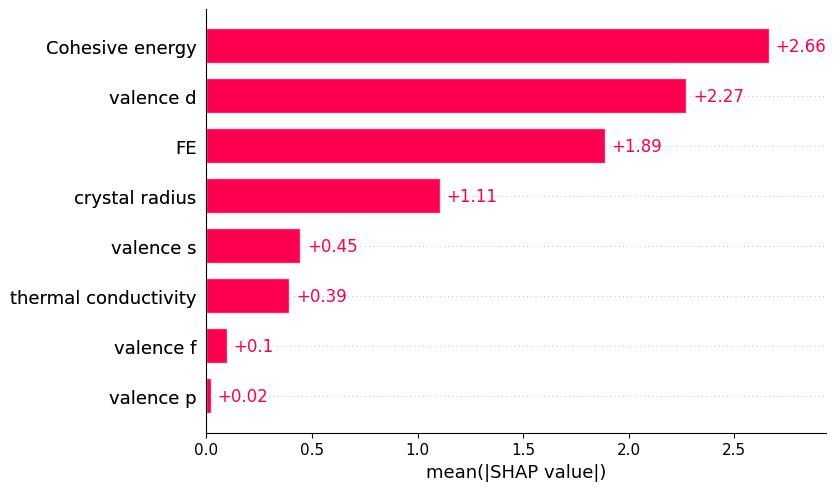

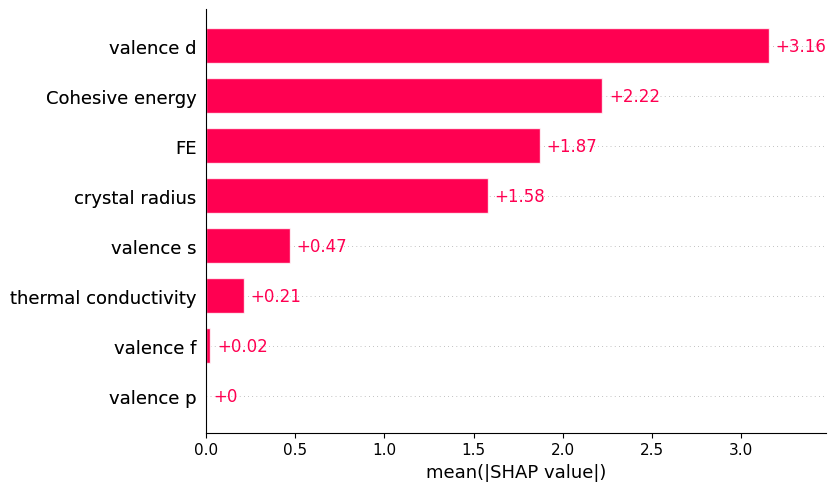

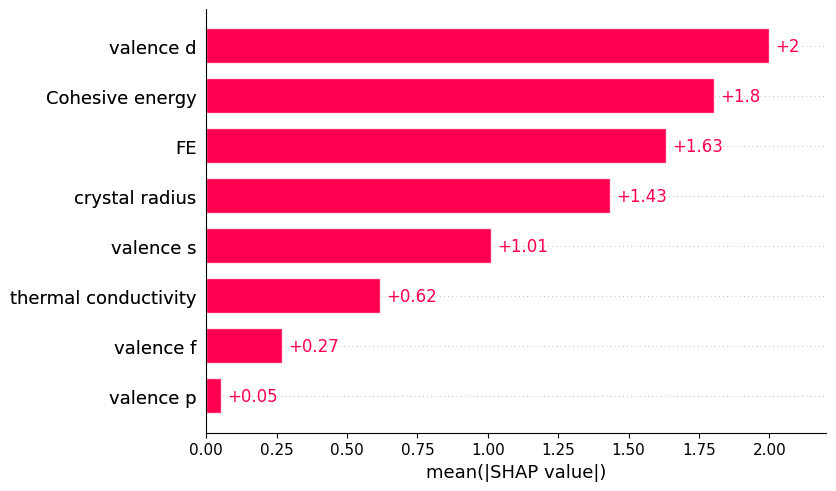

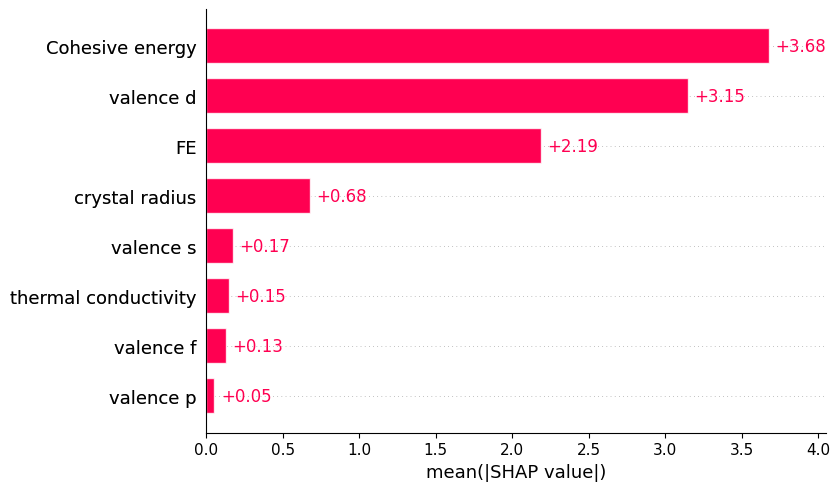

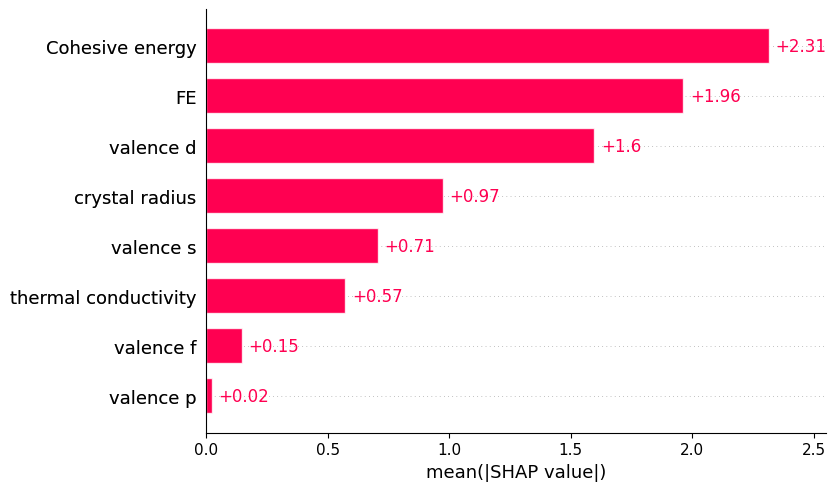

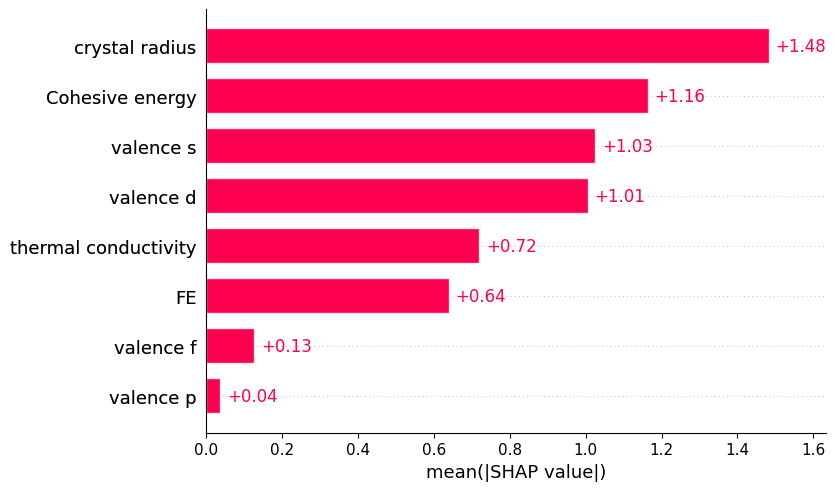

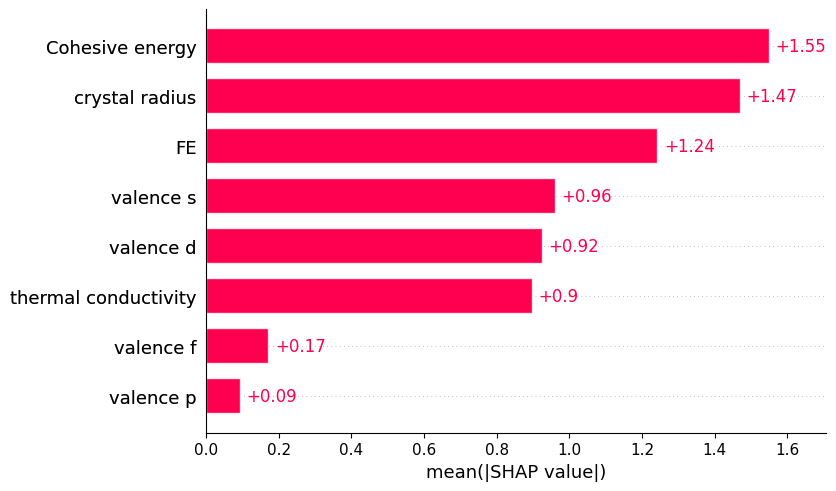

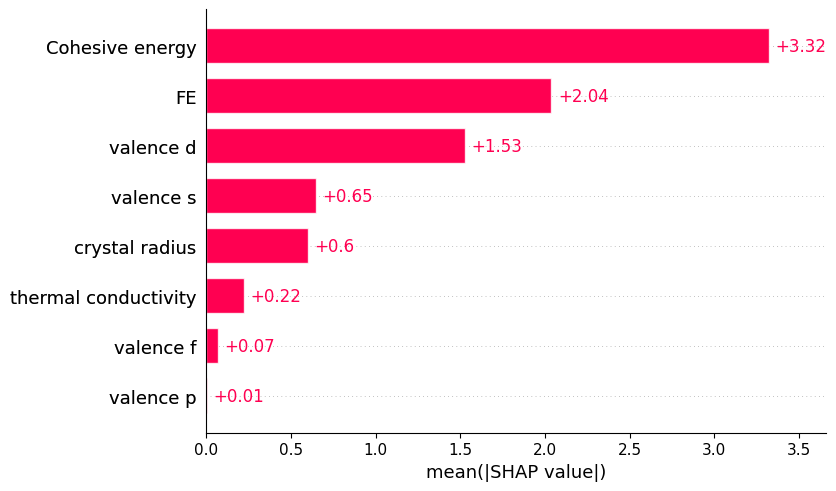

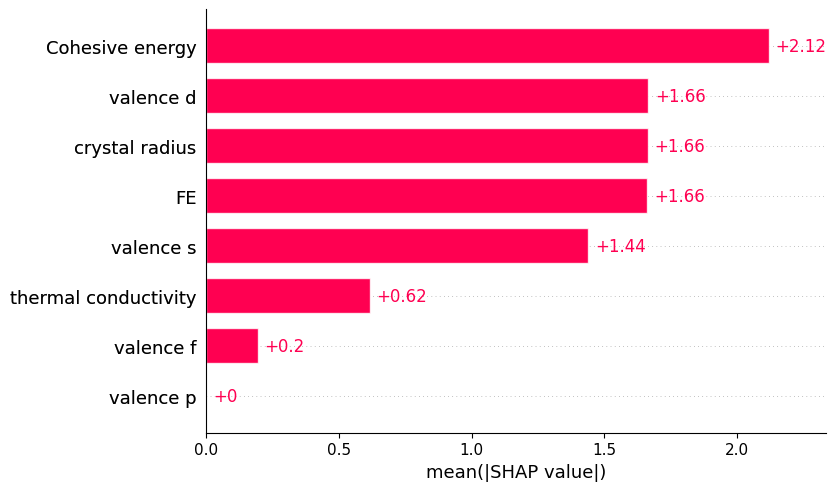

In [ ]:
model_RF2.plot_SHAP("all")

### Gradient boost regressor

In [ ]:
random_seeds = np.arange(0,10)
model_GB2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_GB2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.800000,100.0,0.853333
1,FE,2.500000,100.0,0.802000
4,valence d,4.500000,100.0,0.743333
0,crystal radius,3.222222,90.0,0.705414
6,thermal conductivity,4.777778,90.0,0.672070
5,valence f,5.750000,80.0,0.593391
2,valence s,6.000000,80.0,0.591000
3,valence p,6.500000,60.0,0.452769


In [ ]:
model_GB2.show_shap_ranks()

{'crystal radius': [3, 4, 5, 2, 3, 2, 3, 5, 2],
 'FE': [2, 2, 2, 3, 2, 5, 3, 2, 1, 3],
 'valence s': [8, 7, 7, 4, 2, 5, 7, 8],
 'valence p': [7, 5, 8, 7, 8, 4],
 'valence d': [4, 1, 1, 8, 1, 7, 8, 6, 3, 6],
 'valence f': [5, 5, 6, 6, 6, 6, 5, 7],
 'thermal conductivity': [6, 6, 3, 7, 4, 4, 4, 4, 5],
 'Cohesive energy': [1, 3, 4, 1, 3, 1, 1, 1, 2, 1]}

In [ ]:
model_GB2.show_parameters()

{0: OrderedDict([('learning_rate', 0.033999077954387856),
              ('max_depth', 6),
              ('min_samples_leaf', 7),
              ('min_samples_split', 2),
              ('n_estimators', 20)]),
 1: OrderedDict([('learning_rate', 0.08895160416425743),
              ('max_depth', 2),
              ('min_samples_leaf', 6),
              ('min_samples_split', 5),
              ('n_estimators', 52)]),
 2: OrderedDict([('learning_rate', 0.011185028963242912),
              ('max_depth', 10),
              ('min_samples_leaf', 9),
              ('min_samples_split', 9),
              ('n_estimators', 82)]),
 3: OrderedDict([('learning_rate', 0.005814939591725667),
              ('max_depth', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 142)]),
 4: OrderedDict([('learning_rate', 0.014776303366769803),
              ('max_depth', 1),
              ('min_samples_leaf', 10),
              ('min_samples_split', 4),


In [ ]:
model_GB2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.136734,0.026995,22.801050,21.719186,0.026241
1,1,0.192399,0.140508,20.628701,26.475079,0.002940
2,2,0.137123,0.157634,22.398288,22.540564,0.013903
3,3,0.179204,0.028593,22.078253,22.850722,0.079845
4,4,0.152716,0.063039,22.508757,22.110868,0.066751
5,5,0.138515,0.094308,21.579252,26.305845,-0.018816
6,6,0.125942,0.059370,23.117428,20.771916,-0.112093
7,7,0.203239,-0.022664,21.711670,23.970426,0.105458
8,8,0.139443,0.220940,22.708419,20.375281,0.058818
9,9,0.145430,0.083603,22.755445,21.070278,-0.002753


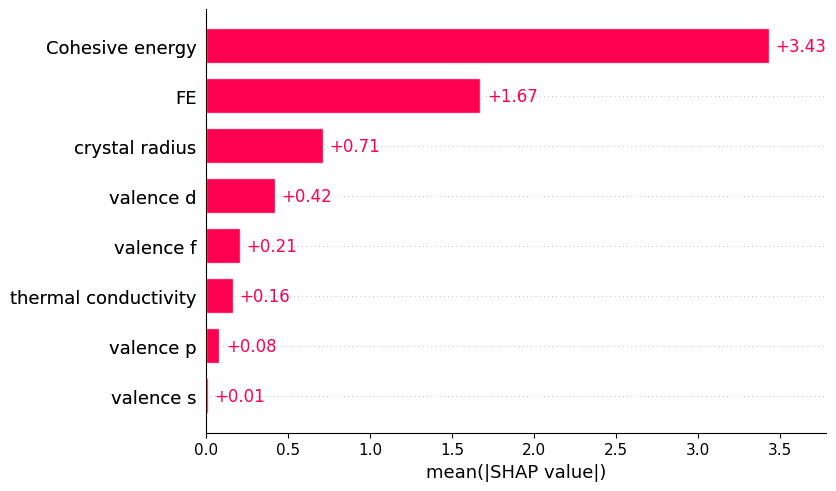

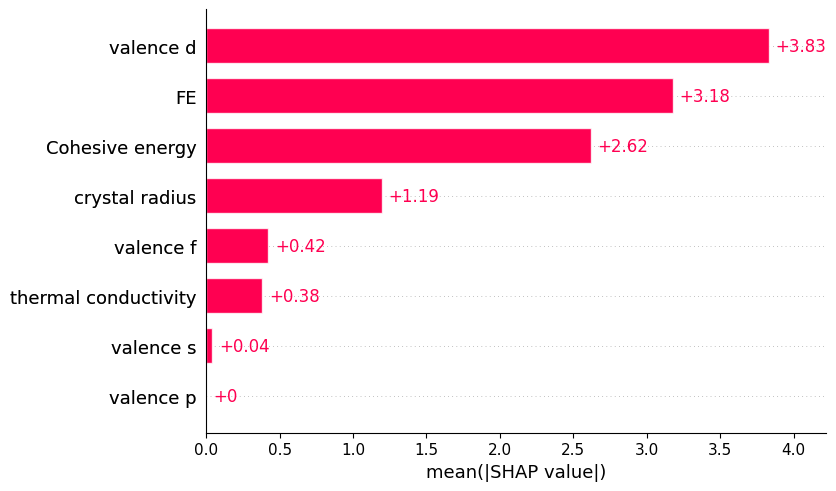

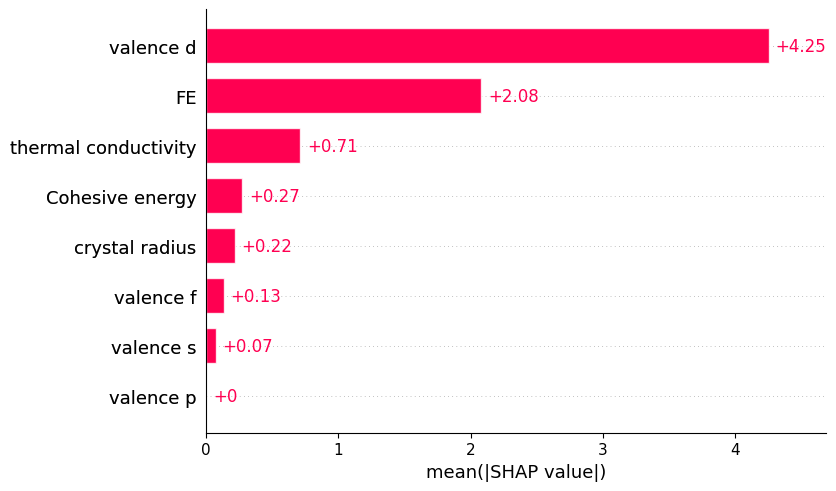

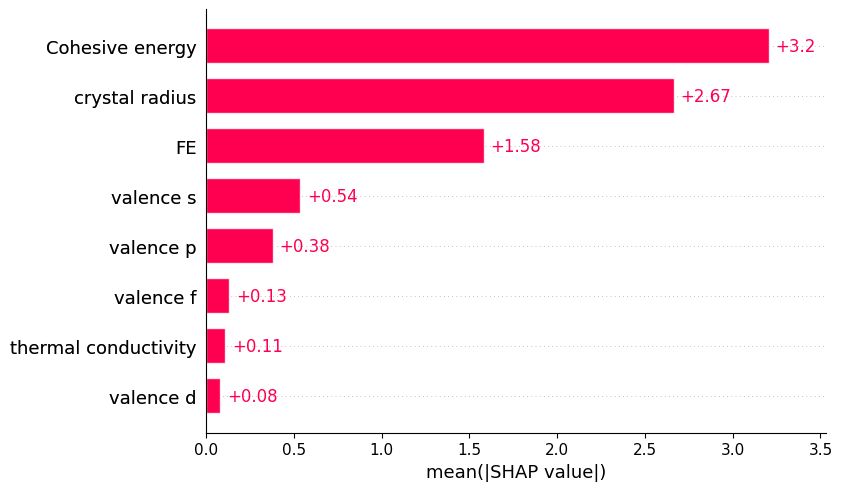

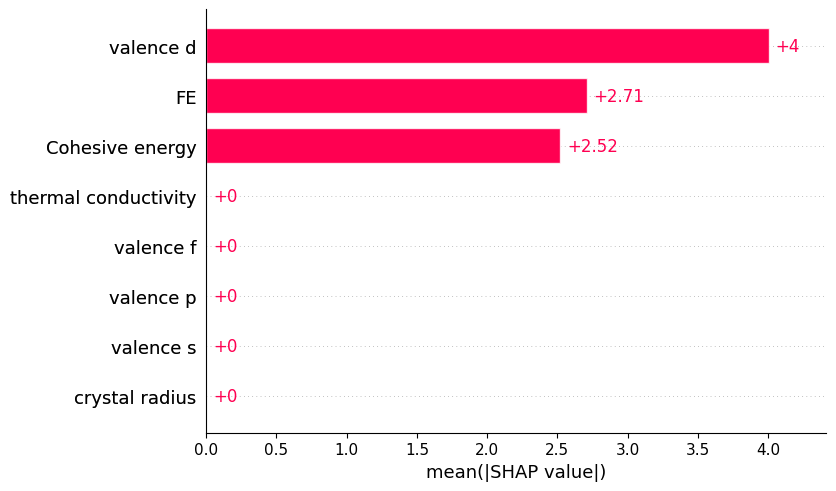

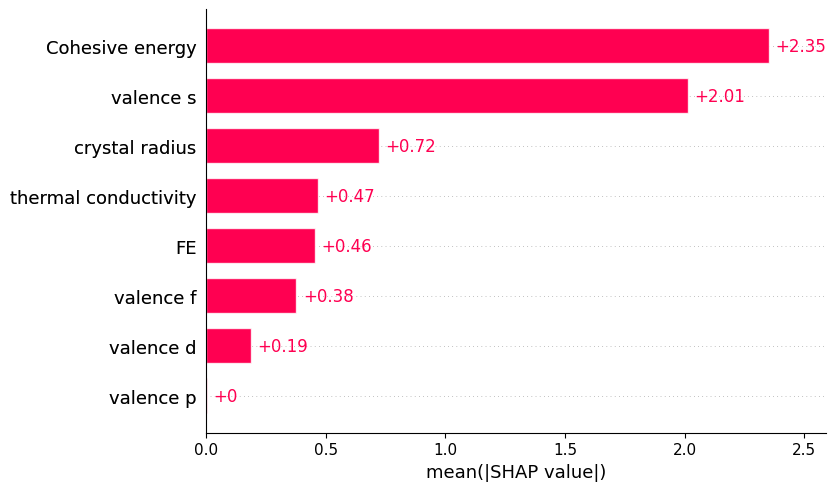

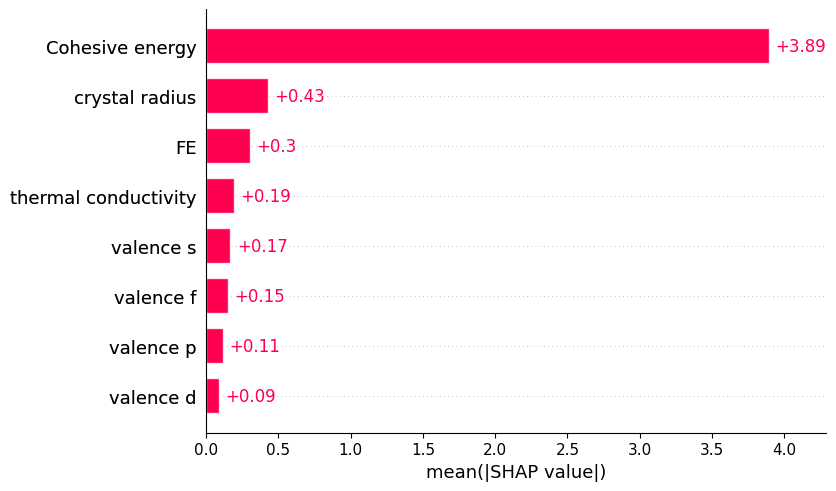

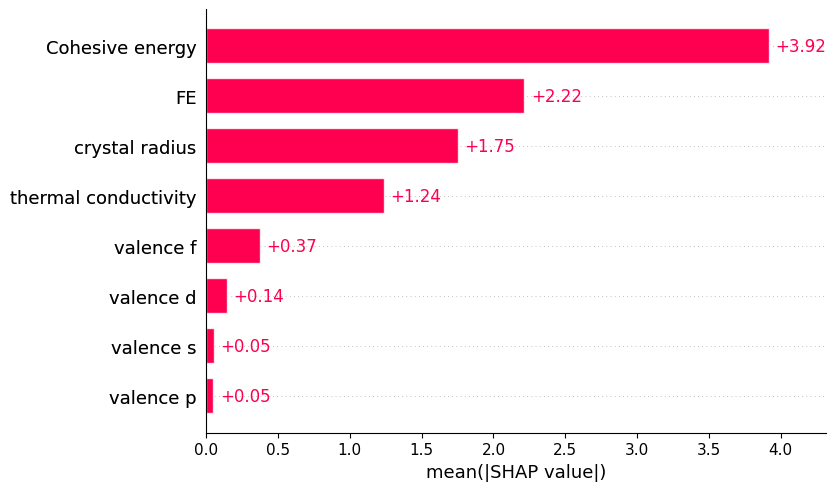

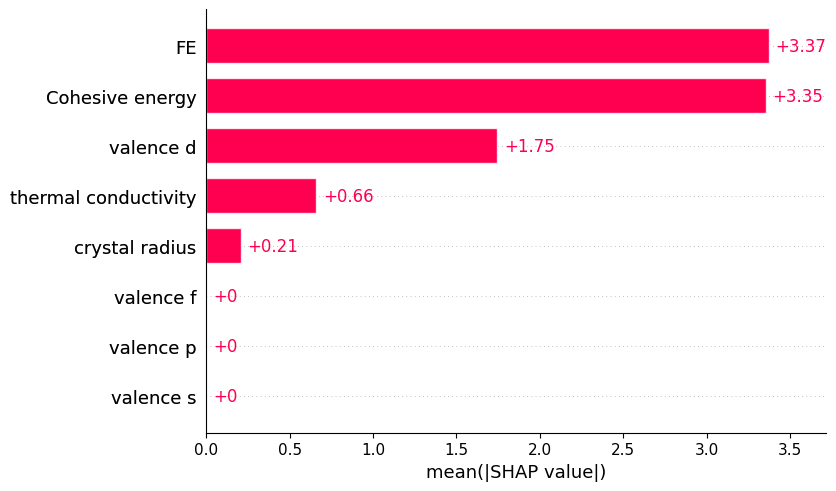

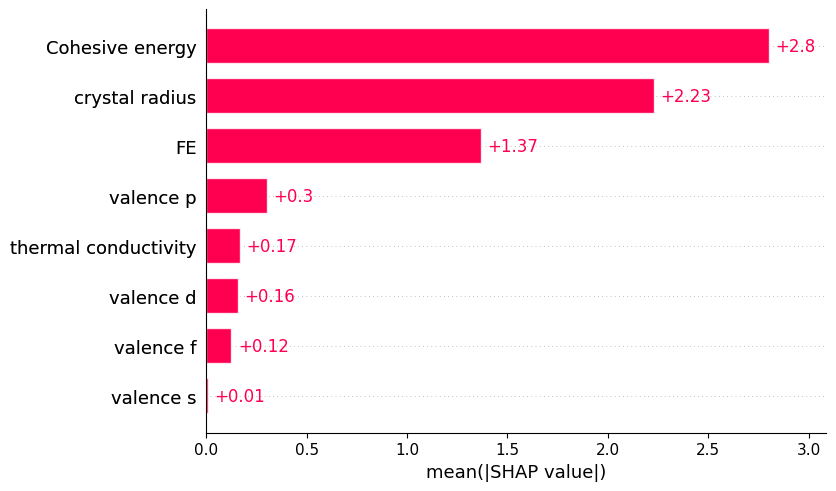

In [ ]:
model_GB2.plot_SHAP("all")

### XGBoost regressor

In [ ]:
random_seeds = np.arange(0,10)
model_XGB2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_XGB2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished



The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.400000,100.0,0.905714
1,FE,2.600000,100.0,0.796923
0,crystal radius,2.750000,80.0,0.656000
4,valence d,2.600000,50.0,0.461923
2,valence s,3.333333,30.0,0.300000
6,thermal conductivity,5.000000,20.0,0.200000
5,valence f,6.000000,20.0,0.189000
3,valence p,NaN,0.0,0.000000


In [ ]:
model_XGB2.show_shap_ranks()

{'crystal radius': [3, 3, 4, 1, 3, 2, 3, 3],
 'FE': [2, 2, 3, 3, 3, 4, 3, 2, 2, 2],
 'valence s': [1, 4, 5],
 'valence p': [],
 'valence d': [4, 1, 1, 3, 4],
 'valence f': [5, 7],
 'thermal conductivity': [4, 6],
 'Cohesive energy': [1, 1, 2, 2, 2, 2, 1, 1, 1, 1]}

In [ ]:
model_XGB2.show_parameters()

{0: OrderedDict([('learning_rate', 0.04738519858591399),
              ('max_depth', 10),
              ('n_estimators', 48),
              ('reg_alpha', 2.0110024557554422),
              ('reg_lambda', 100.0)]),
 1: OrderedDict([('learning_rate', 0.011821962817740256),
              ('max_depth', 10),
              ('n_estimators', 200),
              ('reg_alpha', 100.0),
              ('reg_lambda', 1e-06)]),
 2: OrderedDict([('learning_rate', 0.018758614358804337),
              ('max_depth', 1),
              ('n_estimators', 161),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 15.03233911917798)]),
 3: OrderedDict([('learning_rate', 0.00998410189864726),
              ('max_depth', 10),
              ('n_estimators', 90),
              ('reg_alpha', 3.6044439231193886e-05),
              ('reg_lambda', 0.03561031384115874)]),
 4: OrderedDict([('learning_rate', 0.02716486014975691),
              ('max_depth', 1),
              ('n_estimators', 84),
            

In [ ]:
model_XGB2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.118099,-0.009191,23.045835,22.119361,0.040305
1,1,0.157013,0.110201,21.075797,26.937821,0.023082
2,2,0.119439,0.131405,22.626653,22.888807,0.016298
3,3,0.173948,-0.021700,22.148828,23.434788,0.071139
4,4,0.139608,0.066783,22.682198,22.066647,0.066573
5,5,0.136158,0.083480,21.608748,26.462622,-0.006365
6,6,0.119005,0.017400,23.208976,21.230271,-0.090672
7,7,0.169805,-0.029384,22.162531,24.049051,0.096661
8,8,0.120433,0.190498,22.957870,20.769545,0.062289
9,9,0.154855,0.080065,22.629611,21.110916,-0.019016


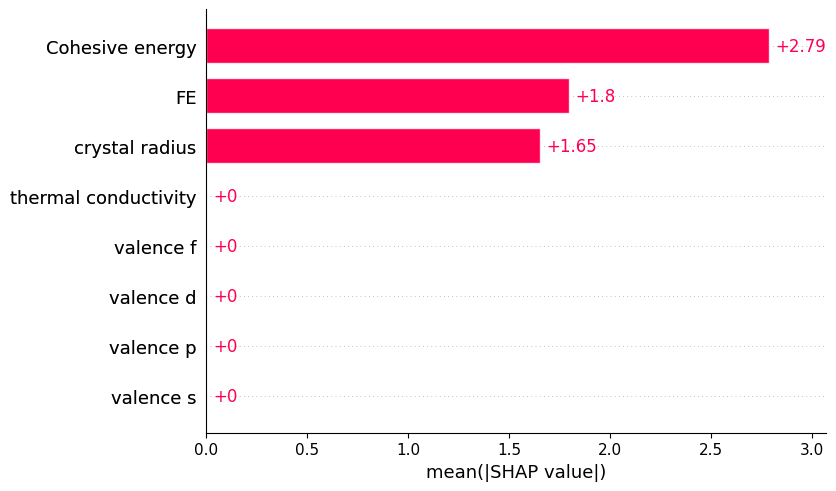

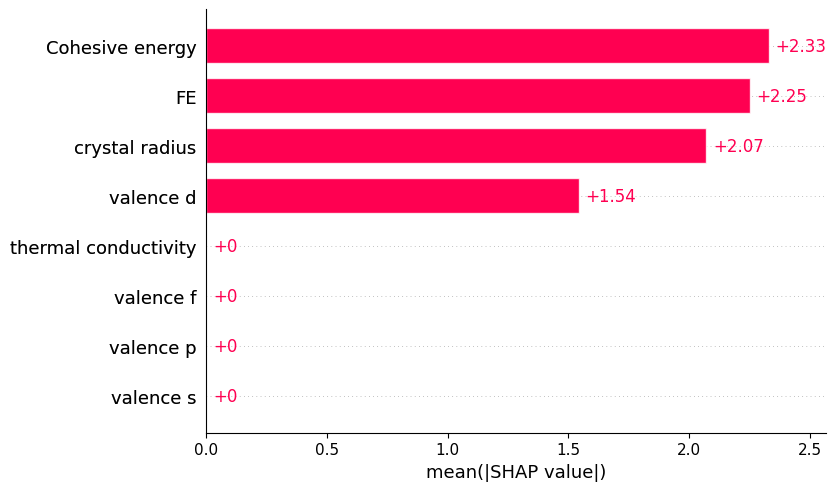

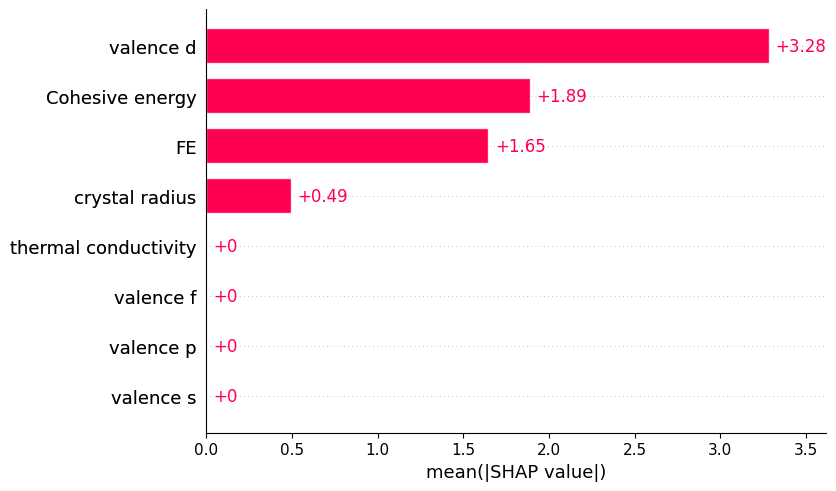

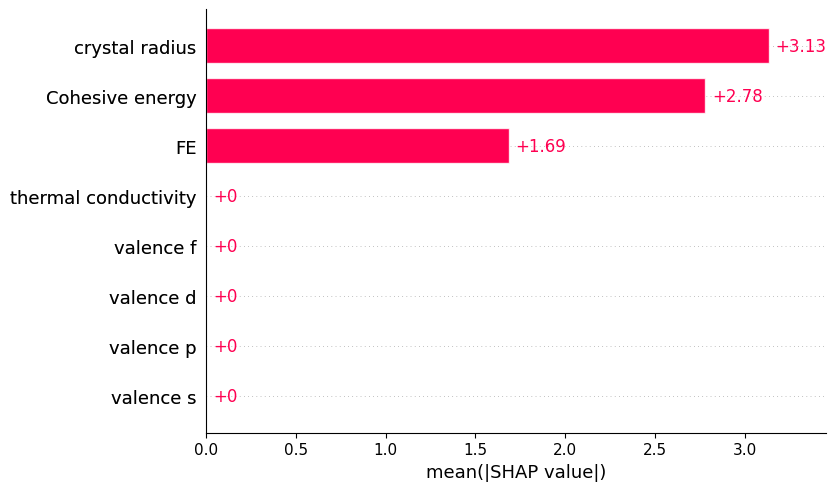

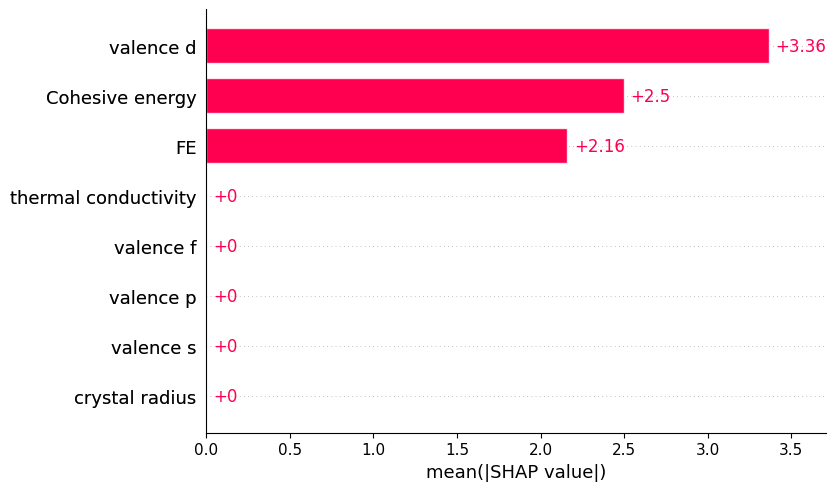

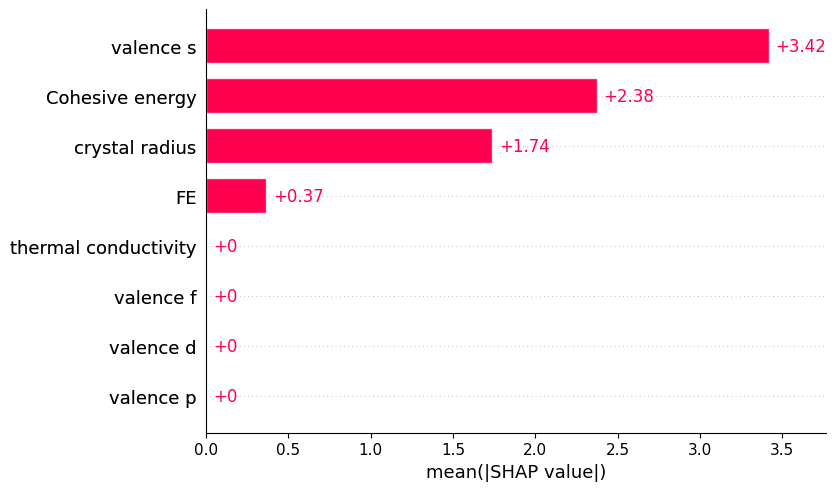

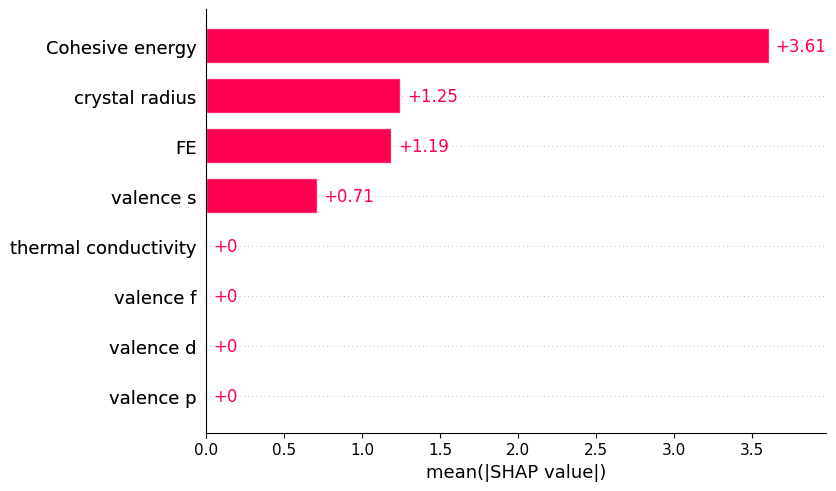

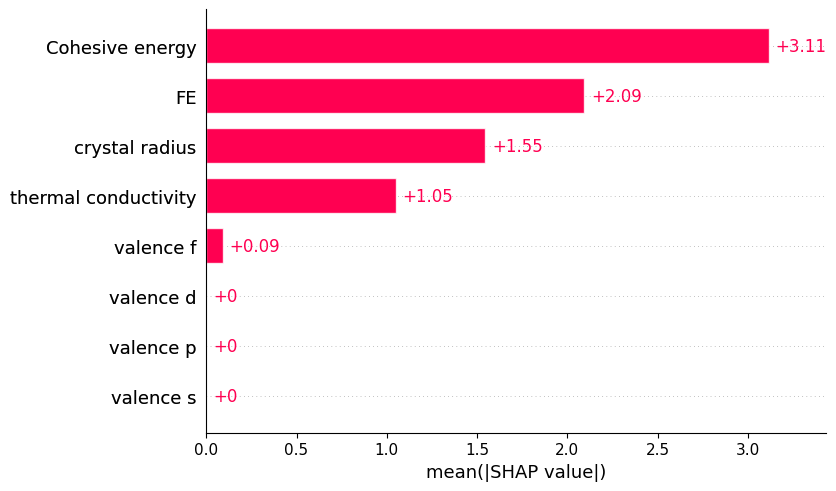

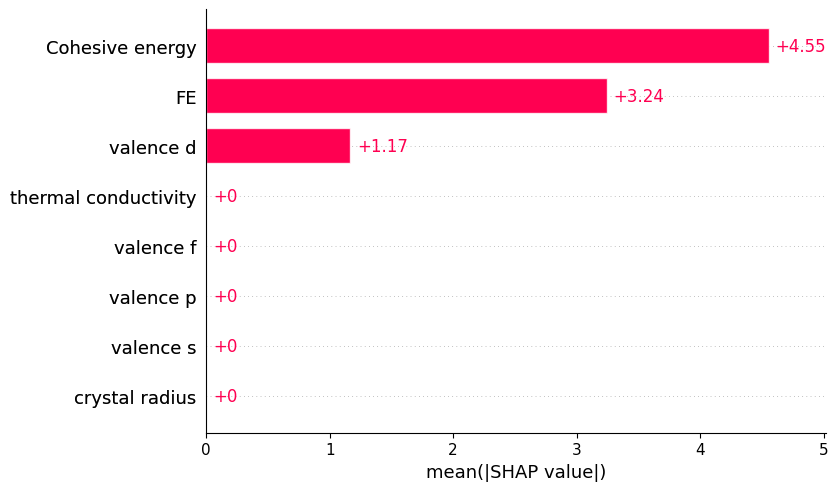

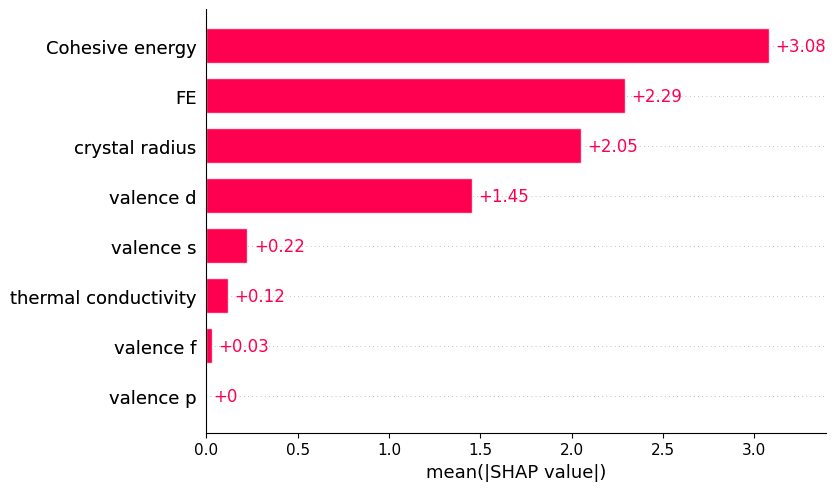

In [ ]:
model_XGB2.plot_SHAP("all")

### Support vector regression

In [ ]:
random_seeds = np.arange(0,10)
model_SVR2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, SVR, param_space_SVR, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_SVR2.evaluate_model()

Exact explainer: 138it [00:26,  3.25it/s]


Random seed 0 finished



Exact explainer: 138it [00:29,  2.87it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



Exact explainer: 138it [00:31,  2.86it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



Exact explainer: 138it [00:30,  2.85it/s]


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:29,  2.96it/s]


Random seed 6 finished



Exact explainer: 138it [00:31,  2.97it/s]


Random seed 7 finished



Exact explainer: 138it [00:29,  3.12it/s]


Random seed 8 finished



Exact explainer: 138it [00:33,  2.99it/s]

Random seed 9 finished



In [ ]:
model_SVR2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
7,Cohesive energy,3.4,100.0,0.767059
5,valence f,3.6,100.0,0.761667
2,valence s,5.2,100.0,0.733462
3,valence p,6.0,100.0,0.725000
1,FE,7.0,100.0,0.717143
0,crystal radius,7.8,100.0,0.712308


In [ ]:
model_SVR2.show_shap_ranks()

{'crystal radius': [6, 8, 8, 8, 8, 8, 8, 8, 8, 8],
 'FE': [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 'valence s': [5, 5, 5, 5, 6, 6, 5, 5, 5, 5],
 'valence p': [8, 6, 6, 6, 5, 5, 6, 6, 6, 6],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [3, 4, 3, 4, 3, 3, 4, 4, 4, 4],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [4, 3, 4, 3, 4, 4, 3, 3, 3, 3]}

In [ ]:
model_SVR2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.073916,-0.055934,23.616075,22.625824,0.049371
1,1,0.169897,0.123243,20.914114,26.739666,0.017560
2,2,0.113509,0.118603,22.702702,23.056858,0.003739
3,3,0.186960,0.040344,21.973697,22.712097,0.079630
4,4,0.127291,-0.009966,22.843974,22.956105,0.073619
5,5,0.039270,0.002129,22.788358,27.612078,-0.094258
6,6,0.116047,-0.043194,23.247911,21.875084,-0.114041
7,7,0.208969,-0.029743,21.633456,24.053243,0.073805
8,8,0.136097,0.227323,22.752528,20.291640,0.046299
9,9,0.166687,0.136861,22.470650,20.448842,-0.032745


In [ ]:
model_SVR2.show_parameters()

{0: OrderedDict([('C', 168.3403716009009),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 14.048407293353346),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 1000.0),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 3.417919370569384),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 1000.0),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 0.5417530867998304),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 1.7976092009427667),
              ('epsilon', 0.29119245581398945),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),

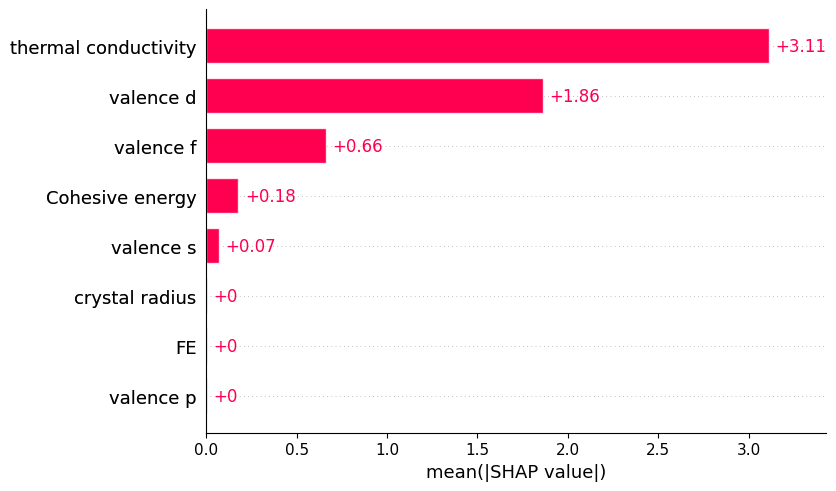

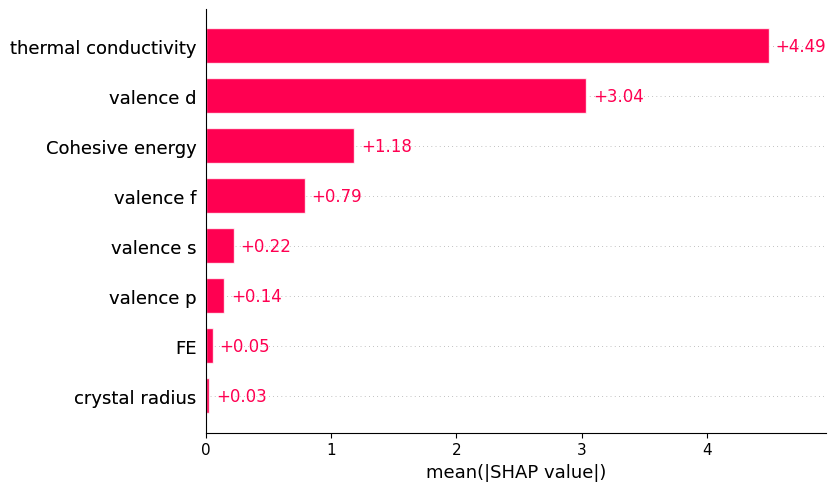

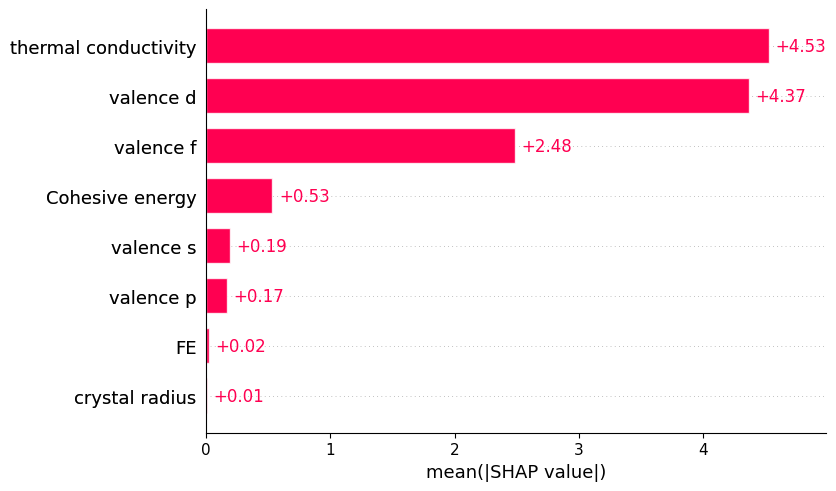

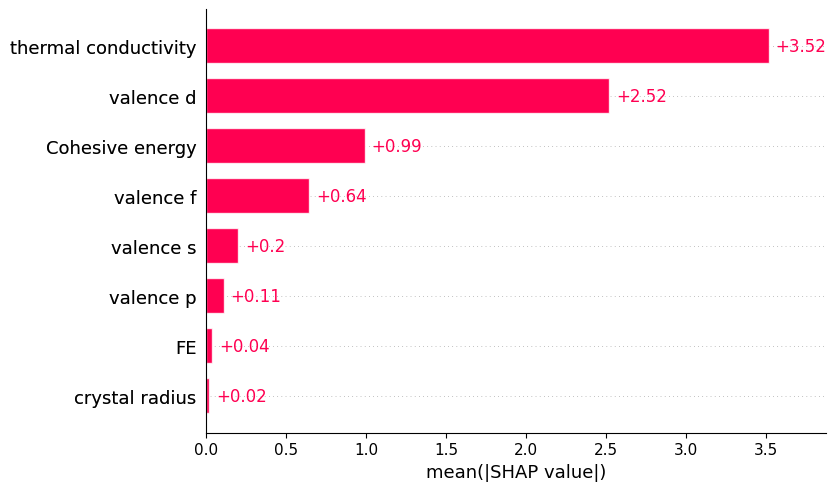

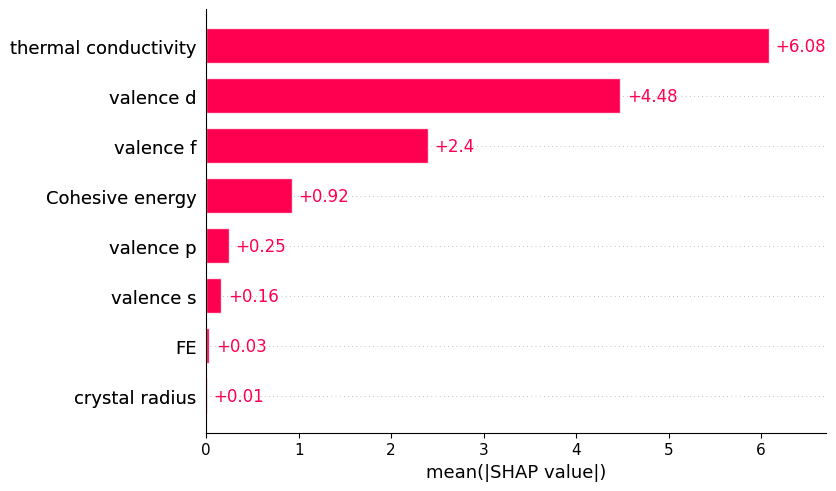

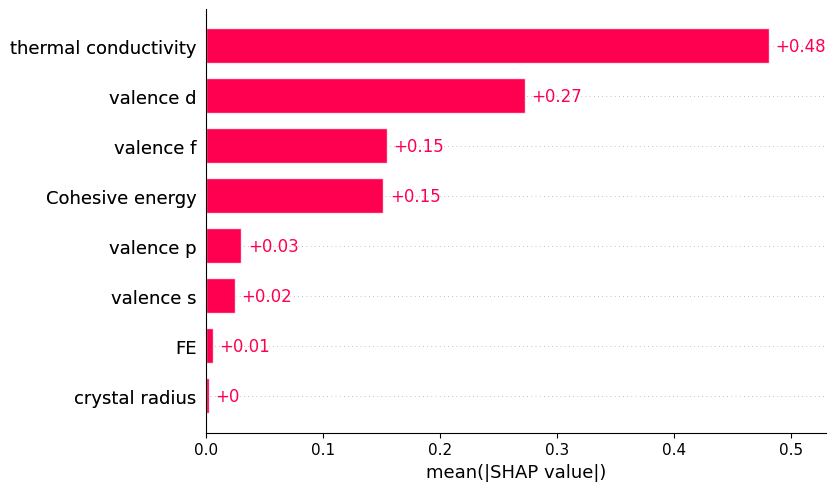

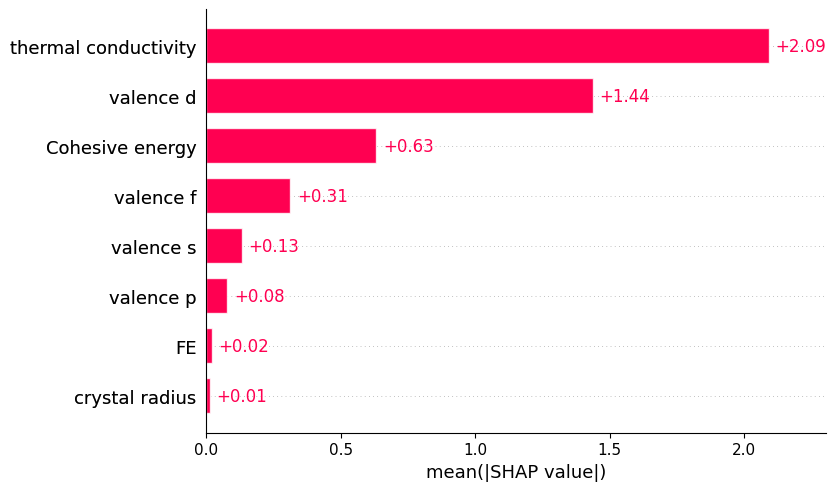

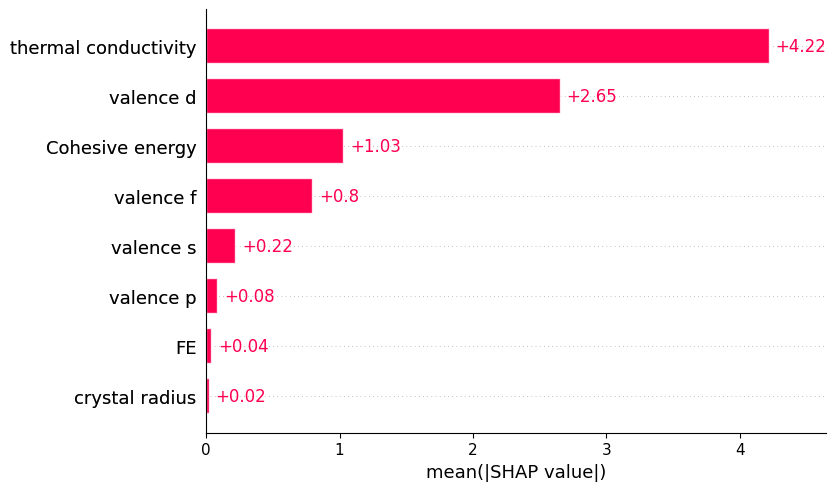

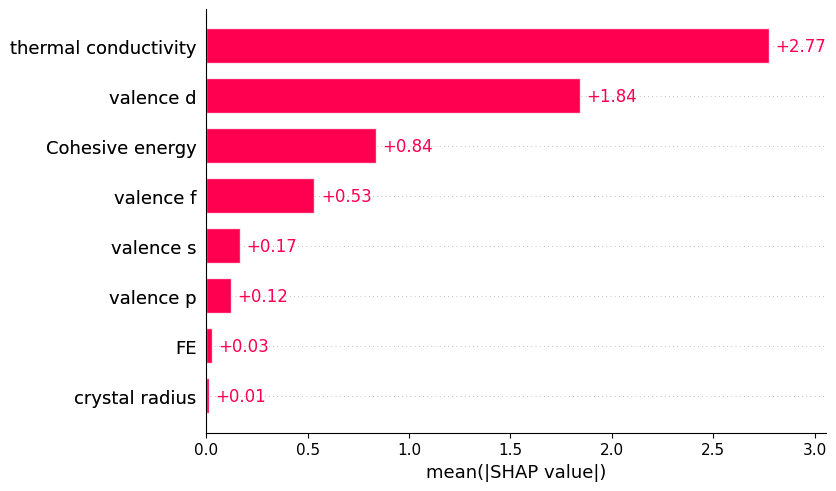

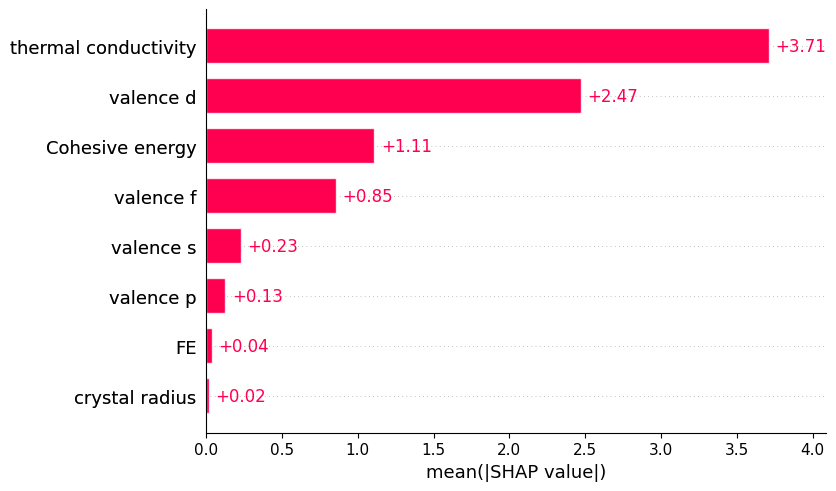

In [ ]:
model_SVR2.plot_SHAP("all")

### Gaussian process

In [ ]:
random_seeds = np.arange(0,10)
kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_GP2.evaluate_model()

The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the 

Random seed 0 finished



The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the spec

Random seed 1 finished



The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to th

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to 

Random seed 4 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 138it [00:43,  2.42it/s]


Random seed 5 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale i

Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
Exact explainer: 138it [00:42,  2.50it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 9 finished



In [ ]:
model_GP2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
7,Cohesive energy,3.1,100.0,0.776452
1,FE,4.9,100.0,0.737347
2,valence s,5.0,100.0,0.736000
0,crystal radius,5.9,100.0,0.725932
5,valence f,6.3,100.0,0.722381
3,valence p,7.8,100.0,0.712308


In [ ]:
model_GP2.show_shap_ranks()

{'crystal radius': [6, 7, 5, 7, 4, 8, 5, 6, 5, 6],
 'FE': [4, 5, 4, 6, 5, 7, 4, 5, 4, 5],
 'valence s': [5, 4, 6, 4, 6, 5, 6, 4, 6, 4],
 'valence p': [8, 8, 8, 8, 8, 6, 8, 8, 8, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [7, 6, 7, 5, 7, 3, 7, 7, 7, 7],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 3, 3, 4, 3, 3, 3, 3]}

In [ ]:
model_GP2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.154978,0.037783,22.558824,21.598439,-0.023258
1,1,0.181792,0.135879,20.763737,26.546284,-0.008616
2,2,0.145937,0.185372,22.283602,22.166342,-0.005794
3,3,0.192082,0.028254,21.904362,22.854714,0.061090
4,4,0.171463,0.110031,22.258351,21.549263,0.052216
5,5,0.075031,-0.001379,22.360219,27.660570,-0.096340
6,6,0.134695,0.010328,23.001386,21.306528,-0.110130
7,7,0.181696,-0.032383,22.003243,24.084061,0.074334
8,8,0.154132,0.250562,22.513783,19.984162,0.051541
9,9,0.157270,0.061673,22.597261,21.320896,-0.020978


In [ ]:
model_GP2.show_parameters()

{0: OrderedDict([('alpha', 512.6016082831624),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 45690.384962778895),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 1: OrderedDict([('alpha', 243.01410193012674),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 7755.977942249798),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 2: OrderedDict([('alpha', 378.2817049252464),
              ('kernel__k1__k1__constant_value', 0.9113848425065547),
              ('kernel__k1__k2__alpha', 6149.827608383052),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 3: OrderedDict([('alpha', 450.4862488375126),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k

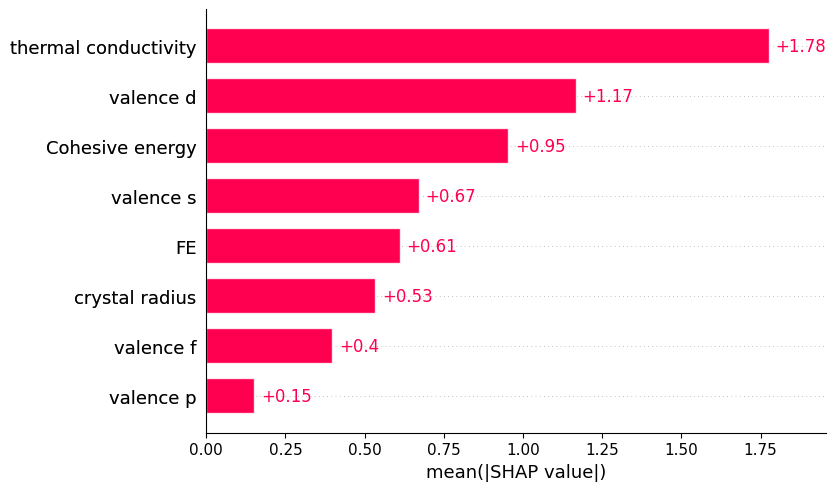

In [ ]:
model_GP2.plot_SHAP()

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_KNN2.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:10,  1.73s/it]


Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:10, 10.04s/it]                 

Random seed 9 finished



In [ ]:
model_KNN2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
7,Cohesive energy,3.5,100.0,0.764286
5,valence f,3.6,100.0,0.761667
1,FE,4.9,100.0,0.737347
3,valence p,6.6,100.0,0.720000
2,valence s,7.1,100.0,0.716479
0,crystal radius,7.3,100.0,0.715205


In [ ]:
model_KNN2.show_shap_ranks()

{'crystal radius': [7, 6, 8, 7, 8, 8, 6, 8, 8, 7],
 'FE': [5, 5, 5, 5, 5, 5, 4, 5, 5, 5],
 'valence s': [8, 7, 7, 8, 7, 6, 8, 7, 7, 6],
 'valence p': [6, 8, 6, 6, 6, 7, 7, 6, 6, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 4, 3, 3, 4, 3, 5, 3, 3, 4],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 4, 4, 3, 4, 3, 4, 4, 3]}

In [ ]:
model_KNN2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.137444,0.061181,22.791667,21.334223,-0.081673
1,1,0.114862,0.073172,21.596286,27.492619,-0.049372
2,2,0.165725,0.199783,22.023943,21.969397,-0.026113
3,3,0.138048,0.020011,22.625000,22.951437,-0.033475
4,4,0.145524,0.069518,22.604082,22.034280,-0.013309
5,5,0.123925,0.074379,21.761215,26.593687,-0.190401
6,6,0.030390,-0.051580,24.348265,21.962830,-0.275287
7,7,0.186420,-0.042779,21.939640,24.205017,0.013291
8,8,0.147474,0.255547,22.602217,19.917587,0.004770
9,9,0.183367,0.083088,22.244621,21.076194,-0.089685


In [ ]:
model_KNN2.show_parameters()

{0: OrderedDict([('n_neighbors', 17), ('p', 2), ('weights', 'uniform')]),
 1: OrderedDict([('n_neighbors', 7), ('p', 1), ('weights', 'distance')]),
 2: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 12), ('p', 2), ('weights', 'uniform')]),
 4: OrderedDict([('n_neighbors', 19), ('p', 1), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 15), ('p', 2), ('weights', 'uniform')]),
 6: OrderedDict([('n_neighbors', 6), ('p', 2), ('weights', 'uniform')]),
 7: OrderedDict([('n_neighbors', 13), ('p', 1), ('weights', 'uniform')]),
 8: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 18), ('p', 1), ('weights', 'distance')])}

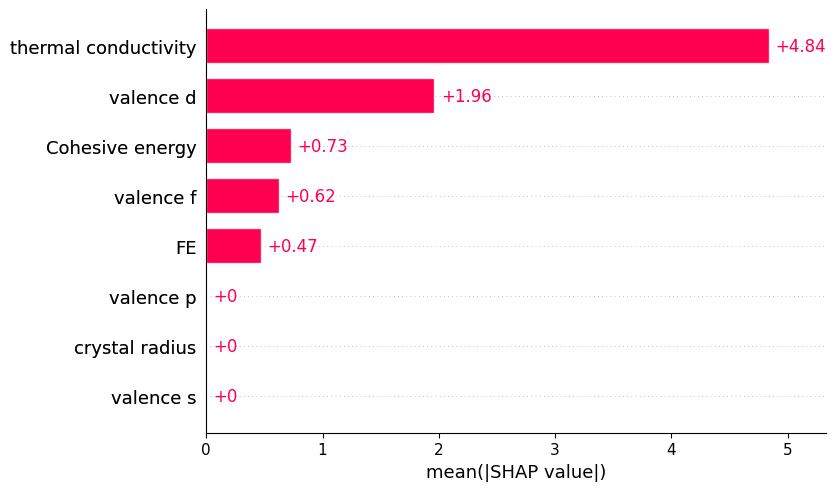

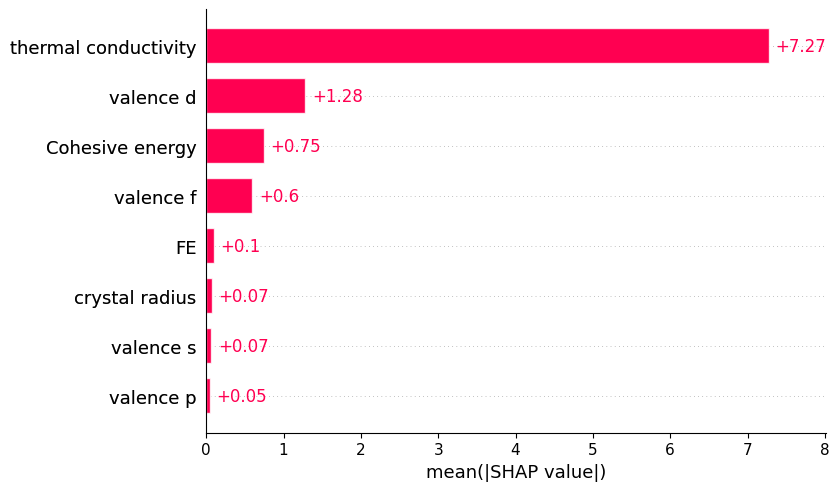

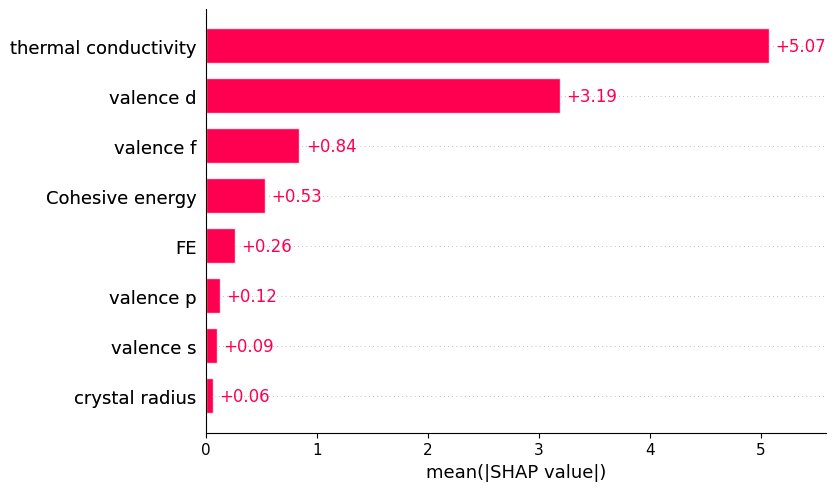

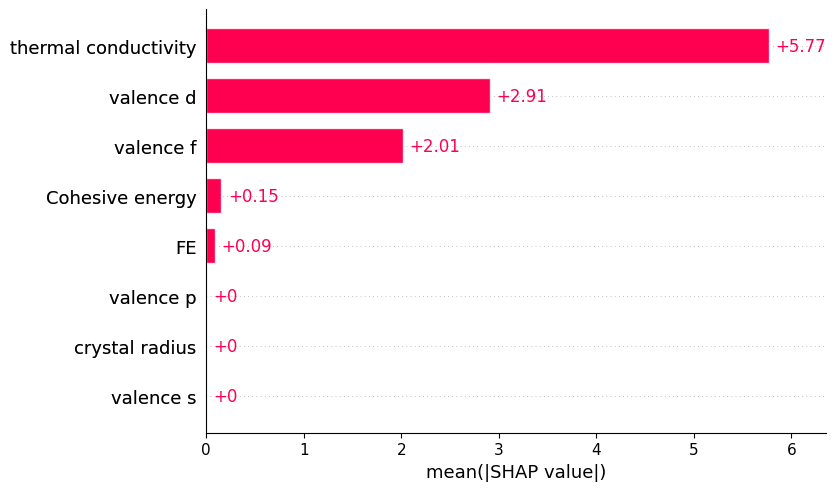

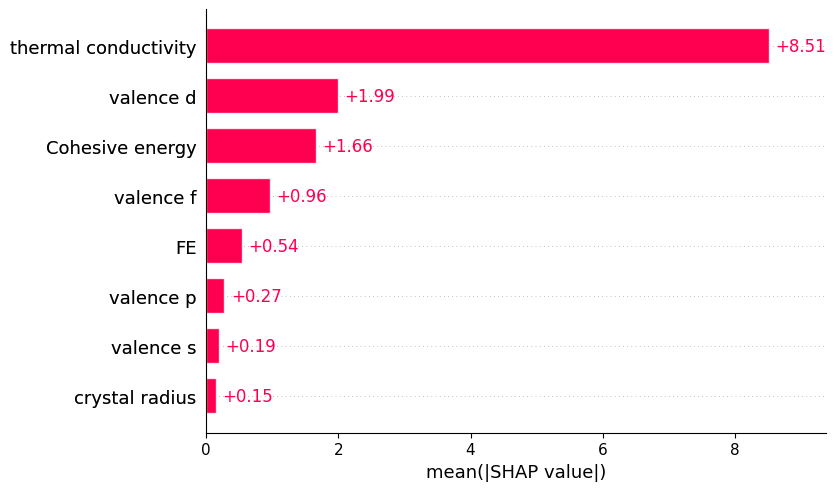

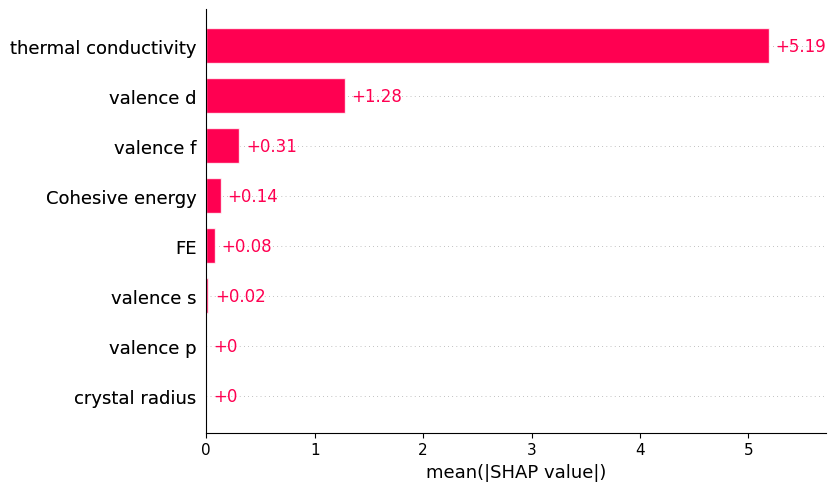

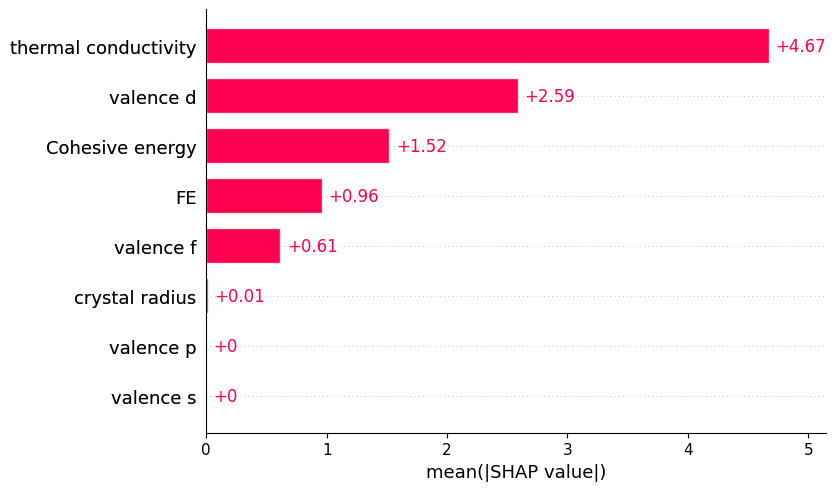

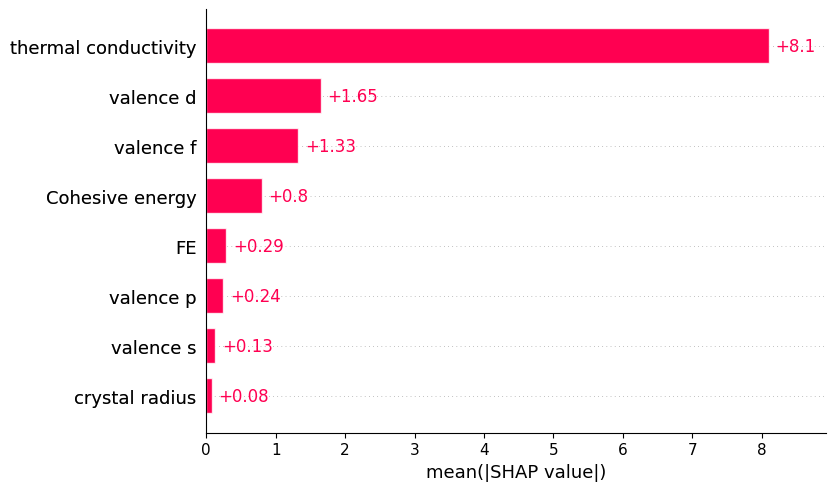

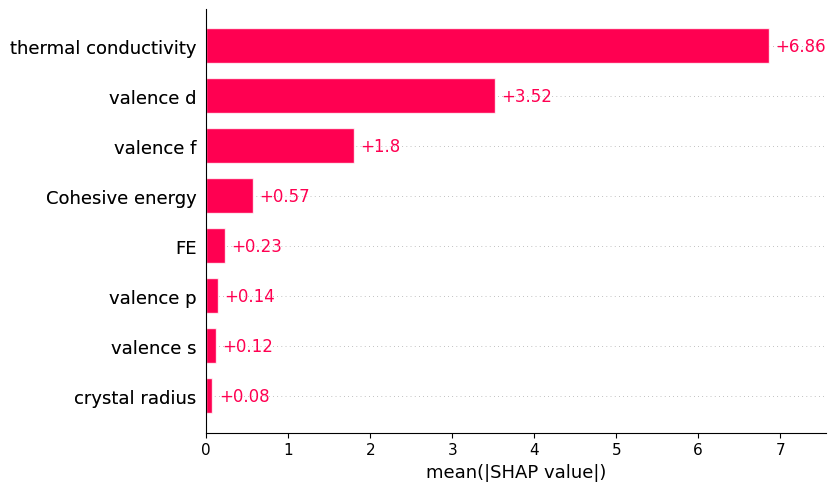

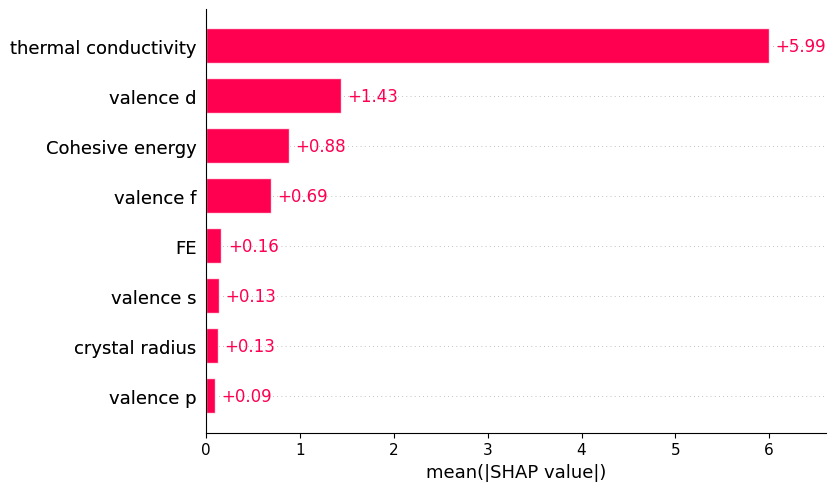

In [ ]:
model_KNN2.plot_SHAP('all')

## 4.IIS ranking

In [ ]:
IIS_data_fitPCA = IISDataAnalysis(results=results_fit,
                           IIS=IIS_fit,
                           models=models_fit,
                           results_csv_name='df_results_fit_PCA_set1.csv',
                           models_joblib_name='models_fit_PCA_set1.joblib',
                           iis_full_csv_name='df_IIS_full_fit_PCA_set1.csv',
                           iis_csv_name='df_IIS_fit_PCA_set1.csv')

In [ ]:
IIS_data_fitPCA.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.141767,0.050014,22.400825,23.216665,-0.019359
RandomForestRegressor,0.152808,0.083682,22.258723,22.813916,0.015083
GradientBoostingRegressor,0.155075,0.085233,22.228726,22.819017,0.022029
XGBRegressor,0.140836,0.061956,22.414705,23.106983,0.026029
SVR,0.133864,0.050967,22.494347,23.237144,0.010298
GaussianProcessRegressor,0.154907,0.078612,22.224477,22.907126,-0.002594
KNeighborsRegressor,0.137318,0.074232,22.453694,22.953727,-0.074125


In [ ]:
IIS_data_fitPCA.show_IIS_values()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.283500,0.525750,0.400000,0.000000,0.543429,0.267000,0.291000,0.788625
RandomForestRegressor,0.761667,0.770000,0.748571,0.577905,0.796923,0.716479,0.725932,0.905714
GradientBoostingRegressor,0.705414,0.802000,0.591000,0.452769,0.743333,0.593391,0.672070,0.853333
XGBRegressor,0.656000,0.796923,0.300000,0.000000,0.461923,0.189000,0.200000,0.905714
SVR,0.712308,0.717143,0.733462,0.725000,0.835000,0.761667,1.000000,0.767059
GaussianProcessRegressor,0.725932,0.737347,0.736000,0.712308,0.835000,0.722381,1.000000,0.776452
KNeighborsRegressor,0.715205,0.737347,0.716479,0.720000,0.835000,0.761667,1.000000,0.764286


In [ ]:
IIS_data_fitPCA.show_IIS_details()

crystal radius          FE  \
DecisionTreeRegressor     Mean Rank                    4.000000    2.666667   
                          Non-Zero Frequency(%)       30.000000   60.000000   
                          IIS                          0.283500    0.525750   
RandomForestRegressor     Mean Rank                    3.600000    3.300000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.761667    0.770000   
GradientBoostingRegressor Mean Rank                    3.222222    2.500000   
                          Non-Zero Frequency(%)       90.000000  100.000000   
                          IIS                          0.705414    0.802000   
XGBRegressor              Mean Rank                    2.750000    2.600000   
                          Non-Zero Frequency(%)       80.000000  100.000000   
                          IIS                          0.656000    0.796923   
SVR                       Mean Rank                    7.800000    7.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.712308    0.717143   
GaussianProcessRegressor  Mean Rank                    5.900000    4.900000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.725932    0.737347   
KNeighborsRegressor       Mean Rank                    7.300000    4.900000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.715205    0.737347   

                                                  valence s   valence p  \
DecisionTreeRegressor     Mean Rank                2.500000         NaN   
                          Non-Zero Frequency(%)   40.000000    0.000000   
                          IIS                      0.400000    0.000000   
RandomForestRegressor     Mean Rank                4.200000    7.875000   
                          Non-Zero Frequency(%)  100.000000   80.000000   
                          IIS                      0.748571    0.577905   
GradientBoostingRegressor Mean Rank                6.000000    6.500000   
                          Non-Zero Frequency(%)   80.000000   60.000000   
                          IIS                      0.591000    0.452769   
XGBRegressor              Mean Rank                3.333333         NaN   
                          Non-Zero Frequency(%)   30.000000    0.000000   
                          IIS                      0.300000    0.000000   
SVR                       Mean Rank                5.200000    6.000000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.733462    0.725000   
GaussianProcessRegressor  Mean Rank                5.000000    7.800000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.736000    0.712308   
KNeighborsRegressor       Mean Rank                7.100000    6.600000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.716479    0.720000   

                                                  valence d   valence f  \
DecisionTreeRegressor     Mean Rank                2.333333    5.000000   
                          Non-Zero Frequency(%)   60.000000   30.000000   
                          IIS                      0.543429    0.267000   
RandomForestRegressor     Mean Rank                2.600000    7.100000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.796923    0.716479   
GradientBoostingRegressor Mean Rank                4.500000    5.750000   
                          Non-Zero Frequency(%)  100.000000

In [ ]:
IIS_data_fitPCA.show_IIS_ranks()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,6,3,4,8,2,7,5,1
RandomForestRegressor,4,3,5,8,2,7,6,1
GradientBoostingRegressor,4,2,7,8,3,6,5,1
XGBRegressor,3,2,5,8,4,7,6,1
SVR,8,7,5,6,2,4,1,3
GaussianProcessRegressor,6,4,5,8,2,7,1,3
KNeighborsRegressor,8,5,7,6,2,4,1,3


In [ ]:
IIS_data_fitPCA.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,1.857,1.069
1,valence d,2.429,0.787
2,thermal conductivity,3.571,2.440
3,FE,3.714,1.799
4,valence s,5.429,1.134
5,crystal radius,5.571,1.988
6,valence f,6.000,1.414
7,valence p,7.429,0.976


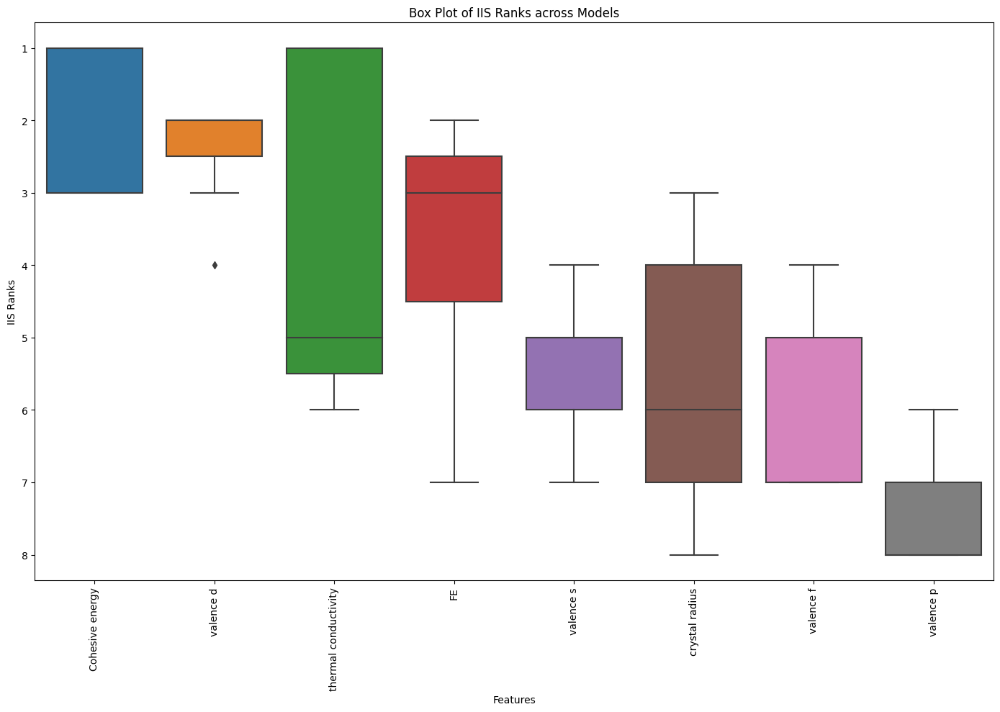

In [ ]:
IIS_data_fitPCA.plot_IIS_mean_rank()

## Option 2: Regularization techniques

Lasso and Ridge Regression

In [ ]:
data_ref = data[0:17]

X_ref = data_ref[['Temp', 'GHSV', 'H2CO']]
y_ref = data_ref['F_STY']

X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.2, random_state=42)

In [ ]:
X_train

,Temp,GHSV,H2CO
11,324,11000,1.8
14,302,15000,1.8
8,300,11000,1.8
13,315,15000,1.8
2,305,3300,2.0
9,317,11000,1.8
16,256,7500,1.8
4,280,3300,1.8
7,277,7500,1.8
10,314,11000,1.8


## 1.fit with reation conditions on reference rows

In [ ]:
# Standardize the features
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_scaled

array([[ 1.17926437,  0.39785685, -0.41666667],
       [ 0.30776667,  1.35566039, -0.41666667],
       [ 0.22853961,  0.39785685, -0.41666667],
       [ 0.82274259,  1.35566039, -0.41666667],
       [ 0.42660727, -1.44591496,  1.75      ],
       [ 0.90196965,  0.39785685, -0.41666667],
       [-1.5144558 , -0.44022124, -0.41666667],
       [-0.56373103, -1.44591496, -0.41666667],
       [-0.68257163, -0.44022124, -0.41666667],
       [ 0.78312905,  0.39785685, -0.41666667],
       [ 1.17926437,  1.35566039, -0.41666667],
       [-1.55406933, -1.44591496,  2.83333333],
       [-1.5144558 , -0.44022124, -0.41666667]])

### Lasso regression

In [ ]:
model_Lasso = Lasso()

param_grid={"alpha": [1e-3, 1e-2, 1e-1, 1, 10, 100]}

tuning = GridSearchCV(estimator=model_Lasso,
                      param_grid = param_grid,
                      cv=5)

tuning.fit(X_train_scaled, y_train)

print("Best parameters:")
print(tuning.best_params_)

Best parameters:
{'alpha': 1}


In [ ]:
model_Lasso3 = Lasso(alpha = tuning.best_params_['alpha'])
model_Lasso3.fit(X_train_scaled, y_train)

# R2
train_r2 = model_Lasso3.score(X_train_scaled, y_train)
test_r2 = model_Lasso3.score(X_test_scaled, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_Lasso3.predict(X_train_scaled)
y_predicted_test = model_Lasso3.predict(X_test_scaled)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_Lasso3, X=X_train_scaled, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)


training R2:0.890
test R2:0.066
training RMSE 4.238
test RMSE: 4.801
mean CV R2: -0.791


### Ridge regression

In [ ]:
model_Ridge = Ridge()

param_grid={"alpha": [1e-3, 1e-2, 1e-1, 1, 10, 100]}

tuning = GridSearchCV(estimator=model_Ridge,
                      param_grid = param_grid,
                      cv=5)

tuning.fit(X_train_scaled, y_train)

print("Best parameters:")
print(tuning.best_params_)

Best parameters:
{'alpha': 1}


In [ ]:
model_Ridge3 = Ridge(alpha = tuning.best_params_['alpha'])
model_Ridge3.fit(X_train_scaled, y_train)

# R2
train_r2 = model_Ridge3.score(X_train_scaled, y_train)
test_r2 = model_Ridge3.score(X_test_scaled, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_Ridge3.predict(X_train_scaled)
y_predicted_test = model_Ridge3.predict(X_test_scaled)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_Ridge3, X=X_train_scaled, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)


training R2:0.893
test R2:0.265
training RMSE 4.180
test RMSE: 4.260
mean CV R2: -2.286


## 2.fit with reaction condition on metal rows, based on models trained in part 1

**input features**

In [ ]:
data_metal = data[17:]
data_metal

X_metal = data_metal[['Temp', 'GHSV', 'H2CO']]
y_metal = data_metal['F_STY']

X_metal

,Temp,GHSV,H2CO
17,257,7500,1.8
18,276,7500,1.8
19,301,11000,1.8
20,315,11000,1.8
21,327,11000,1.8
...,...,...,...
184,299,11000,1.8
185,314,11000,1.8
186,325,11000,1.8
187,325,15000,1.8


In [ ]:
# Standardize the features
scaler = StandardScaler().fit(X_metal)
X_metal_scaled = scaler.transform(X_metal)

In [ ]:
y_pred_lasso = model_Lasso3.predict(X_metal_scaled)
y_pred_ridge = model_Ridge3.predict(X_metal_scaled)

y_pred_ensemble = (y_pred_lasso + y_pred_ridge) / 2

In [ ]:
# target variable
res = y_metal - y_pred_ensemble # <- catalytic descriptors
np.mean(res)

7.153295720379801

In [ ]:
# target variable
res = y_metal - y_pred_ensemble # <- catalytic descriptors
np.mean(res)

7.153295720379802

## 3.Use the residuals as target variable and fit with catalytic descriptors

In [ ]:
# uncorrelated set1!!! without OE, Pauling Electronegativity, specific heat -> 11-3=8 input features

X_metal_des = data_metal[["crystal radius",'FE',
          'valence s','valence p',"valence d",'valence f',
          "thermal conductivity","Cohesive energy"]]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal_des, res, test_size=0.2, random_state=0)

In [ ]:
# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
X_train

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
61,0.69,-0.0413,2,0,6,0,80.2,4.28
97,0.53,-0.5450,2,2,0,0,59.9,3.85
124,1.36,-0.7370,2,0,1,0,13.5,4.47
115,0.77,-0.0130,2,0,7,14,147.0,6.94
186,0.69,-0.4630,2,2,10,0,66.6,3.14
...,...,...,...,...,...,...,...,...
26,0.54,0.0824,2,0,7,0,100.0,4.39
120,0.77,-0.0130,2,0,7,14,147.0,6.94
84,0.69,-0.0413,2,0,6,0,80.2,4.28
134,0.90,-0.1890,1,0,0,0,84.7,1.63


In [ ]:
# initialize an empty dictionary to store the evaluation results
results_fit1 = {} # for models trained with metal rows

# Initialize an empty dictionary to store the mean SHAP values
IIS_fit1 = {}

# initialize an empty dictionary to store models
models_fit1 = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)
model_DT3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_DT3.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_DT3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.400000,100.0,0.905714
0,crystal radius,2.222222,90.0,0.751500
1,FE,3.444444,90.0,0.698806
4,valence d,3.714286,70.0,0.557846
6,thermal conductivity,4.285714,70.0,0.546000
2,valence s,4.500000,40.0,0.341333
5,valence f,3.000000,30.0,0.311000
3,valence p,5.000000,10.0,0.133000


In [ ]:
model_DT3.show_shap_ranks()

{'crystal radius': [2, 1, 2, 2, 1, 2, 4, 5, 1],
 'FE': [4, 3, 6, 3, 3, 3, 5, 1, 3],
 'valence s': [4, 5, 5, 4],
 'valence p': [5],
 'valence d': [3, 6, 3, 4, 4, 2, 4],
 'valence f': [4, 3, 2],
 'thermal conductivity': [6, 5, 4, 4, 3, 3, 5],
 'Cohesive energy': [1, 2, 1, 1, 2, 1, 1, 1, 2, 2]}

In [ ]:
model_DT3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.367963,0.105169,13.126966,20.277941,0.170515
1,1,0.293830,0.399580,15.121754,12.507799,0.178368
2,2,0.338248,0.185154,14.052002,17.031881,0.226982
3,3,0.308802,0.252047,14.489722,15.755583,0.240585
4,4,0.325313,0.104470,14.700752,15.119258,0.246932
5,5,0.268250,0.444952,15.019731,13.308189,0.142333
6,6,0.254075,0.468950,15.625119,10.963748,0.130616
7,7,0.531378,-0.163485,10.737564,24.660403,0.457052
8,8,0.239779,0.592135,15.989741,9.156573,0.230368
9,9,0.244395,0.541875,15.526217,11.050707,0.170841


In [ ]:
model_DT3.show_parameters()

{0: OrderedDict([('max_depth', 6),
              ('max_features', 5),
              ('min_samples_leaf', 7),
              ('min_samples_split', 0.012456546518247541)]),
 1: OrderedDict([('max_depth', 7),
              ('max_features', 8),
              ('min_samples_leaf', 5),
              ('min_samples_split', 0.03233947681442653)]),
 2: OrderedDict([('max_depth', 7),
              ('max_features', 5),
              ('min_samples_leaf', 4),
              ('min_samples_split', 0.01)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 8),
              ('min_samples_leaf', 3),
              ('min_samples_split', 0.1)]),
 4: OrderedDict([('max_depth', 3),
              ('max_features', 8),
              ('min_samples_leaf', 5),
              ('min_samples_split', 0.1)]),
 5: OrderedDict([('max_depth', 5),
              ('max_features', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 6: OrderedDict([('max_depth', 6),
            

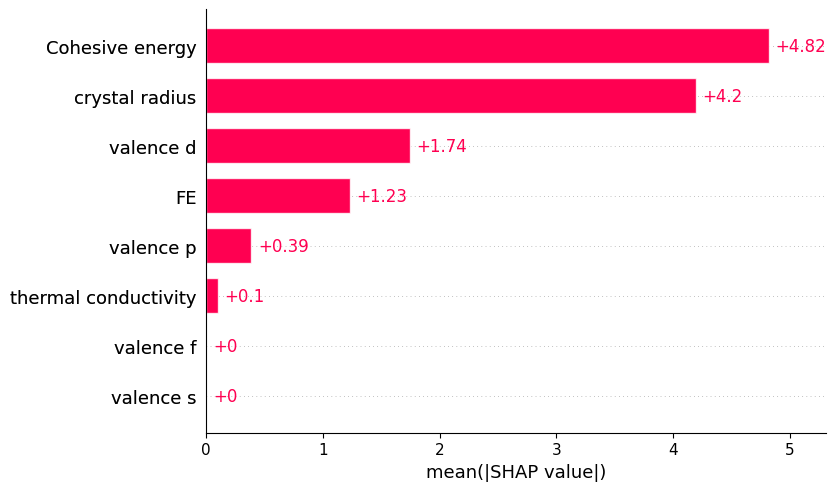

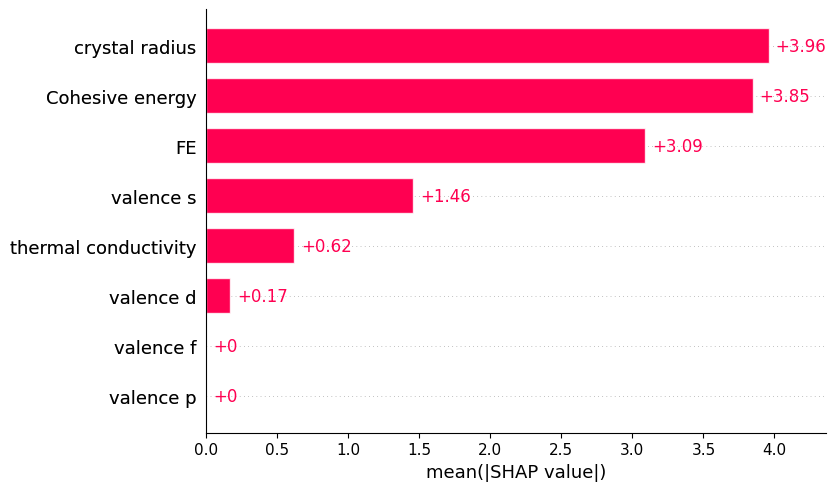

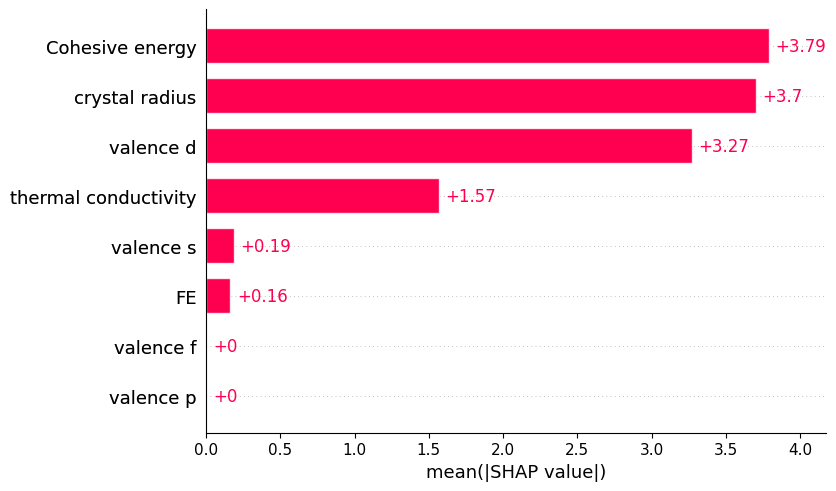

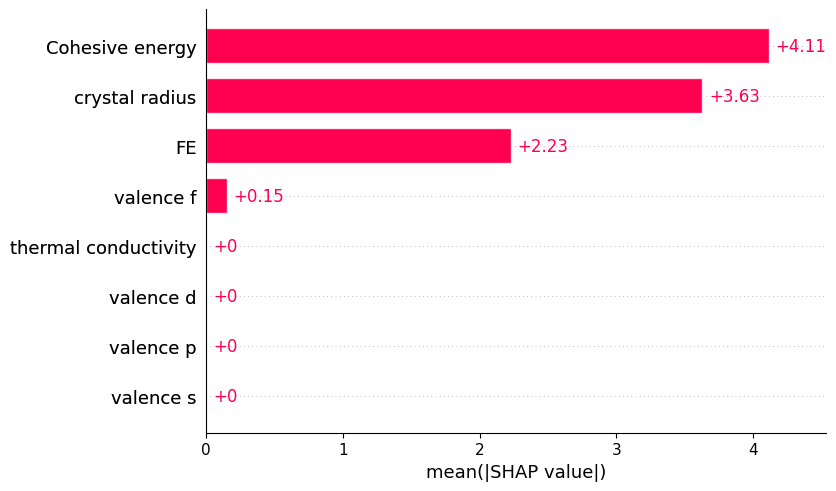

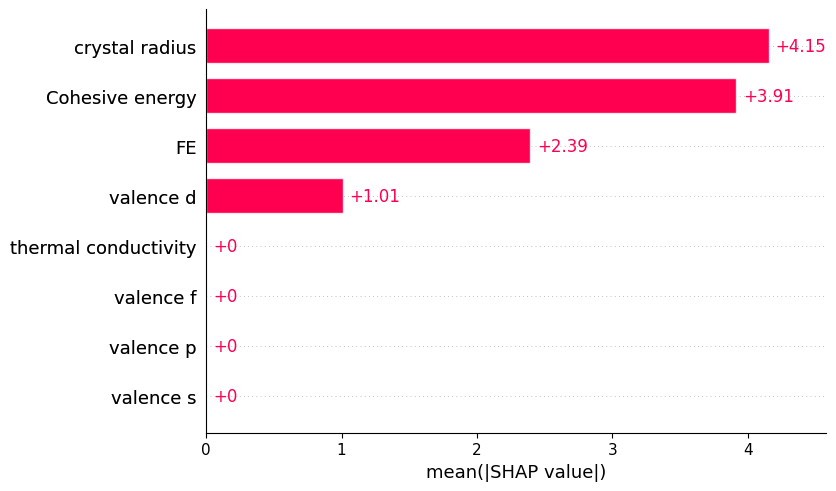

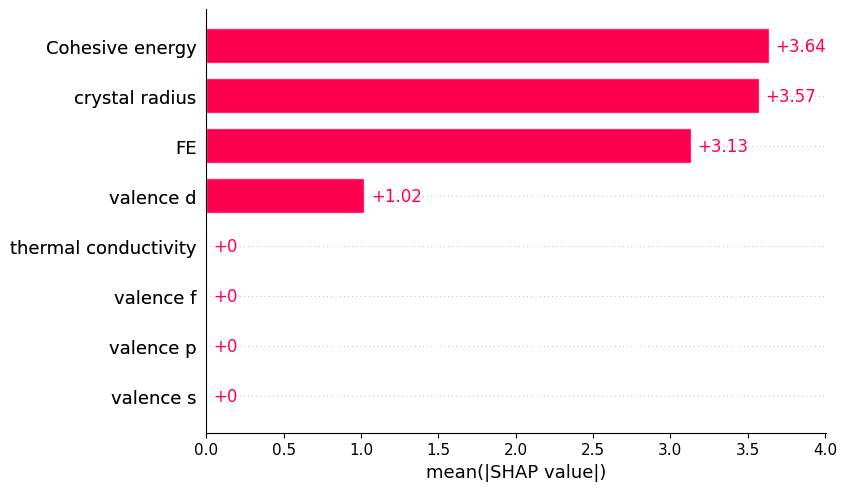

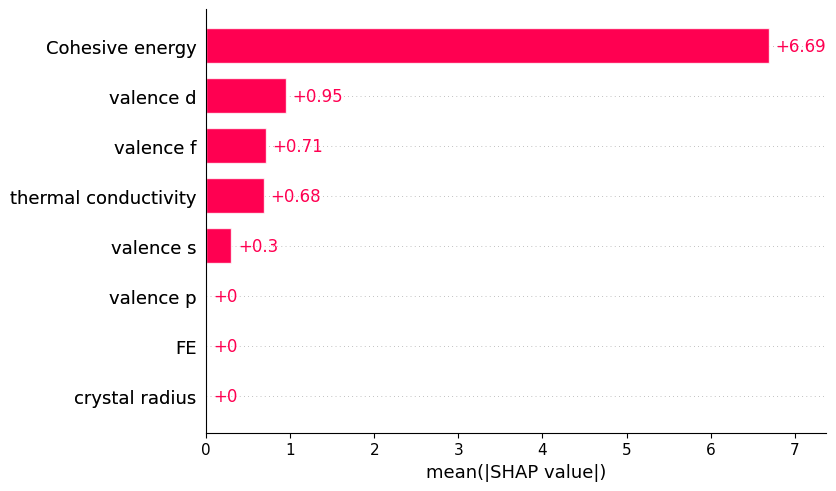

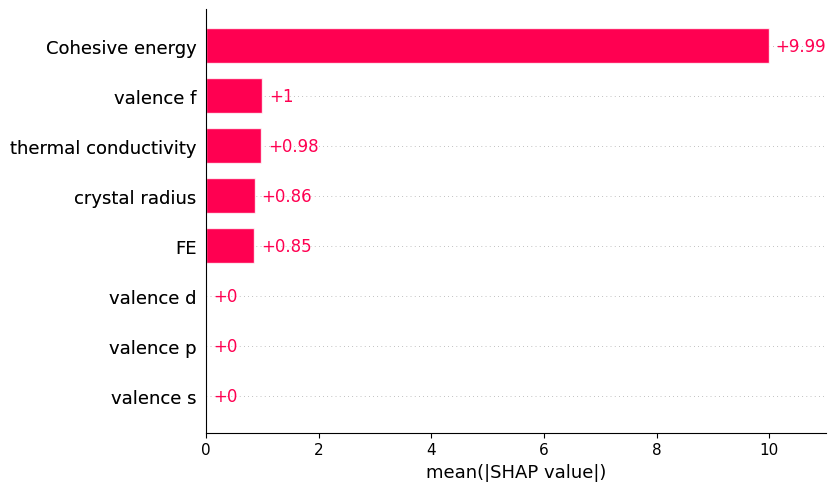

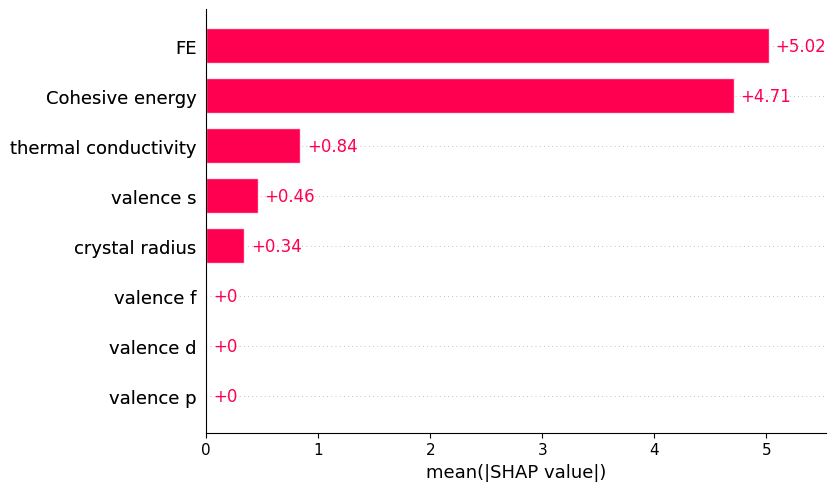

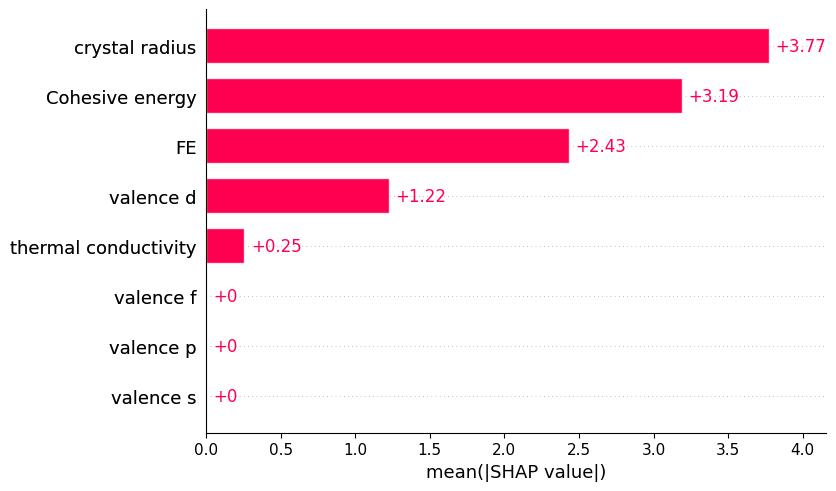

In [ ]:
model_DT3.plot_SHAP("all")

### Random forest

In [ ]:
random_seeds = np.arange(0,10)
model_RF3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_RF3.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished



The objective has been evaluated at this point before.


Random seed 4 finished

Random seed 5 finished



The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
1,FE,2.0,100.0,0.835000
4,valence d,2.2,100.0,0.820000
7,Cohesive energy,2.4,100.0,0.807500
0,crystal radius,3.6,100.0,0.761667
2,valence s,5.3,100.0,0.732264
6,thermal conductivity,5.5,100.0,0.730000
5,valence f,7.3,100.0,0.715205
3,valence p,7.7,100.0,0.712857


In [ ]:
model_RF3.show_shap_ranks()

{'crystal radius': [4, 4, 4, 4, 4, 4, 3, 1, 4, 4],
 'FE': [2, 1, 3, 3, 2, 1, 2, 4, 1, 1],
 'valence s': [3, 6, 5, 6, 6, 6, 5, 6, 5, 5],
 'valence p': [7, 8, 8, 8, 8, 7, 8, 8, 7, 8],
 'valence d': [1, 2, 2, 1, 1, 3, 4, 2, 3, 3],
 'valence f': [8, 7, 7, 7, 7, 8, 7, 7, 8, 7],
 'thermal conductivity': [6, 5, 6, 5, 5, 5, 6, 5, 6, 6],
 'Cohesive energy': [5, 3, 1, 2, 3, 2, 1, 3, 2, 2]}

In [ ]:
model_RF3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.383494,0.123723,12.964689,20.066608,0.249932
1,1,0.283990,0.378996,15.226744,12.720395,0.191880
2,2,0.345650,0.216679,13.973192,16.699162,0.225004
3,3,0.310512,0.265044,14.471783,15.618093,0.256009
4,4,0.324229,0.147125,14.712550,14.754798,0.244936
5,5,0.268877,0.433944,15.013287,13.439507,0.135084
6,6,0.261552,0.524909,15.546608,10.370026,0.144402
7,7,0.528963,-0.171084,10.765197,24.740799,0.461177
8,8,0.260906,0.687131,15.765989,8.019660,0.228197
9,9,0.241761,0.530292,15.553262,11.189532,0.177271


In [ ]:
model_RF3.show_parameters()

{0: OrderedDict([('max_depth', 4),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 1: OrderedDict([('max_depth', 6),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 2: OrderedDict([('max_depth', 7),
              ('max_features', 7),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.07340205006996837)]),
 3: OrderedDict([('max_depth', 7),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 4: OrderedDict([('max_depth', 3),
              ('max_features', 2),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.014955547755208663)]),
 5: OrderedDict([('max_depth', 4),
              ('max_features', 6),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 6: OrderedDict([('max_depth', 10),
          

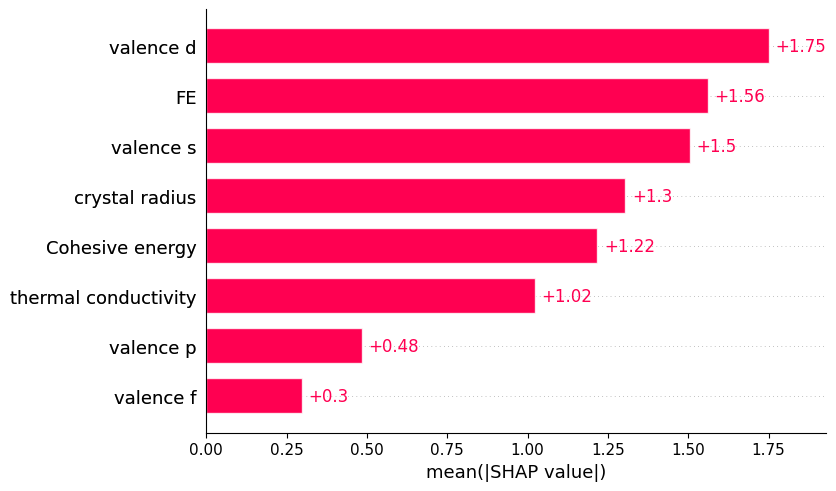

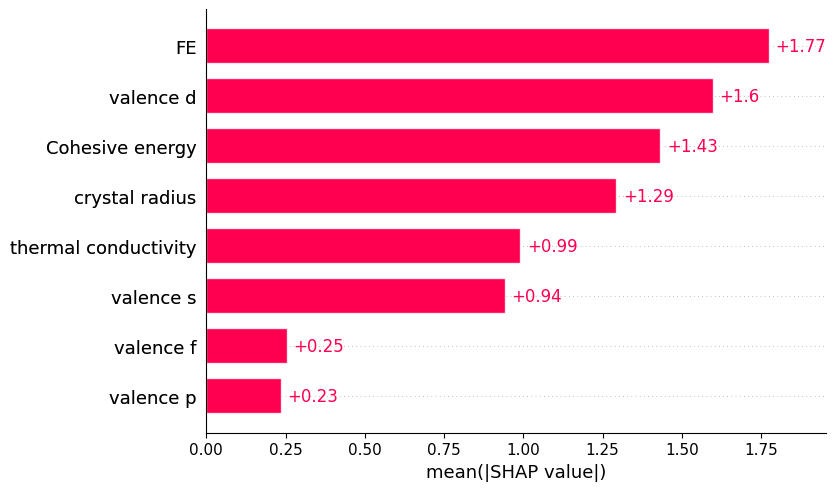

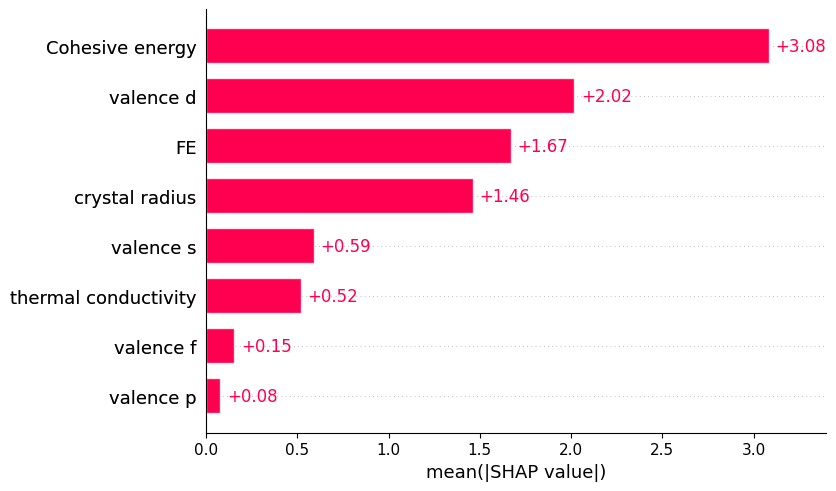

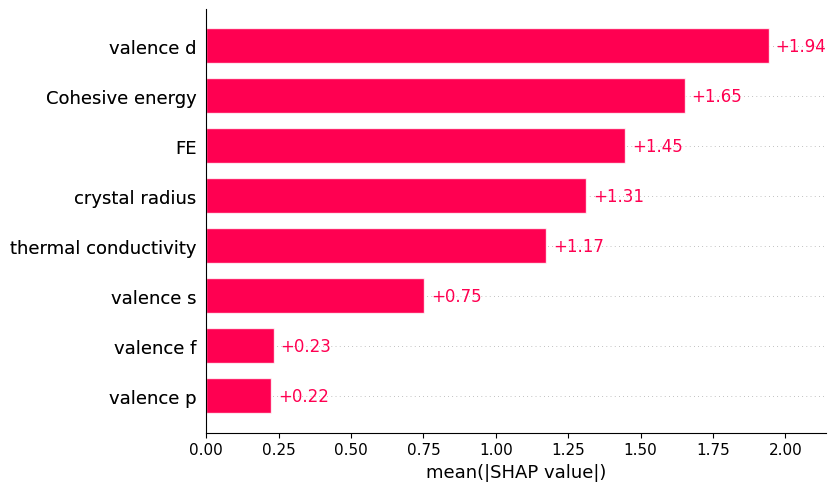

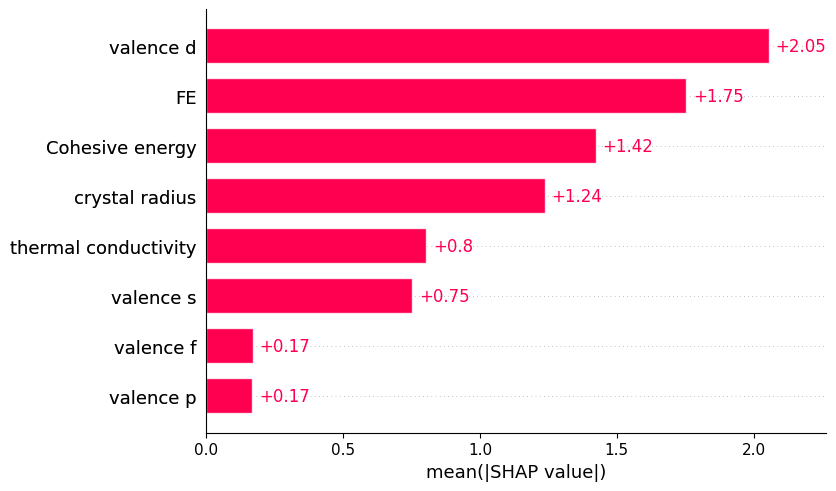

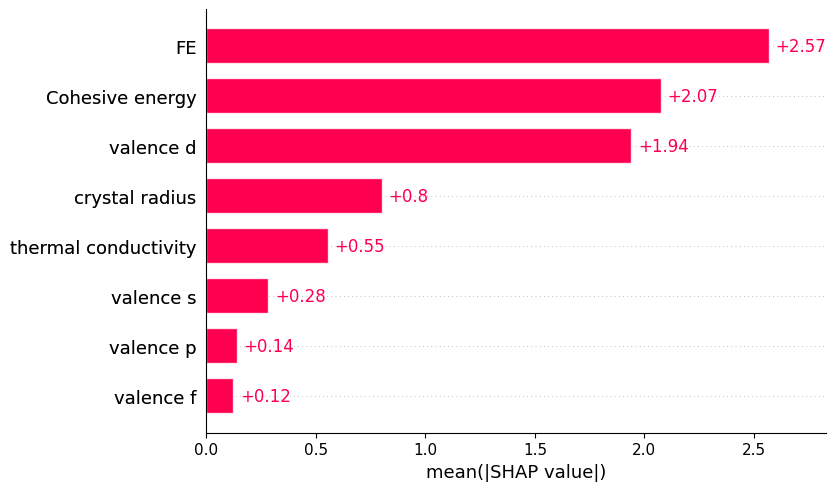

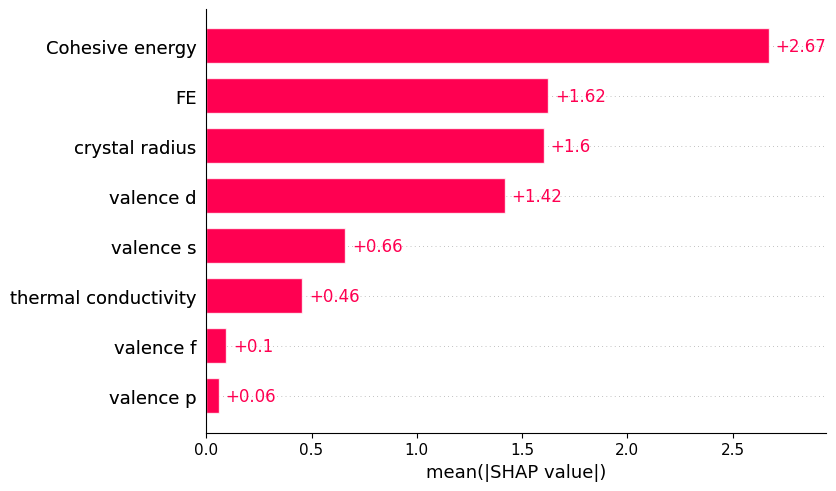

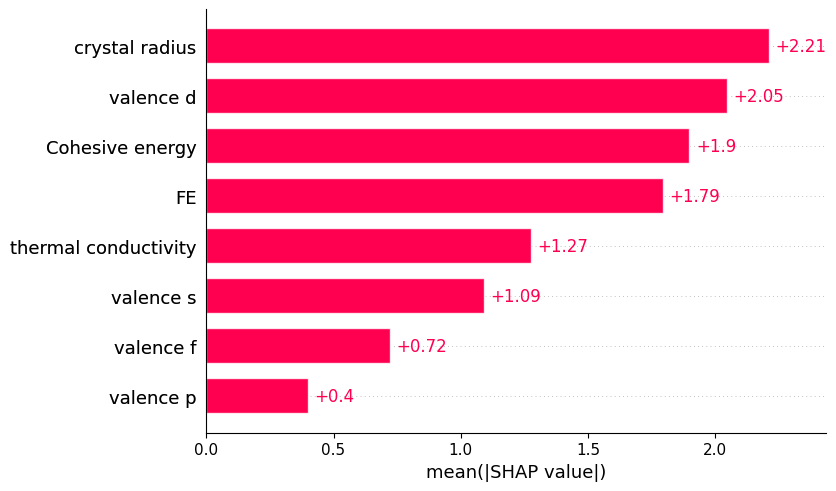

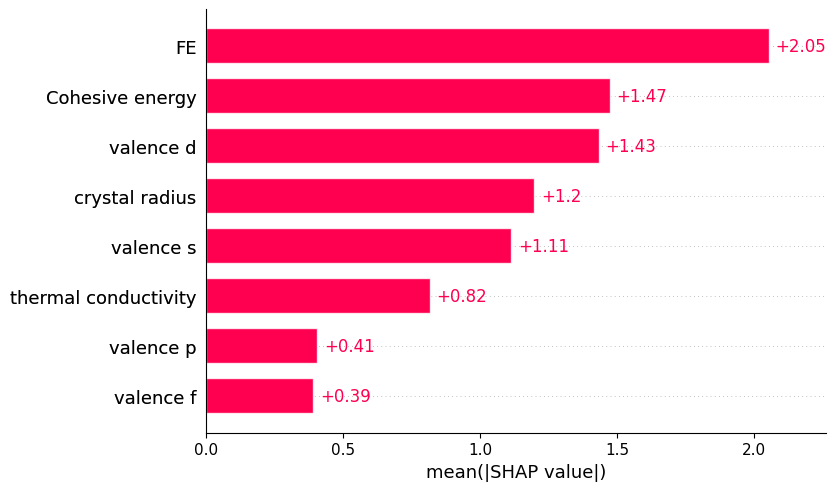

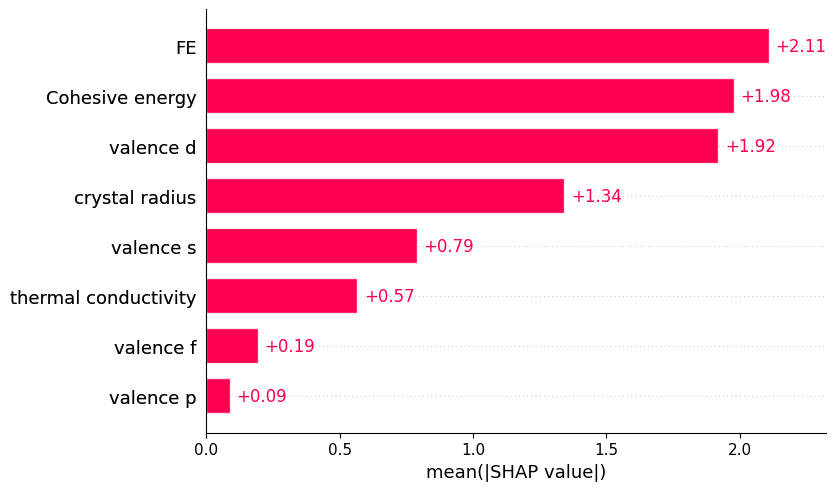

In [ ]:
model_RF3.plot_SHAP('all')

### Gradient boost

In [ ]:
random_seeds = np.arange(0,10)
model_GB3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_GB3.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
7,Cohesive energy,1.900,100.0,0.843684
1,FE,2.400,100.0,0.807500
4,valence d,3.000,100.0,0.780000
0,crystal radius,3.400,100.0,0.767059
6,thermal conductivity,5.100,100.0,0.734706
2,valence s,6.125,80.0,0.589878
5,valence f,6.250,80.0,0.588800
3,valence p,7.625,80.0,0.579279


In [ ]:
model_GB3.show_shap_ranks()

{'crystal radius': [4, 2, 3, 2, 3, 4, 4, 4, 4, 4],
 'FE': [1, 3, 4, 4, 2, 2, 3, 2, 2, 1],
 'valence s': [4, 7, 7, 6, 5, 7, 7, 6],
 'valence p': [7, 8, 8, 7, 8, 8, 8, 7],
 'valence d': [3, 8, 1, 6, 1, 1, 2, 3, 3, 2],
 'valence f': [6, 6, 3, 8, 7, 6, 6, 8],
 'thermal conductivity': [5, 5, 5, 5, 5, 6, 5, 5, 5, 5],
 'Cohesive energy': [2, 1, 2, 1, 4, 3, 1, 1, 1, 3]}

In [ ]:
model_GB3.show_parameters()

{0: OrderedDict([('learning_rate', 0.10858715203375467),
              ('max_depth', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 128)]),
 1: OrderedDict([('learning_rate', 0.019285810056855045),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 8),
              ('n_estimators', 115)]),
 2: OrderedDict([('learning_rate', 0.01901248017627054),
              ('max_depth', 10),
              ('min_samples_leaf', 5),
              ('min_samples_split', 7),
              ('n_estimators', 200)]),
 3: OrderedDict([('learning_rate', 0.06660008434118182),
              ('max_depth', 4),
              ('min_samples_leaf', 10),
              ('min_samples_split', 10),
              ('n_estimators', 200)]),
 4: OrderedDict([('learning_rate', 0.023676100002445306),
              ('max_depth', 10),
              ('min_samples_leaf', 9),
              ('min_samples_split', 1

In [ ]:
model_GB3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.391748,0.131941,12.877600,19.972291,0.266530
1,1,0.297797,0.408443,15.079219,12.415144,0.213142
2,2,0.349021,0.229252,13.937152,16.564602,0.234099
3,3,0.310679,0.279042,14.470029,15.468639,0.250152
4,4,0.342354,0.156005,14.513912,14.677777,0.242413
5,5,0.267243,0.435342,15.030062,13.422904,0.153980
6,6,0.264553,0.520022,15.514986,10.423216,0.158682
7,7,0.530246,-0.168003,10.750517,24.708229,0.461227
8,8,0.261623,0.695584,15.758347,7.910584,0.229736
9,9,0.245611,0.485682,15.513722,11.708840,0.183087


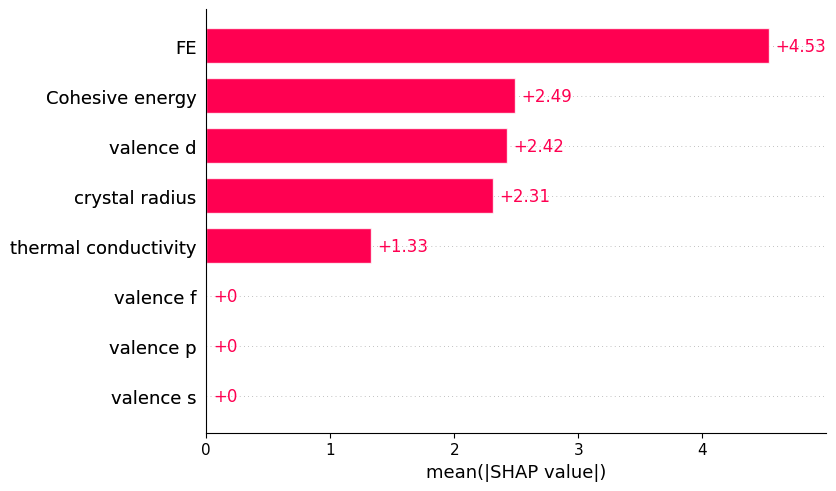

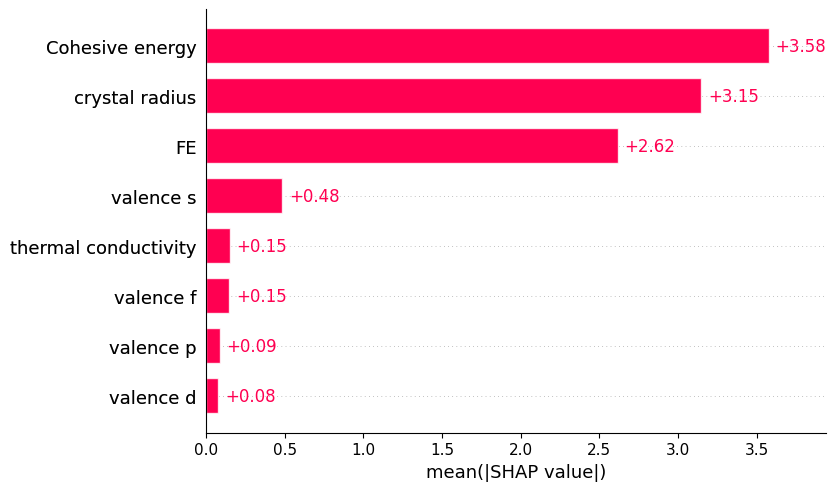

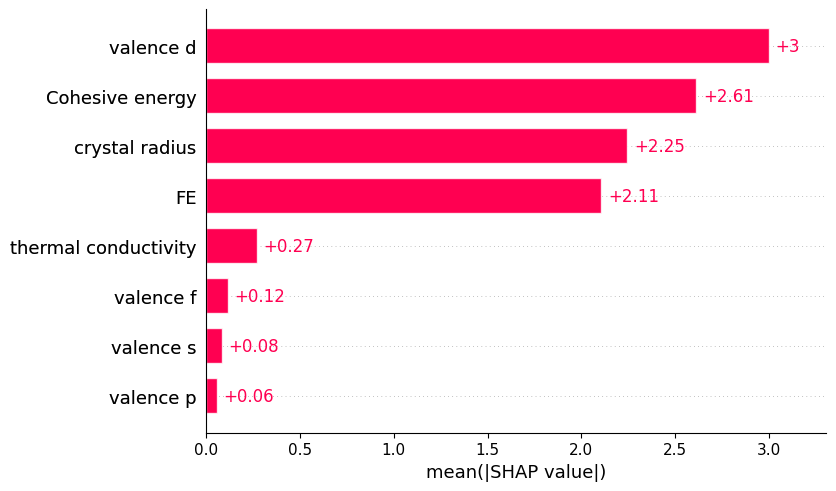

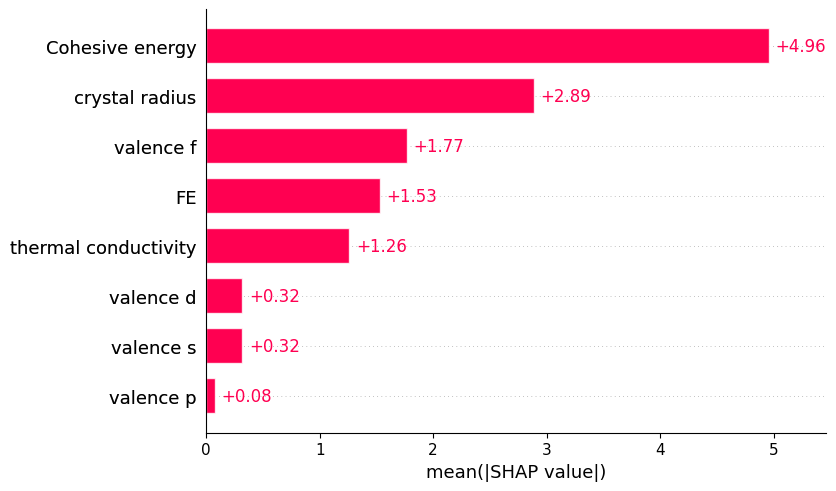

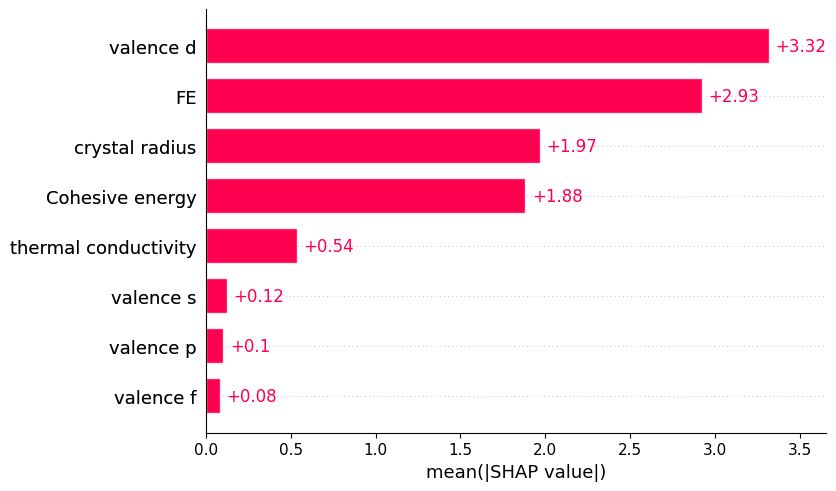

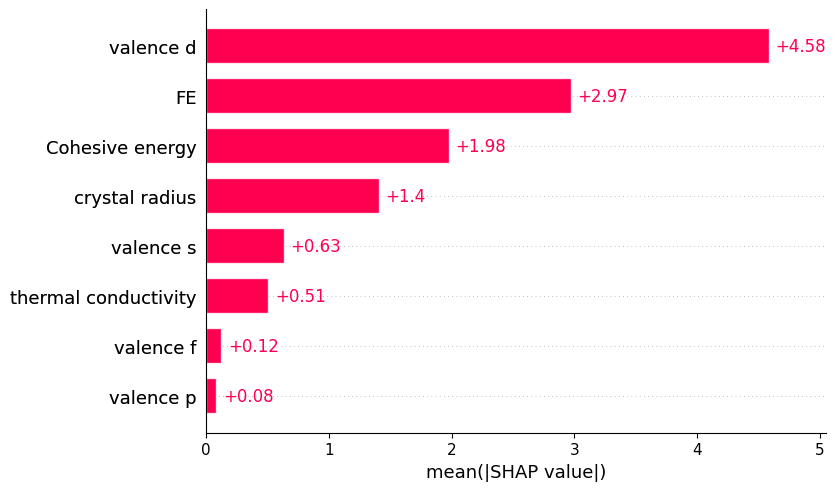

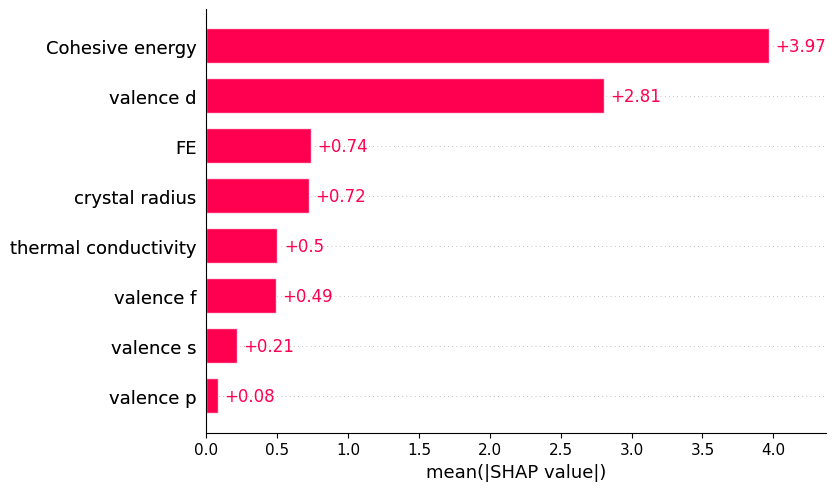

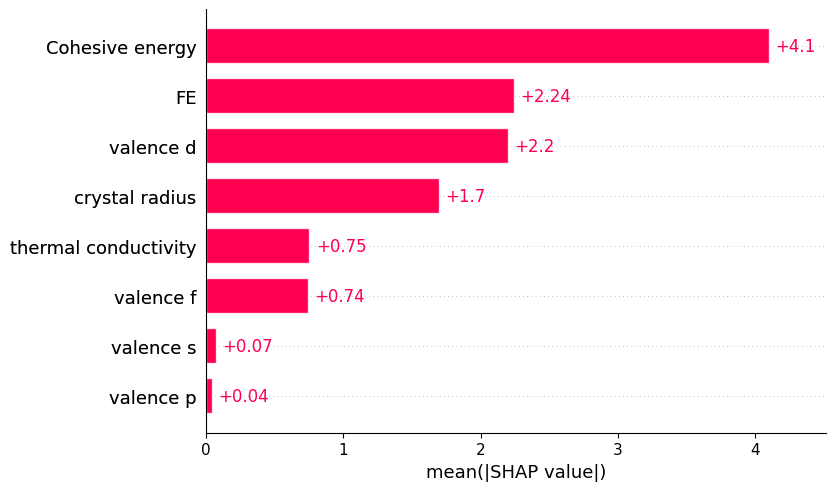

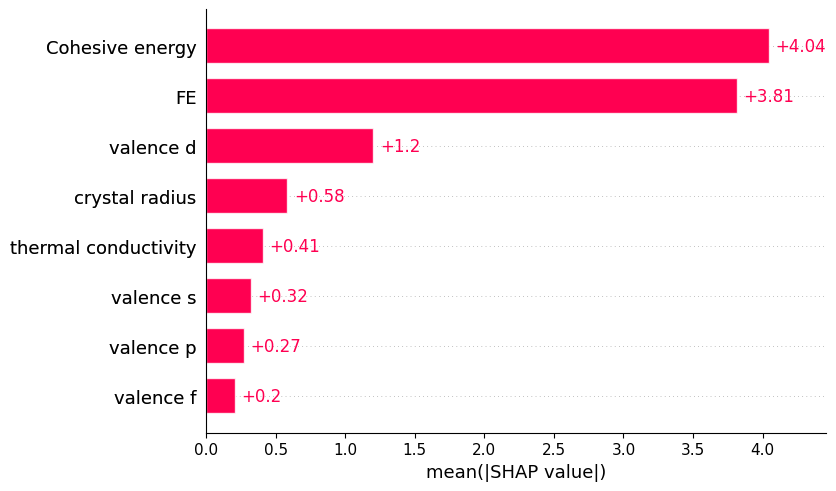

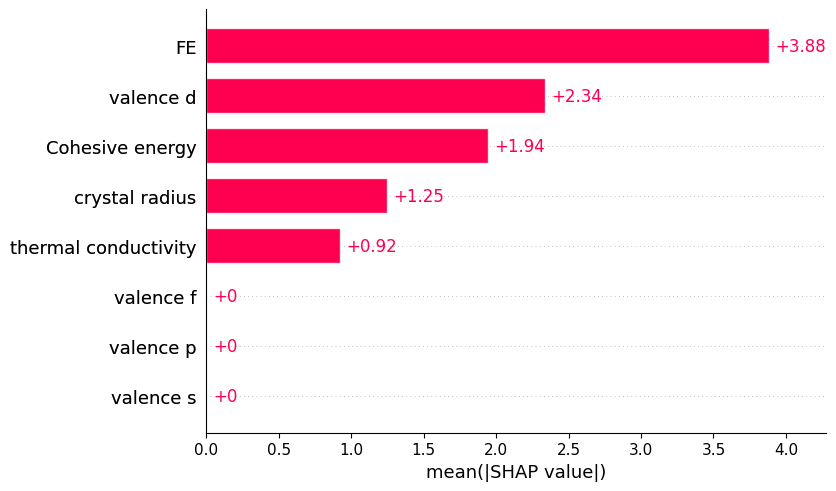

In [ ]:
model_GB3.plot_SHAP('all')

### XGBoost

In [ ]:
random_seeds = np.arange(0,10)
model_XGB3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_XGB3.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
1,FE,1.100000,100.0,0.970000
7,Cohesive energy,2.300000,100.0,0.813478
0,crystal radius,3.300000,100.0,0.770000
4,valence d,3.300000,100.0,0.770000
6,thermal conductivity,5.375000,80.0,0.597395
5,valence f,5.600000,50.0,0.393929
2,valence s,6.666667,30.0,0.250500
3,valence p,7.000000,10.0,0.114143


In [ ]:
model_XGB3.show_shap_ranks()

{'crystal radius': [4, 3, 3, 4, 4, 2, 4, 2, 3, 4],
 'FE': [1, 1, 1, 2, 1, 1, 1, 1, 1, 1],
 'valence s': [7, 7, 6],
 'valence p': [7],
 'valence d': [3, 4, 4, 3, 2, 4, 3, 4, 4, 2],
 'valence f': [6, 6, 5, 6, 5],
 'thermal conductivity': [5, 5, 6, 5, 5, 5, 7, 5],
 'Cohesive energy': [2, 2, 2, 1, 3, 3, 2, 3, 2, 3]}

In [ ]:
model_XGB3.show_parameters()

{0: OrderedDict([('learning_rate', 0.03926223946767446),
              ('max_depth', 2),
              ('n_estimators', 85),
              ('reg_alpha', 4.2395332111960095e-05),
              ('reg_lambda', 1.527157962097321e-05)]),
 1: OrderedDict([('learning_rate', 0.23282903088973725),
              ('max_depth', 10),
              ('n_estimators', 100),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 100.0)]),
 2: OrderedDict([('learning_rate', 0.09547594887839433),
              ('max_depth', 7),
              ('n_estimators', 179),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 100.0)]),
 3: OrderedDict([('learning_rate', 1.0),
              ('max_depth', 1),
              ('n_estimators', 161),
              ('reg_alpha', 4.5092580241413654e-05),
              ('reg_lambda', 100.0)]),
 4: OrderedDict([('learning_rate', 0.0862655310470791),
              ('max_depth', 1),
              ('n_estimators', 95),
              ('reg_alpha', 1e-06),
  

In [ ]:
model_XGB3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.382560,0.130509,12.974499,19.988764,0.254117
1,1,0.298115,0.415409,15.075808,12.341824,0.205636
2,2,0.343474,0.219766,13.996402,16.666225,0.229981
3,3,0.308753,0.269282,14.490229,15.572997,0.248828
4,4,0.331343,0.142173,14.634908,14.797569,0.260839
5,5,0.267474,0.441091,15.027694,13.354397,0.147891
6,6,0.254000,0.446201,15.625899,11.196114,0.166282
7,7,0.514560,-0.119514,10.928535,24.189918,0.455033
8,8,0.257321,0.705101,15.804176,7.785949,0.233431
9,9,0.252113,0.516362,15.446719,11.354239,0.190307


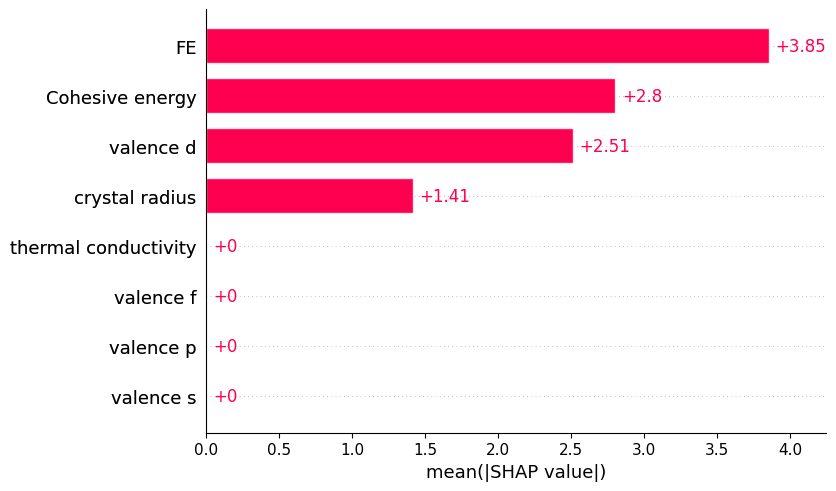

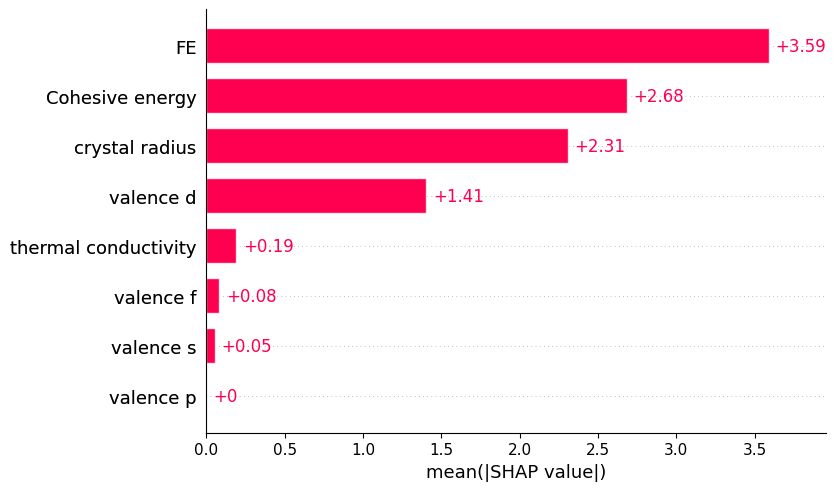

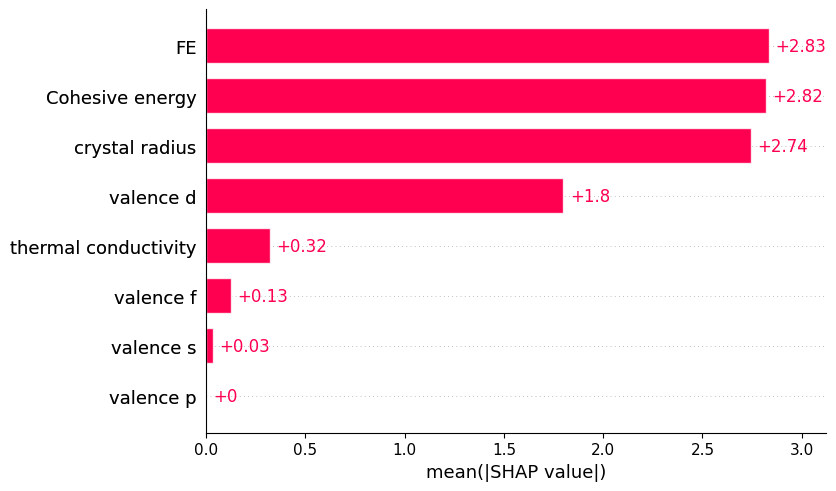

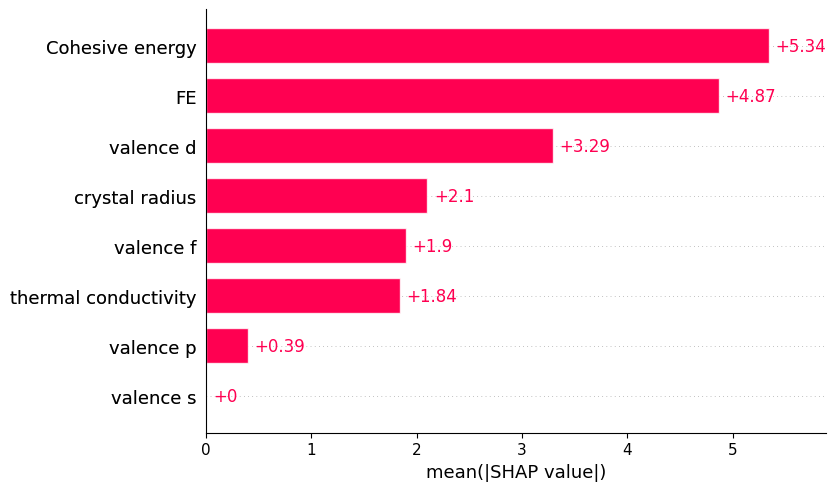

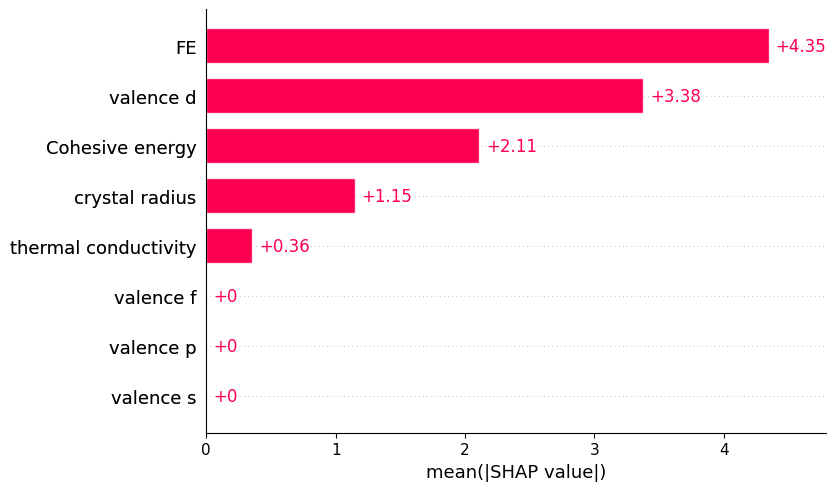

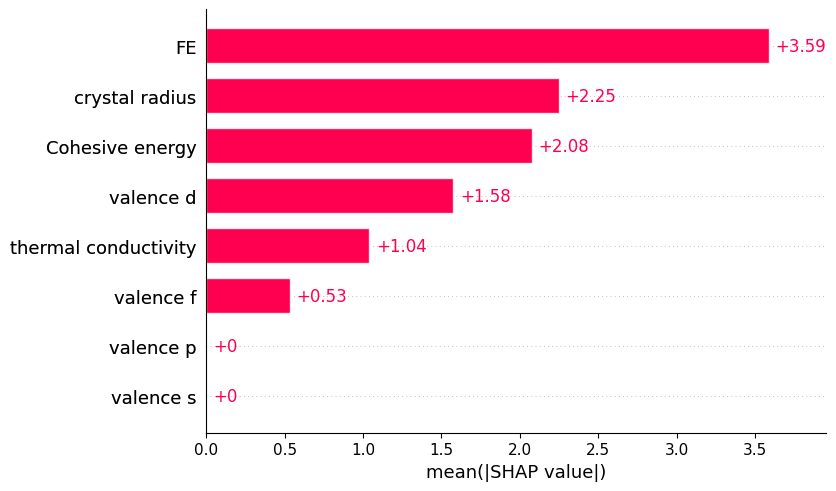

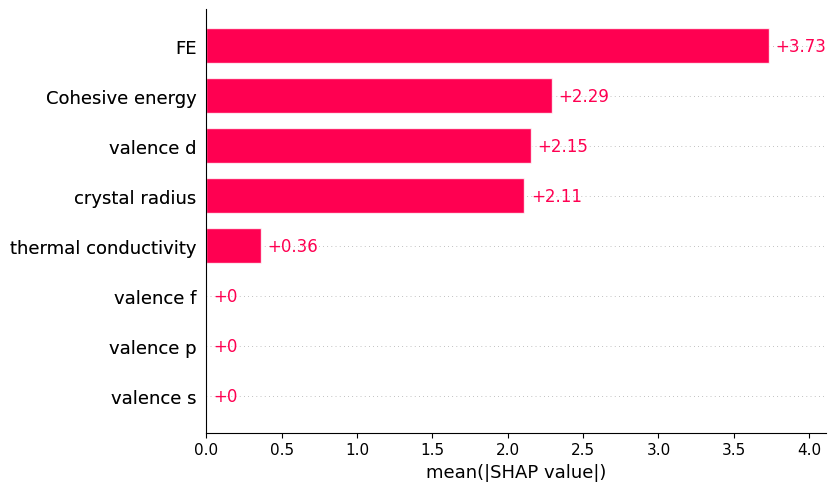

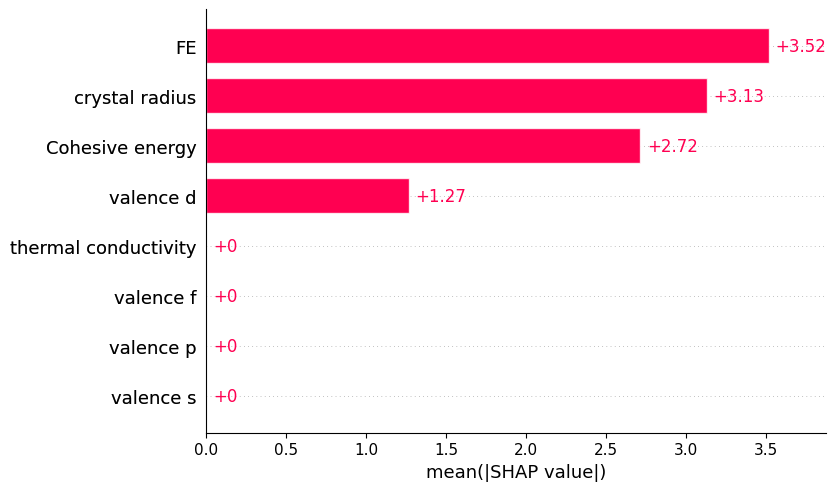

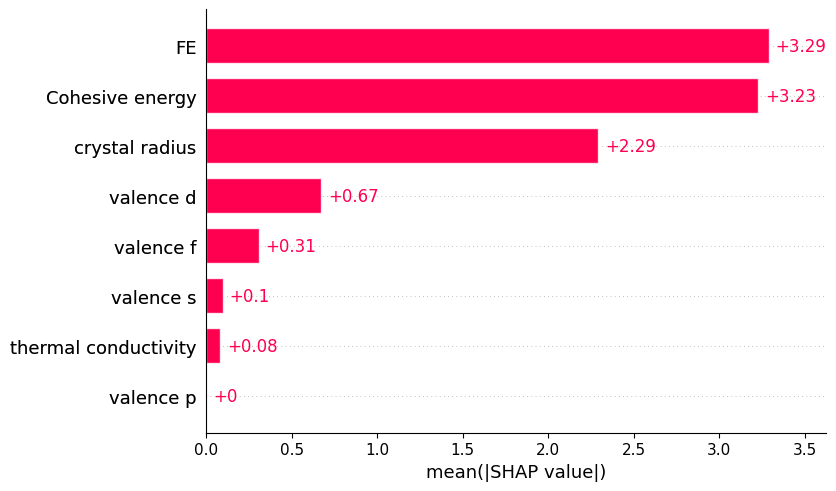

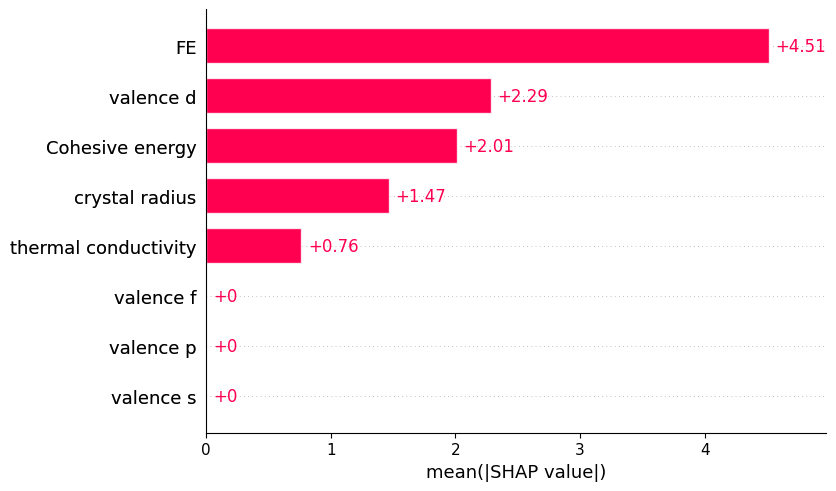

In [ ]:
model_XGB3.plot_SHAP('all')

### Support vector regression

In [ ]:
random_seeds = np.arange(0,10)
model_SVR3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, SVR, param_space_SVR, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_SVR3.evaluate_model()

Exact explainer: 138it [00:36,  3.01it/s]


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:30,  2.78it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



Exact explainer: 138it [00:33,  2.84it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



Exact explainer: 138it [00:30,  2.74it/s]


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:29,  3.16it/s]


Random seed 6 finished



Exact explainer: 138it [00:29,  3.13it/s]


Random seed 7 finished



Exact explainer: 138it [00:33,  2.68it/s]


Random seed 8 finished



Exact explainer: 138it [00:33,  2.90it/s]

Random seed 9 finished



In [ ]:
model_SVR3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.0,100.0,0.835000
7,Cohesive energy,3.0,100.0,0.780000
5,valence f,4.0,100.0,0.752500
2,valence s,5.5,100.0,0.730000
3,valence p,5.5,100.0,0.730000
1,FE,7.0,100.0,0.717143
0,crystal radius,8.0,100.0,0.711250


In [ ]:
model_SVR3.show_shap_ranks()

{'crystal radius': [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
 'FE': [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 'valence s': [6, 5, 5, 5, 6, 6, 6, 5, 6, 5],
 'valence p': [5, 6, 6, 6, 5, 5, 5, 6, 5, 6],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 3, 3, 3, 3, 3, 3, 3]}

In [ ]:
model_SVR3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.350472,0.173190,13.307371,19.491986,0.204214
1,1,0.272361,0.394802,15.349900,12.557463,0.250140
2,2,0.313382,0.222629,14.313571,16.635621,0.249803
3,3,0.288966,0.305297,14.696157,15.184371,0.213198
4,4,0.317527,0.168564,14.785329,14.568169,0.222983
5,5,0.241010,0.529976,15.296736,12.246550,0.148408
6,6,0.246898,0.482304,15.700108,10.825020,0.179338
7,7,0.459069,-0.073254,11.536265,23.684868,0.424132
8,8,0.226729,0.629192,16.126395,8.730706,0.226118
9,9,0.206052,0.439400,15.915287,12.224314,0.169160


In [ ]:
model_SVR3.show_parameters()

{0: OrderedDict([('C', 18.7025327428219),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 9.515802700196888),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 1000.0),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 1000.0),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 1000.0),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 20.484708641903154),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 22.064440676302826),
              ('epsilon', 0.18219868070290207),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 7: OrderedDict

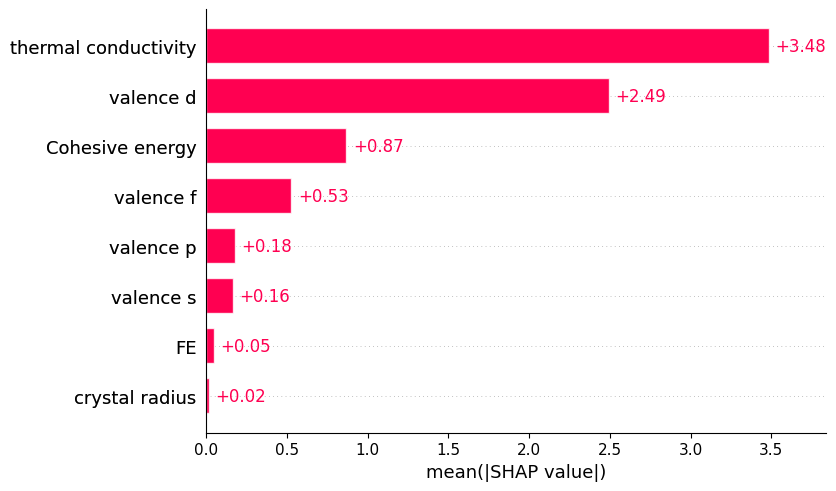

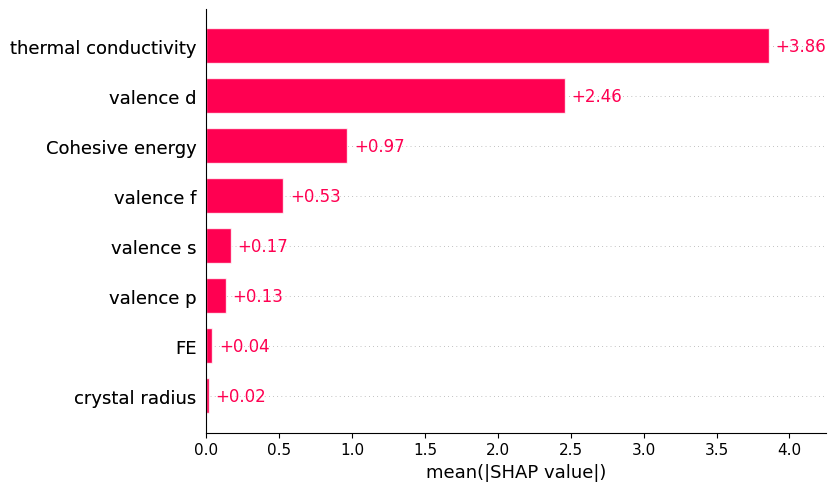

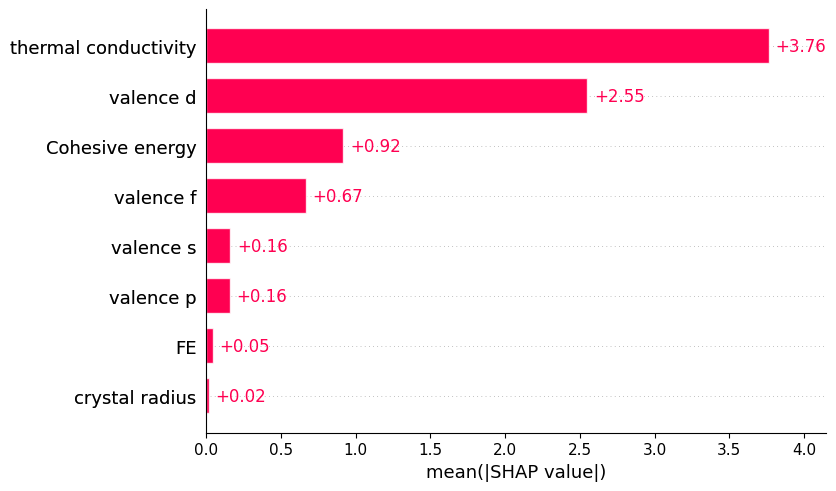

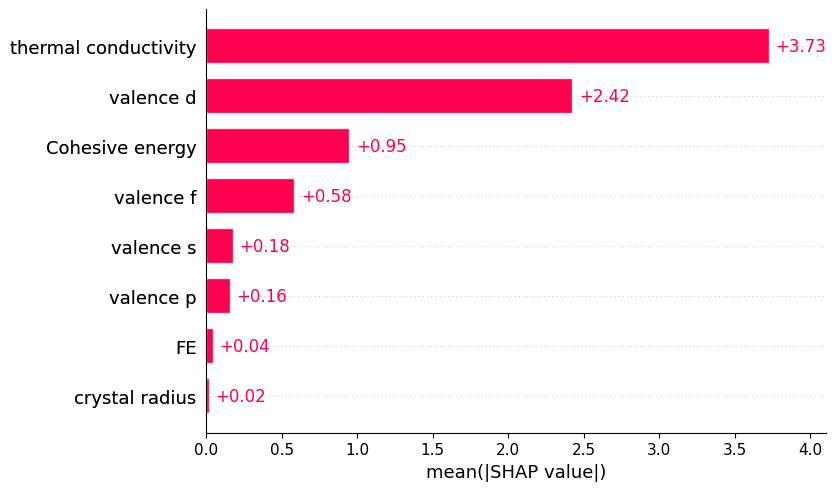

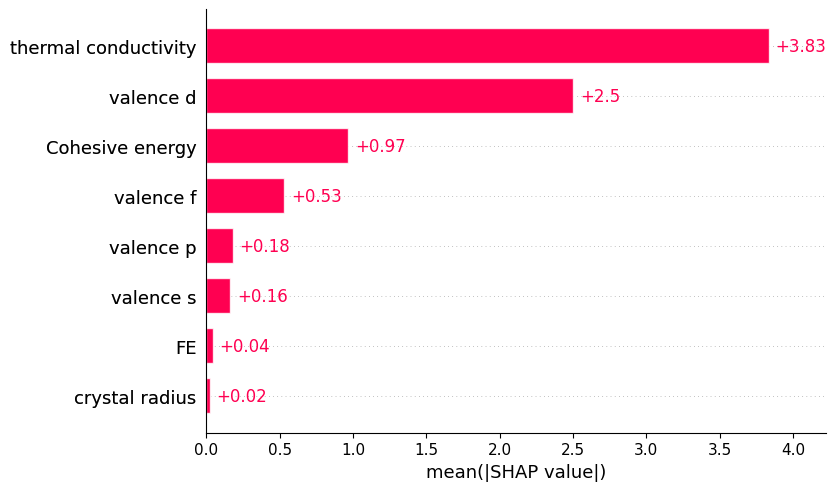

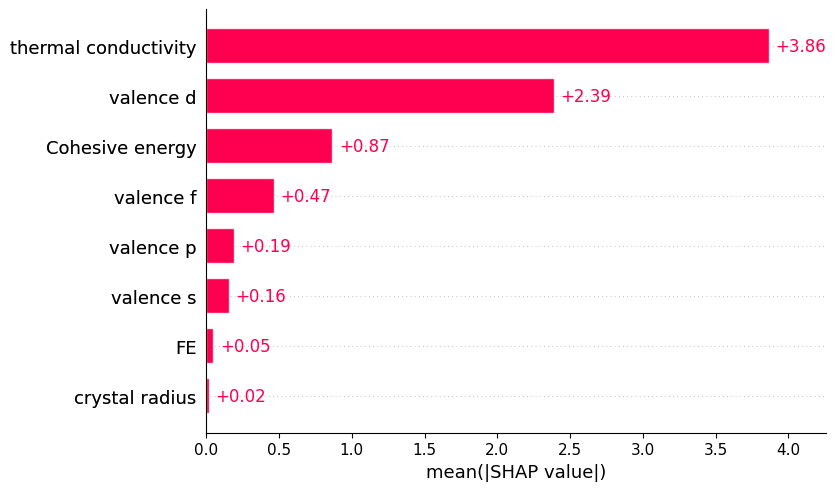

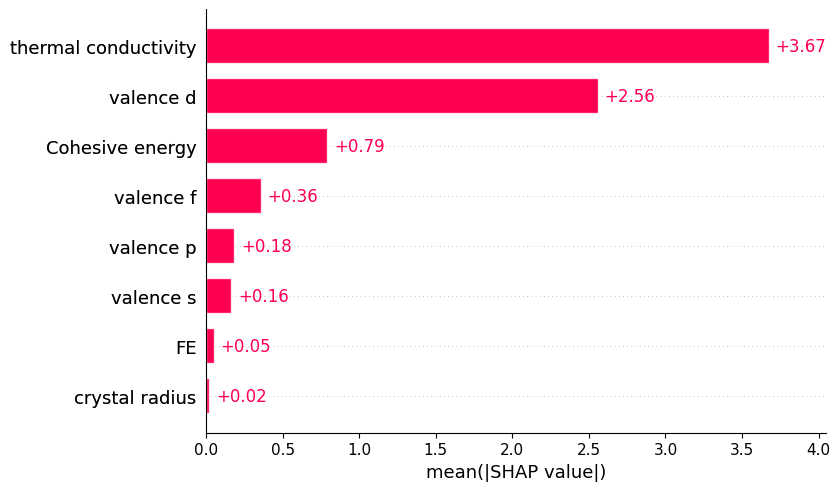

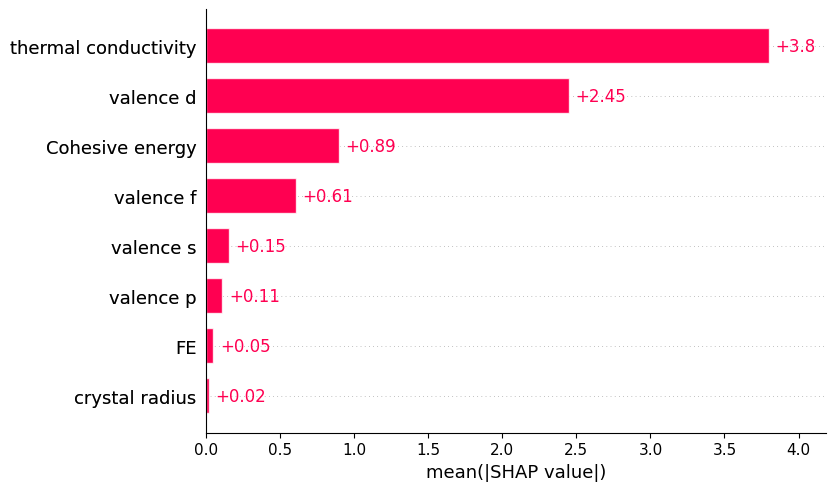

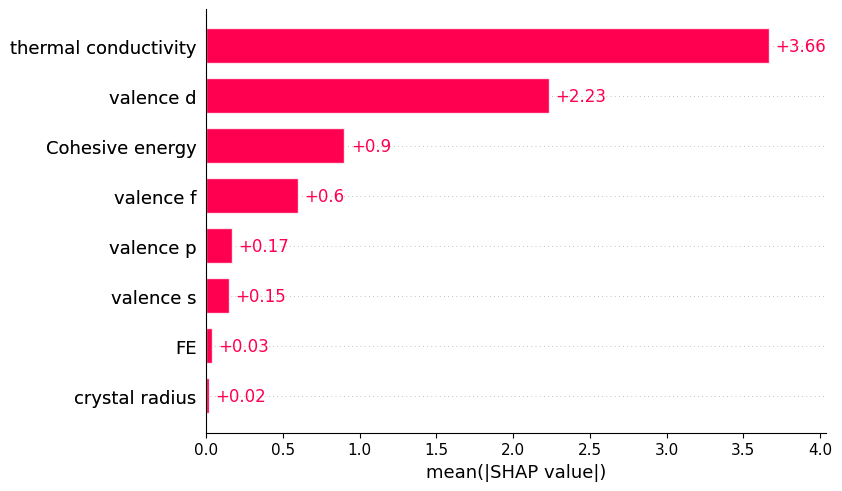

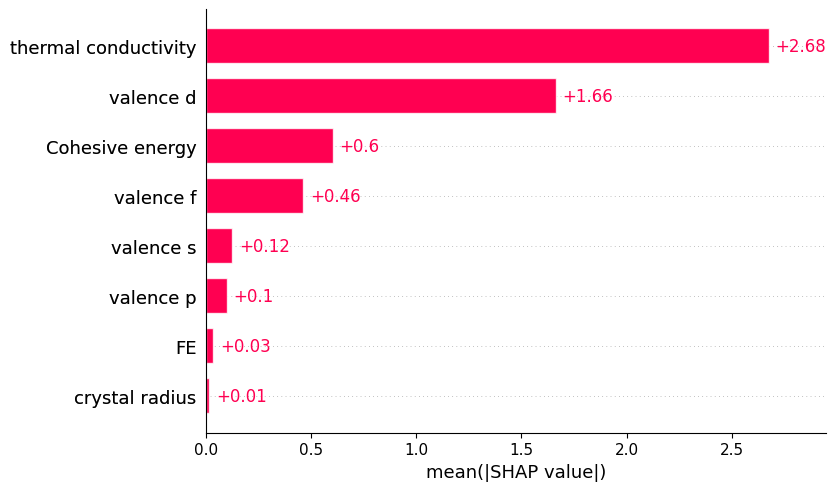

In [ ]:
model_SVR3.plot_SHAP('all')

### Gaussian process

In [ ]:
random_seeds = np.arange(0,10)
kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_fit1, IIS_fit1, models_fit1)
model_GP3.evaluate_model()

The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
Exact explainer: 138it [00:50,  2.17it/s]


Random seed 0 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 1 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified 

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 4 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the spec

Random seed 5 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to 

Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
Exact explainer: 138it [00:49,  2.18it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to t

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 9 finished



In [ ]:
model_GP3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.3,100.0,0.813478
7,Cohesive energy,2.7,100.0,0.792222
1,FE,4.3,100.0,0.746744
0,crystal radius,5.0,100.0,0.736000
2,valence s,5.8,100.0,0.726897
5,valence f,7.0,100.0,0.717143
3,valence p,7.9,100.0,0.711772


In [ ]:
model_GP3.show_shap_ranks()

{'crystal radius': [5, 5, 5, 5, 5, 4, 4, 7, 5, 5],
 'FE': [4, 4, 4, 4, 4, 5, 5, 5, 4, 4],
 'valence s': [6, 6, 6, 6, 6, 6, 6, 4, 6, 6],
 'valence p': [8, 8, 8, 8, 8, 8, 7, 8, 8, 8],
 'valence d': [2, 2, 2, 3, 2, 3, 2, 2, 3, 2],
 'valence f': [7, 7, 7, 7, 7, 7, 8, 6, 7, 7],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 2, 3, 2, 3, 3, 2, 3]}

In [ ]:
model_GP3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.377367,0.114384,13.028951,20.173255,0.231277
1,1,0.296084,0.408745,15.097610,12.411972,0.200135
2,2,0.349012,0.225998,13.937247,16.599532,0.226131
3,3,0.310117,0.284250,14.475934,15.412673,0.251227
4,4,0.339259,0.164031,14.548016,14.607825,0.237455
5,5,0.270088,0.450300,15.000853,13.243922,0.139398
6,6,0.259290,0.477165,15.570401,10.878619,0.151576
7,7,0.522932,-0.163369,10.833889,24.659170,0.451230
8,8,0.259646,0.690725,15.779428,7.973471,0.230912
9,9,0.243815,0.499118,15.532175,11.554887,0.179190


In [ ]:
model_GP3.show_parameters()

{0: OrderedDict([('alpha', 206.69423051123812),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 1: OrderedDict([('alpha', 104.51444404835503),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 1000.0)]),
 2: OrderedDict([('alpha', 23.527256061732533),
              ('kernel__k1__k1__constant_value', 903.0309457191838),
              ('kernel__k1__k2__alpha', 4197.314969680056),
              ('kernel__k1__k2__length_scale', 0.09590132744733924),
              ('kernel__k2__noise_level', 0.8788270917666878)]),
 3: OrderedDict([('alpha', 32.30903492564342),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 1000000.0),
         

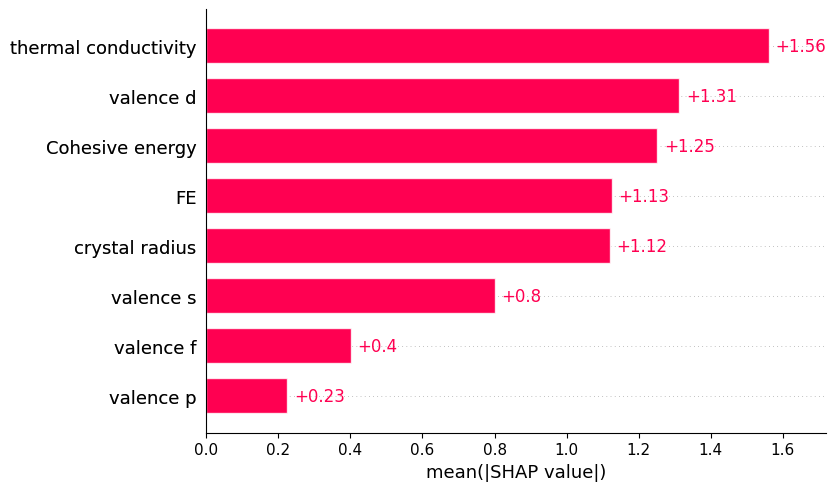

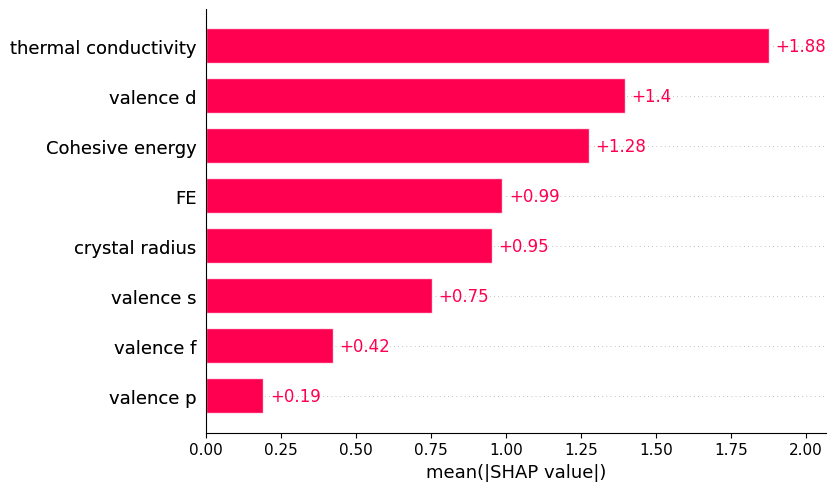

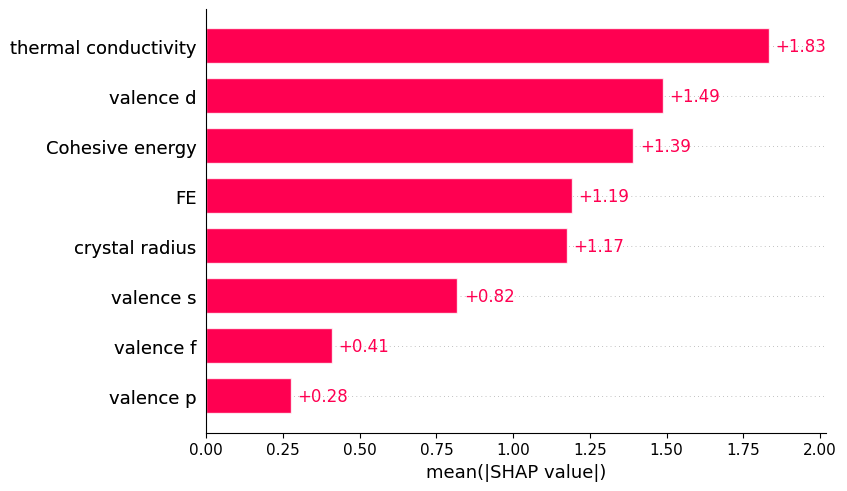

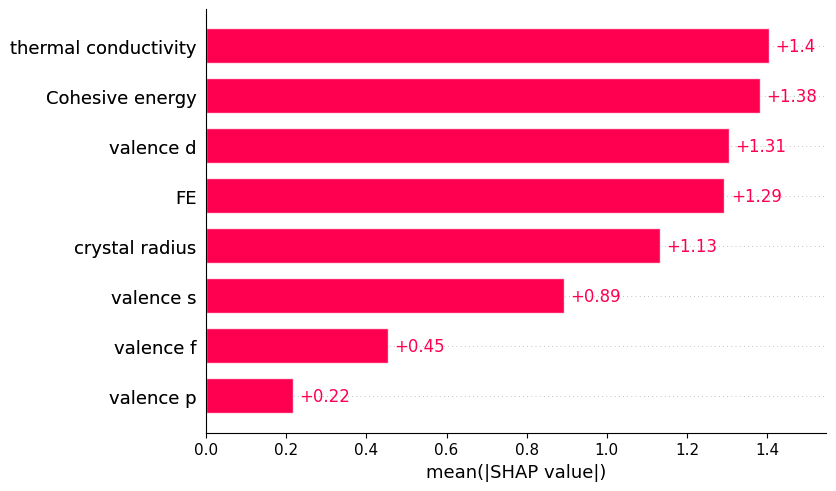

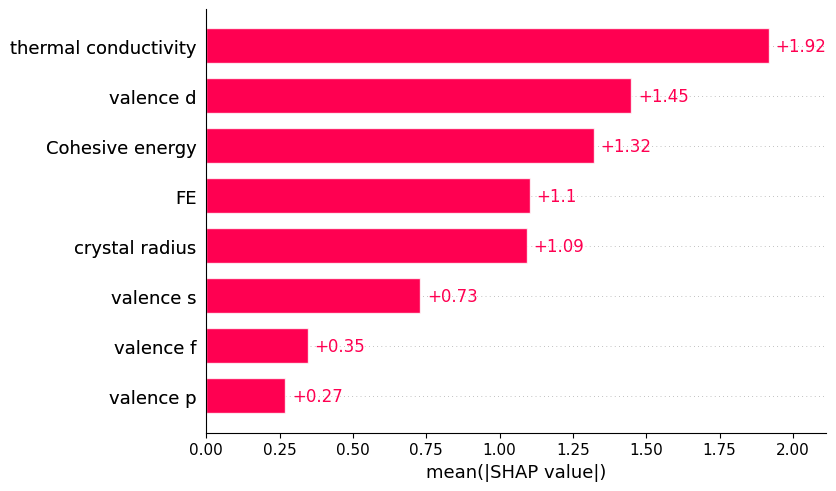

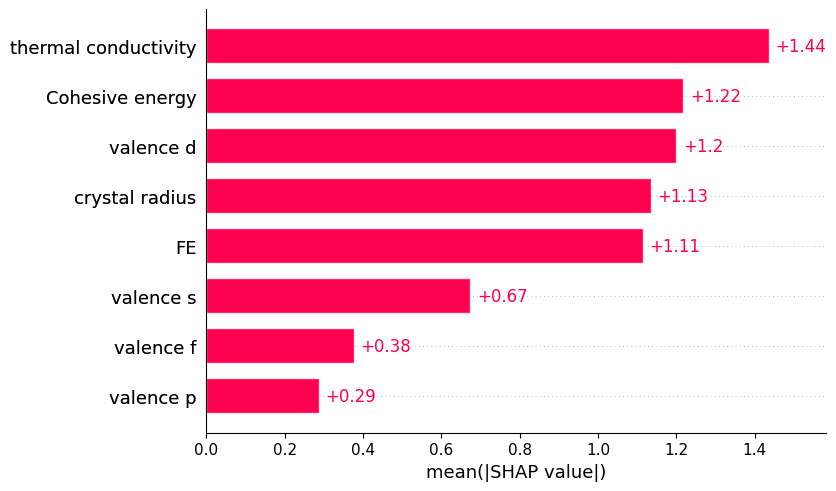

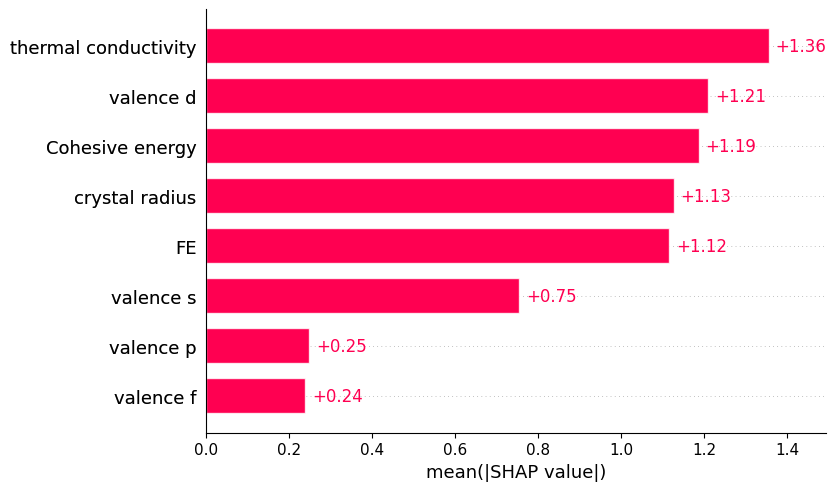

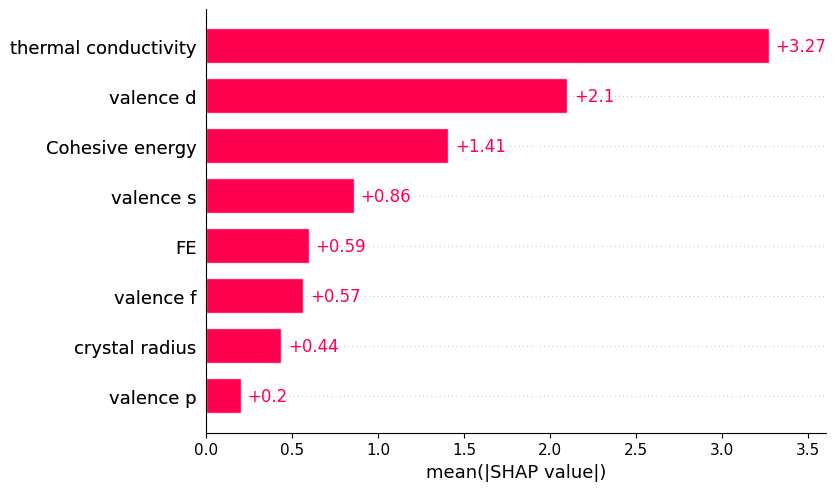

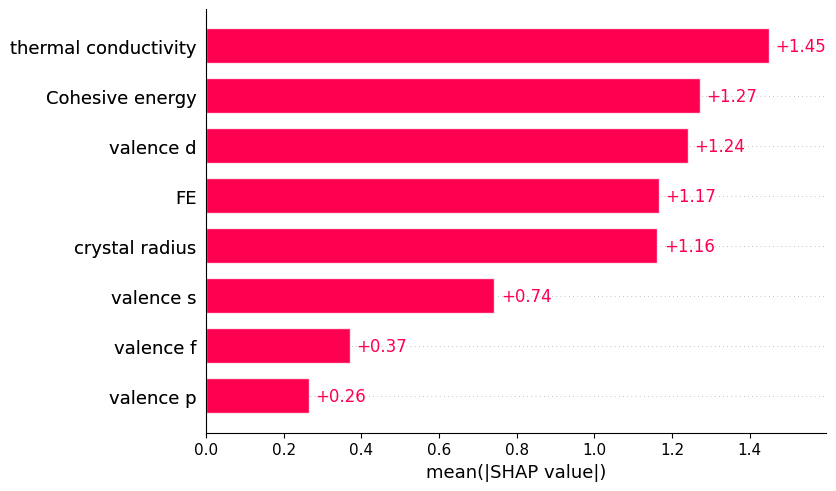

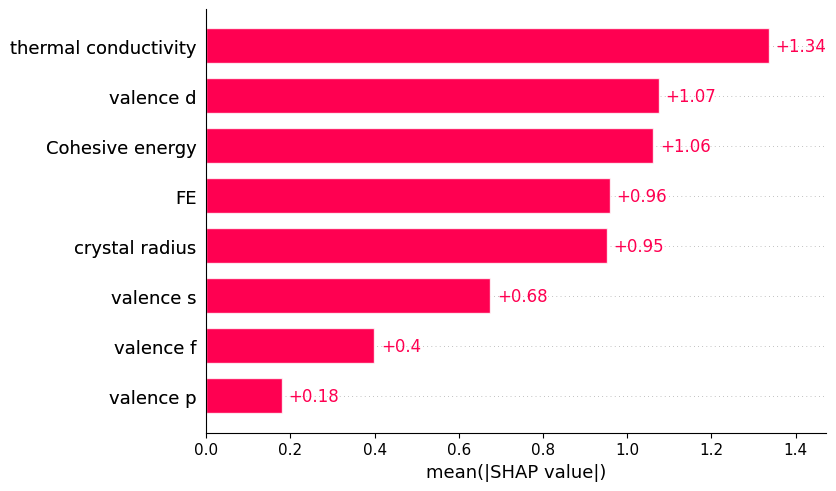

In [ ]:
model_GP3.plot_SHAP('all')

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_KNN3.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Exact explainer: 138it [00:12,  1.65it/s]                         


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 9 finished



In [ ]:
model_KNN3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,thermal conductivity,1.0,100.0,1.000000
4,valence d,2.3,100.0,0.813478
5,valence f,3.2,100.0,0.773125
7,Cohesive energy,3.7,100.0,0.759189
1,FE,5.3,100.0,0.732264
3,valence p,5.9,100.0,0.725932
2,valence s,6.8,100.0,0.718529
0,crystal radius,7.8,100.0,0.712308


In [ ]:
model_KNN3.show_shap_ranks()

{'crystal radius': [8, 7, 8, 8, 8, 8, 7, 8, 8, 8],
 'FE': [4, 4, 5, 5, 5, 6, 5, 7, 7, 5],
 'valence s': [6, 8, 7, 7, 7, 7, 8, 6, 6, 6],
 'valence p': [7, 6, 6, 6, 6, 5, 6, 5, 5, 7],
 'valence d': [5, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [3, 5, 3, 3, 3, 3, 3, 3, 3, 3],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [2, 3, 4, 4, 4, 4, 4, 4, 4, 4]}

In [ ]:
model_KNN3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.358874,0.075020,13.221019,20.616713,0.176696
1,1,0.100656,-0.136539,17.065171,17.208598,0.200028
2,2,0.334336,0.251240,14.093475,16.326610,0.177650
3,3,0.305133,0.230685,14.528131,15.978993,0.238998
4,4,0.275250,0.008333,15.236395,15.910115,0.140323
5,5,0.263356,0.343069,15.069873,14.478163,0.116461
6,6,0.258400,0.567211,15.579749,9.897590,0.169720
7,7,0.531397,-0.163485,10.737347,24.660396,0.463471
8,8,0.222954,0.709962,16.165709,7.721510,0.226500
9,9,0.241723,0.493287,15.553644,11.621951,0.160967


In [ ]:
model_KNN3.show_parameters()

{0: OrderedDict([('n_neighbors', 5), ('p', 1), ('weights', 'distance')]),
 1: OrderedDict([('n_neighbors', 8), ('p', 1), ('weights', 'distance')]),
 2: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 14), ('p', 2), ('weights', 'distance')]),
 4: OrderedDict([('n_neighbors', 7), ('p', 2), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 20), ('p', 2), ('weights', 'distance')]),
 6: OrderedDict([('n_neighbors', 19), ('p', 2), ('weights', 'distance')]),
 7: OrderedDict([('n_neighbors', 17), ('p', 2), ('weights', 'distance')]),
 8: OrderedDict([('n_neighbors', 21), ('p', 1), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')])}

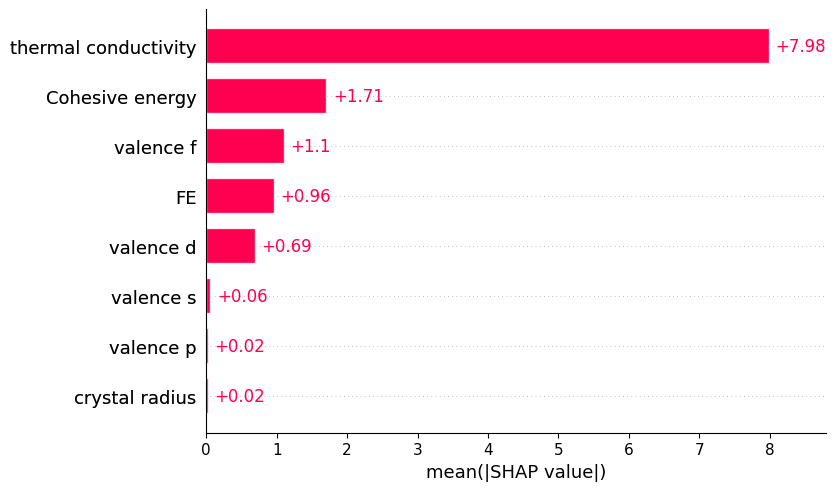

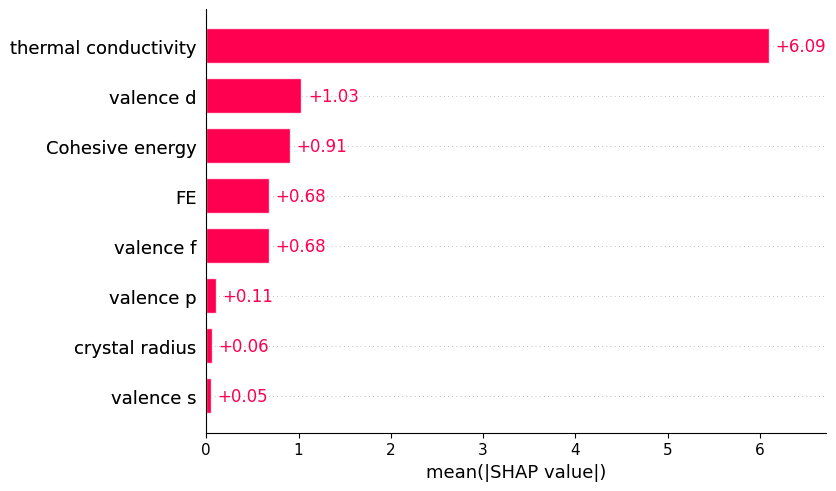

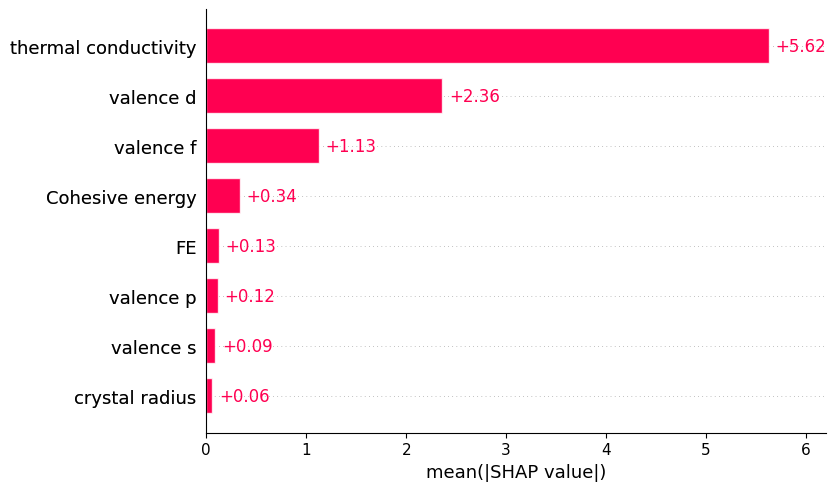

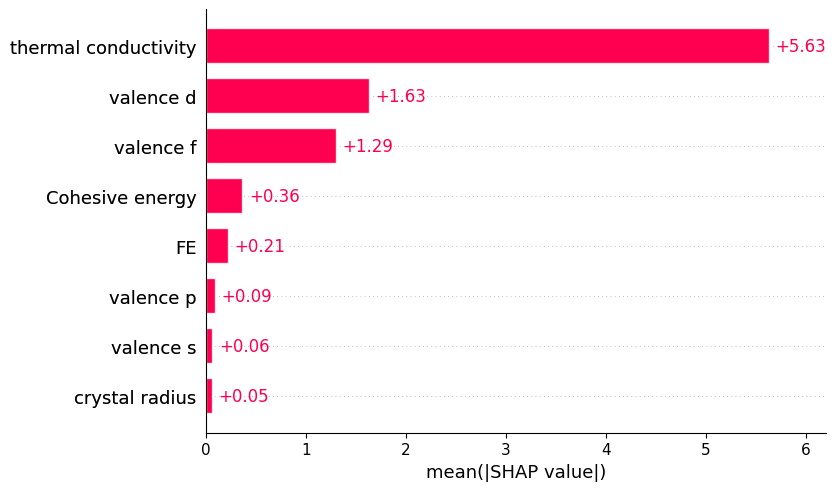

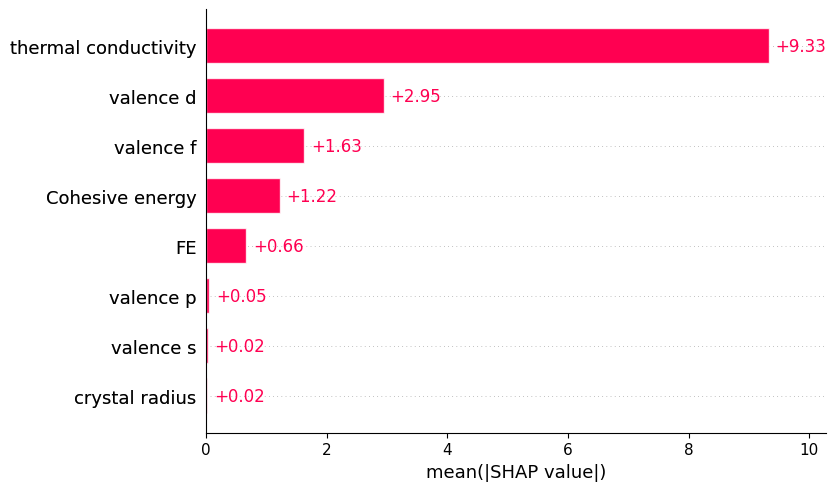

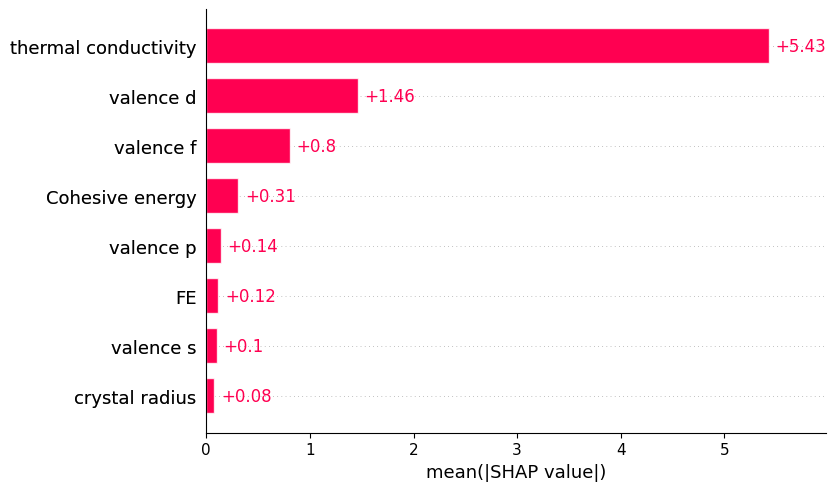

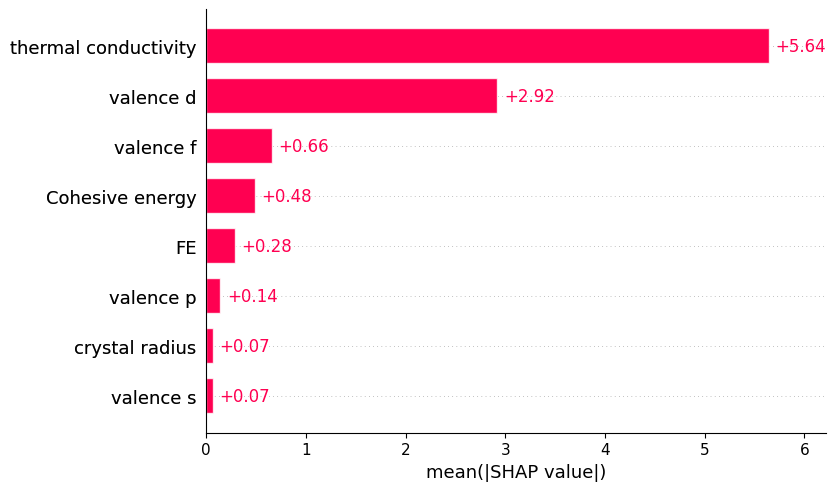

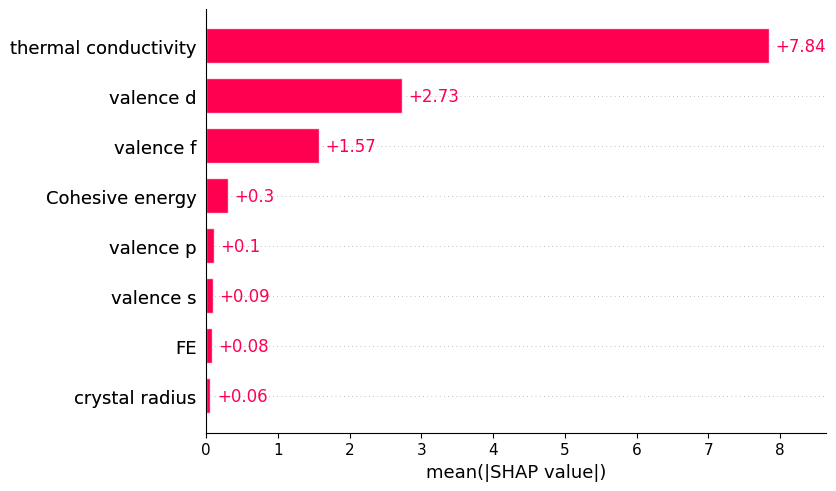

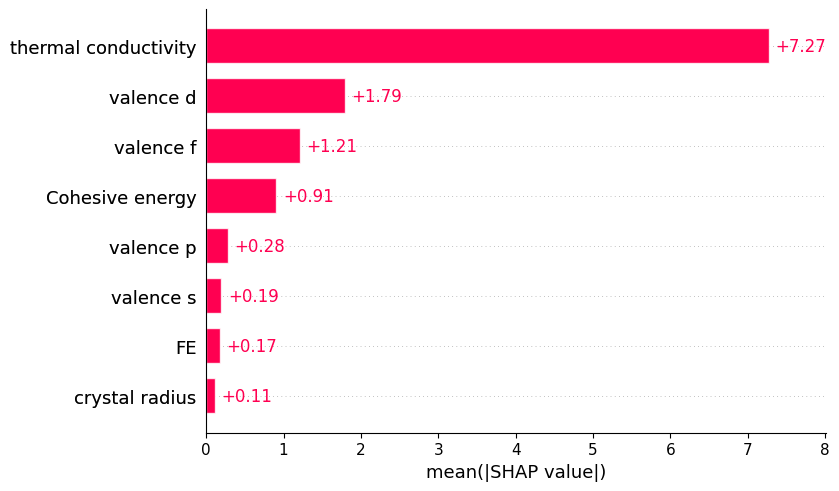

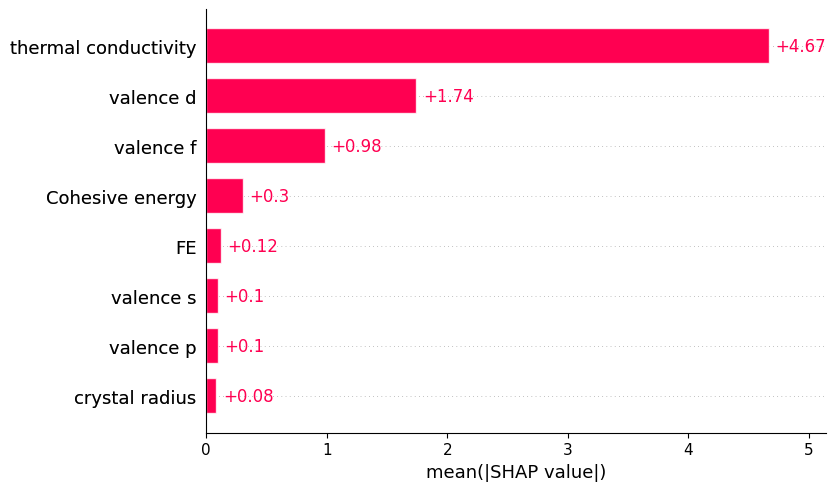

In [ ]:
model_KNN3.plot_SHAP('all')

## 4.IIS ranking

In [ ]:
IIS_data_fit_regular = IISDataAnalysis(results=results_fit1,
                           IIS=IIS_fit1,
                           models=models_fit1,
                           results_csv_name='df_results_fit_regular_set1.csv',
                           models_joblib_name='models_fit_regular_set1.joblib',
                           iis_full_csv_name='df_IIS_full_fit_regular_set1.csv',
                           iis_csv_name='df_IIS_fit_regular_set1.csv')

In [ ]:
IIS_data_fit_regular.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.317203,0.293085,14.438957,14.983208,0.219459
RandomForestRegressor,0.320993,0.313676,14.399330,14.761858,0.231389
GradientBoostingRegressor,0.326087,0.317331,14.344554,14.727223,0.239305
XGBRegressor,0.320971,0.316638,14.400487,14.724800,0.239234
SVR,0.292247,0.327210,14.702712,14.614907,0.228749
GaussianProcessRegressor,0.322761,0.315135,14.380450,14.751533,0.229853
KNeighborsRegressor,0.289208,0.237878,14.725051,15.442064,0.207081


In [ ]:
IIS_data_fit_regular.show_IIS_values()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.751500,0.698806,0.341333,0.133000,0.557846,0.311000,0.546000,0.905714
RandomForestRegressor,0.761667,0.835000,0.732264,0.712857,0.820000,0.715205,0.730000,0.807500
GradientBoostingRegressor,0.767059,0.807500,0.589878,0.579279,0.780000,0.588800,0.734706,0.843684
XGBRegressor,0.770000,0.970000,0.250500,0.114143,0.770000,0.393929,0.597395,0.813478
SVR,0.711250,0.717143,0.730000,0.730000,0.835000,0.752500,1.000000,0.780000
GaussianProcessRegressor,0.736000,0.746744,0.726897,0.711772,0.813478,0.717143,1.000000,0.792222
KNeighborsRegressor,0.712308,0.732264,0.718529,0.725932,0.813478,0.773125,1.000000,0.759189


In [ ]:
IIS_data_fit_regular.show_IIS_details()

crystal radius          FE  \
DecisionTreeRegressor     Mean Rank                    2.222222    3.444444   
                          Non-Zero Frequency(%)       90.000000   90.000000   
                          IIS                          0.751500    0.698806   
RandomForestRegressor     Mean Rank                    3.600000    2.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.761667    0.835000   
GradientBoostingRegressor Mean Rank                    3.400000    2.400000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.767059    0.807500   
XGBRegressor              Mean Rank                    3.300000    1.100000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.770000    0.970000   
SVR                       Mean Rank                    8.000000    7.000000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.711250    0.717143   
GaussianProcessRegressor  Mean Rank                    5.000000    4.300000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.736000    0.746744   
KNeighborsRegressor       Mean Rank                    7.800000    5.300000   
                          Non-Zero Frequency(%)      100.000000  100.000000   
                          IIS                          0.712308    0.732264   

                                                  valence s   valence p  \
DecisionTreeRegressor     Mean Rank                4.500000    5.000000   
                          Non-Zero Frequency(%)   40.000000   10.000000   
                          IIS                      0.341333    0.133000   
RandomForestRegressor     Mean Rank                5.300000    7.700000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.732264    0.712857   
GradientBoostingRegressor Mean Rank                6.125000    7.625000   
                          Non-Zero Frequency(%)   80.000000   80.000000   
                          IIS                      0.589878    0.579279   
XGBRegressor              Mean Rank                6.666667    7.000000   
                          Non-Zero Frequency(%)   30.000000   10.000000   
                          IIS                      0.250500    0.114143   
SVR                       Mean Rank                5.500000    5.500000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.730000    0.730000   
GaussianProcessRegressor  Mean Rank                5.800000    7.900000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.726897    0.711772   
KNeighborsRegressor       Mean Rank                6.800000    5.900000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.718529    0.725932   

                                                  valence d   valence f  \
DecisionTreeRegressor     Mean Rank                3.714286    3.000000   
                          Non-Zero Frequency(%)   70.000000   30.000000   
                          IIS                      0.557846    0.311000   
RandomForestRegressor     Mean Rank                2.200000    7.300000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.820000    0.715205   
GradientBoostingRegressor Mean Rank                3.000000    6.250000   
                          Non-Zero Frequency(%)  100.000000

In [ ]:
IIS_data_fit_regular.show_IIS_ranks()

,crystal radius,FE,valence s,valence p,valence d,valence f,thermal conductivity,Cohesive energy
DecisionTreeRegressor,2,3,6,8,4,7,5,1
RandomForestRegressor,4,1,5,8,2,7,6,3
GradientBoostingRegressor,4,2,6,8,3,7,5,1
XGBRegressor,3,1,7,8,3,6,5,2
SVR,8,7,5,5,2,4,1,3
GaussianProcessRegressor,5,4,6,8,2,7,1,3
KNeighborsRegressor,8,5,7,6,2,3,1,4


In [ ]:
IIS_data_fit_regular.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.429,1.134
1,valence d,2.571,0.787
2,FE,3.286,2.215
3,thermal conductivity,3.429,2.299
4,crystal radius,4.857,2.340
5,valence f,5.857,1.676
6,valence s,6.000,0.816
7,valence p,7.286,1.254


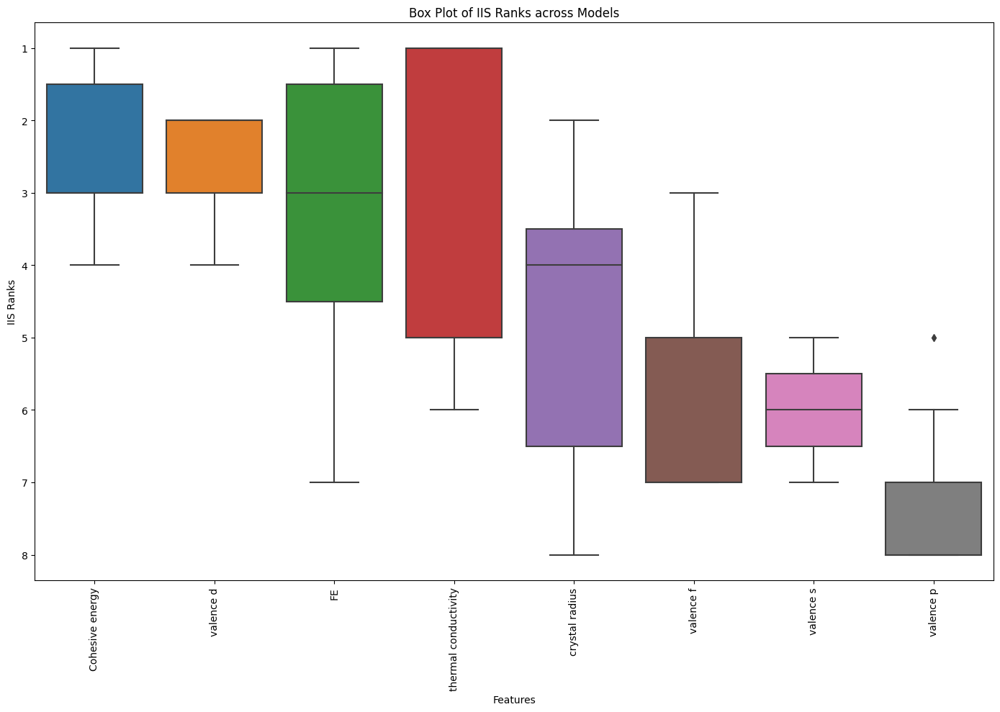

In [ ]:
IIS_data_fit_regular.plot_IIS_mean_rank()